# Cycle GAN
Download the dataset and supporting codes and pre-trained models

https://drive.google.com/file/d/1D3m6I2S8xIvdOHBkvwSSFof5OTJZCDSt/view?usp=drivesdk

https://drive.google.com/file/d/1CDRMyBA3Hk_gmbk1xkAm7aRHXBOQQigu/view?usp=drivesdk

https://drive.google.com/file/d/1so6AQ0_Pg255COjAzEOOVPlDzTJFVQro/view?usp=drivesdk

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
from google.colab import auth
auth.authenticate_user()
from googleapiclient.discovery import build
drive_service = build('drive', 'v3')
import io
import os
from googleapiclient.http import MediaIoBaseDownload
def download_file(fn, file_id):
    request = drive_service.files().get_media(fileId=file_id)
    downloaded = io.BytesIO()
    downloader = MediaIoBaseDownload(downloaded, request)
    done = False
    while done is False:
        # _ is a placeholder for a progress object that we ignore.
        # (Our file is small, so we skip reporting progress.)
        _, done = downloader.next_chunk()
    downloaded.seek(0)
    folder = fn.split('/')
    if len(folder) > 1:
        os.makedirs(folder[0], exist_ok=True)
    with open(fn, 'wb') as f:
        f.write(downloaded.read())
id_to_fn = {
# '1D3rH-gSxIECZnoyc5k77PEucKBVzoiBc': 'edges2shoes.zip',
# '1D3m6I2S8xIvdOHBkvwSSFof5OTJZCDSt': 'edges2shoes.zip',
# '1CDRMyBA3Hk_gmbk1xkAm7aRHXBOQQigu': 'CycleGAN_support.zip',
# '1so6AQ0_Pg255COjAzEOOVPlDzTJFVQro': 'test_case.zip',
'1l7gHikhCz64hYHL4n_Ps7nufQcddcRyR': 'test_case.zip'

}
# download all files into the vm
for fid, fn in id_to_fn.items():
    print("Downloading %s from %s" % (fn, fid))
    download_file(fn, fid)

In [3]:
! unzip -q /content/drive/MyDrive/proj5/CIS-6800/edges2shoes.zip -d /content/edges2shoes
# ! unzip -q CycleGAN_support.zip
! unzip -q test_case.zip

# CycleGAN training (TODO)

In [4]:
import torch
import pdb
from datasets import *
from models import *

D_A = torch.load('test_case/D_A.pt')
D_B = torch.load('test_case/D_B.pt')
G_BA = torch.load('test_case/G_BA.pt')
G_AB = torch.load('test_case/G_AB.pt')
valid = torch.load('test_case/valid.pt')
fake = torch.load('test_case/fake.pt')
fake_A = torch.load('test_case/fake_A.pt')
fake_B = torch.load('test_case/fake_B.pt')
real_A = torch.load('test_case/real_A.pt')
real_B = torch.load('test_case/real_B.pt')
criterion_GAN = torch.load('test_case/criterion_GAN.pt')
criterion_cycle = torch.load('test_case/criterion_cycle.pt')



def loss_discriminator(fakefG, D, real2D, valid, fake, criterion_GAN):
    '''
    loss_discriminator function is applied to compute loss for discriminator D_A and D_B,
    For example, we want to compute loss for D_A. The loss is consisted of two parts:
    D(real_A) and D(G(real_B)). We want to penalize the distance between D(real_A) part and 1 and
    distance between D(G(real_B)) part and 0.
    We will want to first compute discriminator loss given real_A and valid, which is all 1.
    Then we want to forward real_A through G_AB network to get fake image batch
    and compute discriminator loss given fake batch and fake, which is all 0.
    Finall, add up these two loss as the total discriminator loss.
    '''

    # Forward pass real images through the discriminator and compute loss for real images
    real_out = D(real2D.detach())
    loss_real = criterion_GAN(real_out, valid)

    # Forward pass fake images through the discriminator and compute loss for fake images
    fake_out = D(fakefG.detach())
    loss_fake = criterion_GAN(fake_out, fake)

    # Combine losses for the total discriminator loss
    loss_D = loss_real + loss_fake

    return loss_D

def loss_generator(G, real2G, D, valid, criterion_GAN):
    '''
    loss_generator function is applied to compute loss for both generator G_AB and G_BA:
    For example, we want to compute the loss for G_AB.
    real2G will be the real image in domain A, then we map real2G into domain B to get fake B,
    then we compute the loss between D_B(fake_B) and valid, which is all 1.
    The fake_B image will also be one of the outputs, since we want to use it in the loss_cycle_consis.
    '''
    # Generate fake images from real images using the generator
    fake_images = G(real2G)

    # Pass fake images through the discriminator
    discriminator_out = D(fake_images)

    # Calculate loss for the generator based on the discriminator's response to the fake images
    loss_G = criterion_GAN(discriminator_out, valid)

    return loss_G, fake_images

def loss_cycle_consis(G, fakefG, real, criterion_cycle):
    '''
    loss_cycle_consis function is applied to both cycle consistency loss:
    between recovered A and original A,
    between recovered B and original B.
    For example, we want to compute the cycle consistency loss between recovered A and original A.
    fake2G will be the generated image in domain B, then we map fake2G back into domain A to get recovered A,
    then we compute the loss between recovered A and original A
    '''
    # Transform images back to the original domain
    recovered_images = G(fakefG)

    # Calculate cycle consistency loss by comparing the recovered images to the original images
    loss_cycle = criterion_cycle(recovered_images, real)

    return loss_cycle


# test case

test_loss_GAN_AB = torch.load('test_case/loss_GAN_AB.pt')
test_loss_cycle_A = torch.load('test_case/loss_cycle_A.pt')
test_loss_D_A = torch.load('test_case/loss_D_A.pt')
loss_GAN_AB, fake_B = loss_generator(G_AB, real_A, D_B, valid, criterion_GAN)
loss_cycle_A = loss_cycle_consis(G_BA, fake_B, real_A, criterion_cycle)
loss_D_A = loss_discriminator(fake_A, D_A, real_A, valid, fake, criterion_GAN)


print('test case loss_D_A:', test_loss_D_A.item())
print('computed loss_D_A:', loss_D_A.item())

print('test case test_loss_GAN_AB:', test_loss_GAN_AB.item())
print('computed test_loss_GAN_AB:', loss_GAN_AB.item())

print('test case loss_cycle_A:', test_loss_cycle_A.item())
print('computed loss_cycle_A:', loss_cycle_A.item())

test case loss_D_A: 3.1760239601135254
computed loss_D_A: 3.176025390625
test case test_loss_GAN_AB: 3.164881467819214
computed test_loss_GAN_AB: 3.164875030517578
test case loss_cycle_A: 0.6627261638641357
computed loss_cycle_A: 0.6627261638641357


the length of training data: 49825


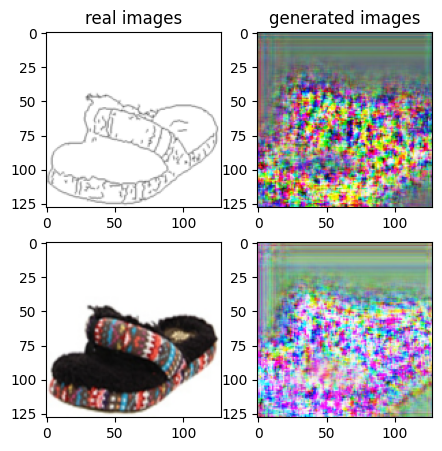

Train Epoch: 1 0% 	Total Loss: 8.899441 	Loss_G_AB: 1.899427	Loss_G_BA: 2.040381	Loss_cycle: 3.770660	Loss_D_A: 1.492141	Loss_D_B: 1.666736
0 9 T:  2.576864004135132
Train Epoch: 1 0% 	Total Loss: 7.268089 	Loss_G_AB: 1.741317	Loss_G_BA: 1.401125	Loss_cycle: 2.181835	Loss_D_A: 1.154983	Loss_D_B: 2.360050
0 19 T:  0.9175174236297607
Train Epoch: 1 0% 	Total Loss: 3.742190 	Loss_G_AB: 0.830407	Loss_G_BA: 1.073864	Loss_cycle: 1.461038	Loss_D_A: 0.731388	Loss_D_B: 0.597628
0 29 T:  0.91314697265625
Train Epoch: 1 0% 	Total Loss: 3.369386 	Loss_G_AB: 0.666973	Loss_G_BA: 0.802266	Loss_cycle: 1.629534	Loss_D_A: 0.517982	Loss_D_B: 0.487250
0 39 T:  1.1949737071990967
Train Epoch: 1 0% 	Total Loss: 3.266409 	Loss_G_AB: 0.607289	Loss_G_BA: 0.754603	Loss_cycle: 1.778145	Loss_D_A: 0.453000	Loss_D_B: 0.354317
0 49 T:  1.7332231998443604
Train Epoch: 1 0% 	Total Loss: 2.961879 	Loss_G_AB: 0.569656	Loss_G_BA: 0.753620	Loss_cycle: 1.494652	Loss_D_A: 0.374042	Loss_D_B: 0.431546
0 59 T:  1.5681560039520

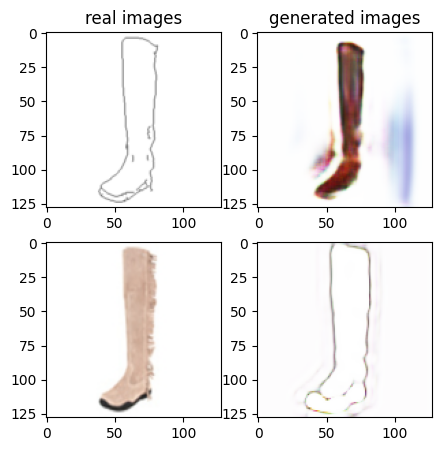

Train Epoch: 1 2% 	Total Loss: 1.849398 	Loss_G_AB: 0.489616	Loss_G_BA: 0.724068	Loss_cycle: 0.797273	Loss_D_A: 0.141400	Loss_D_B: 0.303883
0 1009 T:  1.590230941772461
Train Epoch: 1 2% 	Total Loss: 1.648808 	Loss_G_AB: 0.340710	Loss_G_BA: 0.736050	Loss_cycle: 0.777502	Loss_D_A: 0.074076	Loss_D_B: 0.258850
0 1019 T:  0.9968669414520264
Train Epoch: 1 2% 	Total Loss: 1.918043 	Loss_G_AB: 0.333548	Loss_G_BA: 0.896674	Loss_cycle: 0.906397	Loss_D_A: 0.139997	Loss_D_B: 0.256538
0 1029 T:  1.002439022064209
Train Epoch: 1 2% 	Total Loss: 1.870086 	Loss_G_AB: 0.465829	Loss_G_BA: 0.762130	Loss_cycle: 0.751668	Loss_D_A: 0.122521	Loss_D_B: 0.381918
0 1039 T:  1.0068154335021973
Train Epoch: 1 2% 	Total Loss: 1.766878 	Loss_G_AB: 0.480666	Loss_G_BA: 0.675771	Loss_cycle: 0.573074	Loss_D_A: 0.144437	Loss_D_B: 0.471149
0 1049 T:  0.9880383014678955
Train Epoch: 1 2% 	Total Loss: 1.712010 	Loss_G_AB: 0.357050	Loss_G_BA: 0.714325	Loss_cycle: 0.782175	Loss_D_A: 0.100413	Loss_D_B: 0.293735
0 1059 T:  0

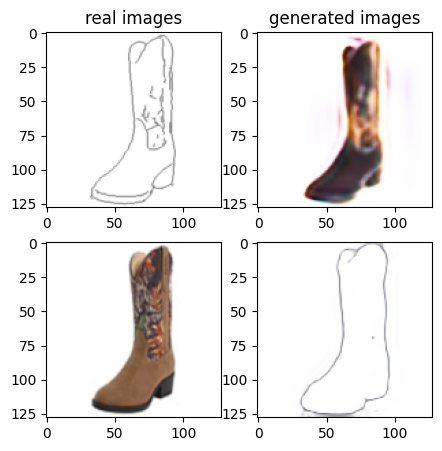

Train Epoch: 1 4% 	Total Loss: 1.935441 	Loss_G_AB: 0.395938	Loss_G_BA: 0.799401	Loss_cycle: 0.930580	Loss_D_A: 0.056815	Loss_D_B: 0.350377
0 2009 T:  2.1249146461486816
Train Epoch: 1 4% 	Total Loss: 1.727721 	Loss_G_AB: 0.300265	Loss_G_BA: 0.953421	Loss_cycle: 0.795965	Loss_D_A: 0.040090	Loss_D_B: 0.264823
0 2019 T:  0.9956753253936768
Train Epoch: 1 4% 	Total Loss: 1.732510 	Loss_G_AB: 0.364289	Loss_G_BA: 0.910630	Loss_cycle: 0.780824	Loss_D_A: 0.050618	Loss_D_B: 0.263609
0 2029 T:  0.9834868907928467
Train Epoch: 1 4% 	Total Loss: 1.683711 	Loss_G_AB: 0.322691	Loss_G_BA: 0.877737	Loss_cycle: 0.760376	Loss_D_A: 0.075086	Loss_D_B: 0.248035
0 2039 T:  0.9948556423187256
Train Epoch: 1 4% 	Total Loss: 1.529725 	Loss_G_AB: 0.359194	Loss_G_BA: 0.686830	Loss_cycle: 0.619209	Loss_D_A: 0.112948	Loss_D_B: 0.274557
0 2049 T:  0.9884345531463623
Train Epoch: 1 4% 	Total Loss: 1.628205 	Loss_G_AB: 0.358440	Loss_G_BA: 0.652380	Loss_cycle: 0.690044	Loss_D_A: 0.142044	Loss_D_B: 0.290708
0 2059 T: 

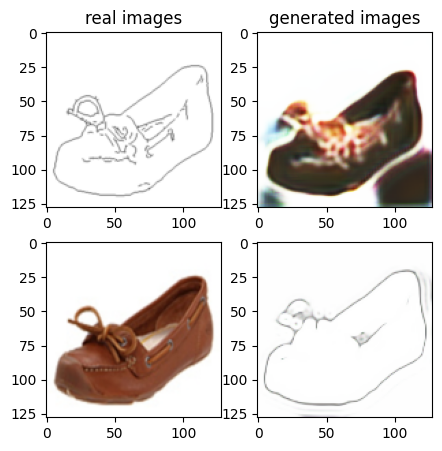

Train Epoch: 1 6% 	Total Loss: 1.761234 	Loss_G_AB: 0.341710	Loss_G_BA: 1.007583	Loss_cycle: 0.767317	Loss_D_A: 0.073531	Loss_D_B: 0.245740
0 3009 T:  1.653609275817871
Train Epoch: 1 6% 	Total Loss: 1.582853 	Loss_G_AB: 0.345070	Loss_G_BA: 0.832881	Loss_cycle: 0.711796	Loss_D_A: 0.046441	Loss_D_B: 0.235641
0 3019 T:  0.9943604469299316
Train Epoch: 1 6% 	Total Loss: 1.680457 	Loss_G_AB: 0.357313	Loss_G_BA: 0.808083	Loss_cycle: 0.762139	Loss_D_A: 0.070854	Loss_D_B: 0.264766
0 3029 T:  0.9843919277191162
Train Epoch: 1 6% 	Total Loss: 1.779256 	Loss_G_AB: 0.373678	Loss_G_BA: 0.903546	Loss_cycle: 0.779067	Loss_D_A: 0.108039	Loss_D_B: 0.253538
0 3039 T:  0.9871206283569336
Train Epoch: 1 6% 	Total Loss: 1.908536 	Loss_G_AB: 0.339912	Loss_G_BA: 0.943611	Loss_cycle: 0.945266	Loss_D_A: 0.031447	Loss_D_B: 0.290060
0 3049 T:  0.995887279510498
Train Epoch: 1 6% 	Total Loss: 2.095326 	Loss_G_AB: 0.373908	Loss_G_BA: 0.989565	Loss_cycle: 1.140391	Loss_D_A: 0.050207	Loss_D_B: 0.222992
0 3059 T:  0

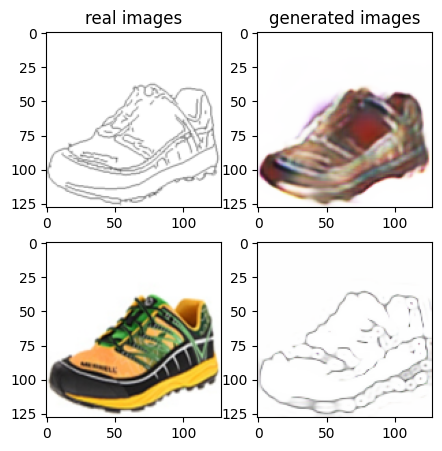

Train Epoch: 1 8% 	Total Loss: 1.705791 	Loss_G_AB: 0.283368	Loss_G_BA: 0.853077	Loss_cycle: 0.720287	Loss_D_A: 0.108840	Loss_D_B: 0.308442
0 4009 T:  1.6533567905426025
Train Epoch: 1 8% 	Total Loss: 1.747639 	Loss_G_AB: 0.348097	Loss_G_BA: 0.964849	Loss_cycle: 0.758142	Loss_D_A: 0.077414	Loss_D_B: 0.255610
0 4019 T:  1.0045530796051025
Train Epoch: 1 8% 	Total Loss: 1.582008 	Loss_G_AB: 0.319689	Loss_G_BA: 0.886332	Loss_cycle: 0.692710	Loss_D_A: 0.041888	Loss_D_B: 0.244399
0 4029 T:  1.0079669952392578
Train Epoch: 1 8% 	Total Loss: 1.684343 	Loss_G_AB: 0.316186	Loss_G_BA: 0.893789	Loss_cycle: 0.805366	Loss_D_A: 0.038994	Loss_D_B: 0.234995
0 4039 T:  1.0161349773406982
Train Epoch: 1 8% 	Total Loss: 1.538387 	Loss_G_AB: 0.268813	Loss_G_BA: 0.660917	Loss_cycle: 0.686137	Loss_D_A: 0.137309	Loss_D_B: 0.250076
0 4049 T:  1.0162763595581055
Train Epoch: 1 8% 	Total Loss: 2.031120 	Loss_G_AB: 0.384479	Loss_G_BA: 0.775745	Loss_cycle: 1.133734	Loss_D_A: 0.062001	Loss_D_B: 0.255273
0 4059 T: 

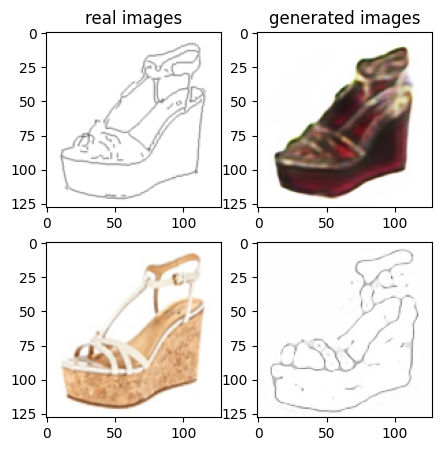

Train Epoch: 1 10% 	Total Loss: 1.738291 	Loss_G_AB: 0.327617	Loss_G_BA: 0.794691	Loss_cycle: 0.853502	Loss_D_A: 0.064168	Loss_D_B: 0.259467
0 5009 T:  1.93696928024292
Train Epoch: 1 10% 	Total Loss: 1.633358 	Loss_G_AB: 0.318602	Loss_G_BA: 0.723950	Loss_cycle: 0.769716	Loss_D_A: 0.106647	Loss_D_B: 0.235720
0 5019 T:  1.0190532207489014
Train Epoch: 1 10% 	Total Loss: 1.942770 	Loss_G_AB: 0.356704	Loss_G_BA: 0.874115	Loss_cycle: 0.973674	Loss_D_A: 0.074242	Loss_D_B: 0.279444
0 5029 T:  0.9977262020111084
Train Epoch: 1 10% 	Total Loss: 1.408430 	Loss_G_AB: 0.290746	Loss_G_BA: 0.712765	Loss_cycle: 0.553561	Loss_D_A: 0.100619	Loss_D_B: 0.252496
0 5039 T:  0.9949567317962646
Train Epoch: 1 10% 	Total Loss: 1.625352 	Loss_G_AB: 0.292541	Loss_G_BA: 0.859731	Loss_cycle: 0.733897	Loss_D_A: 0.059377	Loss_D_B: 0.255942
0 5049 T:  0.9881134033203125
Train Epoch: 1 10% 	Total Loss: 1.699625 	Loss_G_AB: 0.279090	Loss_G_BA: 0.932305	Loss_cycle: 0.748923	Loss_D_A: 0.091477	Loss_D_B: 0.253527
0 5059

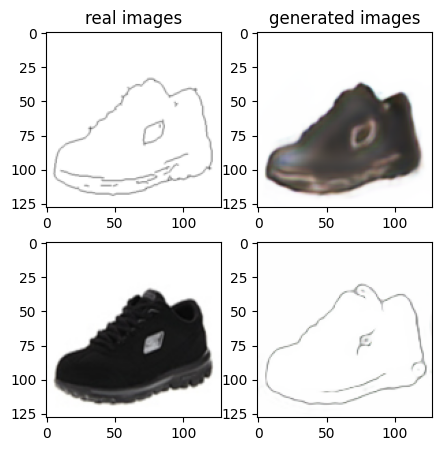

Train Epoch: 1 12% 	Total Loss: 1.651852 	Loss_G_AB: 0.302849	Loss_G_BA: 0.934830	Loss_cycle: 0.733631	Loss_D_A: 0.051470	Loss_D_B: 0.247912
0 6009 T:  1.6215417385101318
Train Epoch: 1 12% 	Total Loss: 1.831782 	Loss_G_AB: 0.317078	Loss_G_BA: 0.984723	Loss_cycle: 0.931374	Loss_D_A: 0.028228	Loss_D_B: 0.221280
0 6019 T:  0.9877848625183105
Train Epoch: 1 12% 	Total Loss: 1.571540 	Loss_G_AB: 0.316339	Loss_G_BA: 0.944509	Loss_cycle: 0.668031	Loss_D_A: 0.031582	Loss_D_B: 0.241503
0 6029 T:  0.9879574775695801
Train Epoch: 1 12% 	Total Loss: 1.511509 	Loss_G_AB: 0.356943	Loss_G_BA: 0.821853	Loss_cycle: 0.623096	Loss_D_A: 0.063444	Loss_D_B: 0.235571
0 6039 T:  0.9879469871520996
Train Epoch: 1 12% 	Total Loss: 1.687414 	Loss_G_AB: 0.335607	Loss_G_BA: 0.908635	Loss_cycle: 0.732555	Loss_D_A: 0.052975	Loss_D_B: 0.279763
0 6049 T:  0.9885921478271484
Train Epoch: 1 12% 	Total Loss: 1.721966 	Loss_G_AB: 0.389860	Loss_G_BA: 0.712684	Loss_cycle: 0.812495	Loss_D_A: 0.120330	Loss_D_B: 0.237869
0 60

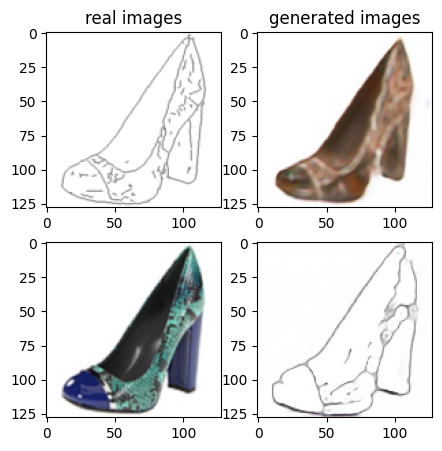

Train Epoch: 1 14% 	Total Loss: 1.704157 	Loss_G_AB: 0.362855	Loss_G_BA: 0.963030	Loss_cycle: 0.673807	Loss_D_A: 0.042001	Loss_D_B: 0.325407
0 7009 T:  1.6714410781860352
Train Epoch: 1 14% 	Total Loss: 1.728833 	Loss_G_AB: 0.403558	Loss_G_BA: 0.949904	Loss_cycle: 0.701904	Loss_D_A: 0.024828	Loss_D_B: 0.325371
0 7019 T:  0.9915120601654053
Train Epoch: 1 14% 	Total Loss: 1.537449 	Loss_G_AB: 0.328459	Loss_G_BA: 0.856498	Loss_cycle: 0.617709	Loss_D_A: 0.054511	Loss_D_B: 0.272750
0 7029 T:  1.0273382663726807
Train Epoch: 1 14% 	Total Loss: 1.728794 	Loss_G_AB: 0.295940	Loss_G_BA: 0.884732	Loss_cycle: 0.812386	Loss_D_A: 0.079062	Loss_D_B: 0.247010
0 7039 T:  1.085724115371704
Train Epoch: 1 14% 	Total Loss: 1.457972 	Loss_G_AB: 0.286065	Loss_G_BA: 0.863002	Loss_cycle: 0.596663	Loss_D_A: 0.055337	Loss_D_B: 0.231438
0 7049 T:  1.01167893409729
Train Epoch: 1 14% 	Total Loss: 1.599348 	Loss_G_AB: 0.319977	Loss_G_BA: 0.710187	Loss_cycle: 0.700024	Loss_D_A: 0.139673	Loss_D_B: 0.244569
0 7059 

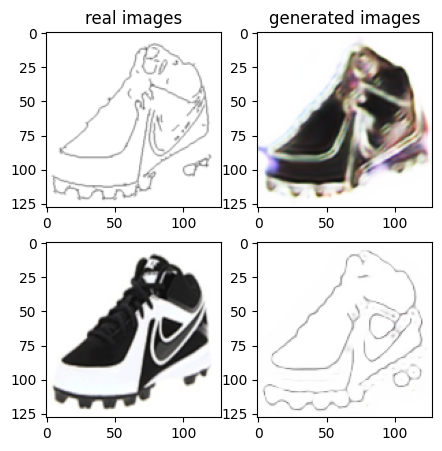

Train Epoch: 1 16% 	Total Loss: 1.505658 	Loss_G_AB: 0.300622	Loss_G_BA: 0.949565	Loss_cycle: 0.575040	Loss_D_A: 0.049359	Loss_D_B: 0.256165
0 8009 T:  2.003833293914795
Train Epoch: 1 16% 	Total Loss: 1.530627 	Loss_G_AB: 0.282691	Loss_G_BA: 0.907992	Loss_cycle: 0.635127	Loss_D_A: 0.051819	Loss_D_B: 0.248340
0 8019 T:  1.0828688144683838
Train Epoch: 1 16% 	Total Loss: 1.587068 	Loss_G_AB: 0.322407	Loss_G_BA: 0.963002	Loss_cycle: 0.658618	Loss_D_A: 0.021470	Loss_D_B: 0.264275
0 8029 T:  1.0846357345581055
Train Epoch: 1 16% 	Total Loss: 1.528798 	Loss_G_AB: 0.277173	Loss_G_BA: 0.897402	Loss_cycle: 0.626675	Loss_D_A: 0.048808	Loss_D_B: 0.266027
0 8039 T:  1.0918385982513428
Train Epoch: 1 16% 	Total Loss: 1.734815 	Loss_G_AB: 0.387000	Loss_G_BA: 0.900888	Loss_cycle: 0.730921	Loss_D_A: 0.047378	Loss_D_B: 0.312573
0 8049 T:  1.0657405853271484
Train Epoch: 1 16% 	Total Loss: 1.621917 	Loss_G_AB: 0.309127	Loss_G_BA: 0.802680	Loss_cycle: 0.761901	Loss_D_A: 0.052794	Loss_D_B: 0.251318
0 805

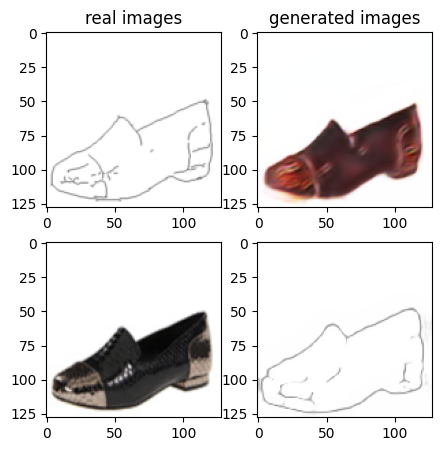

Train Epoch: 1 18% 	Total Loss: 1.517793 	Loss_G_AB: 0.337759	Loss_G_BA: 0.925770	Loss_cycle: 0.553375	Loss_D_A: 0.035713	Loss_D_B: 0.296940
0 9009 T:  2.1971399784088135
Train Epoch: 1 18% 	Total Loss: 1.701589 	Loss_G_AB: 0.300813	Loss_G_BA: 0.973719	Loss_cycle: 0.771638	Loss_D_A: 0.038308	Loss_D_B: 0.254377
0 9019 T:  0.9902961254119873
Train Epoch: 1 18% 	Total Loss: 1.477231 	Loss_G_AB: 0.296707	Loss_G_BA: 0.950198	Loss_cycle: 0.583531	Loss_D_A: 0.038590	Loss_D_B: 0.231658
0 9029 T:  0.9878995418548584
Train Epoch: 1 18% 	Total Loss: 1.530381 	Loss_G_AB: 0.295787	Loss_G_BA: 1.006286	Loss_cycle: 0.582365	Loss_D_A: 0.038120	Loss_D_B: 0.258859
0 9039 T:  0.9893050193786621
Train Epoch: 1 18% 	Total Loss: 1.461552 	Loss_G_AB: 0.347331	Loss_G_BA: 0.817874	Loss_cycle: 0.578106	Loss_D_A: 0.057015	Loss_D_B: 0.243829
0 9049 T:  0.989403247833252
Train Epoch: 1 18% 	Total Loss: 1.767748 	Loss_G_AB: 0.338498	Loss_G_BA: 0.831704	Loss_cycle: 0.836749	Loss_D_A: 0.111639	Loss_D_B: 0.234259
0 905

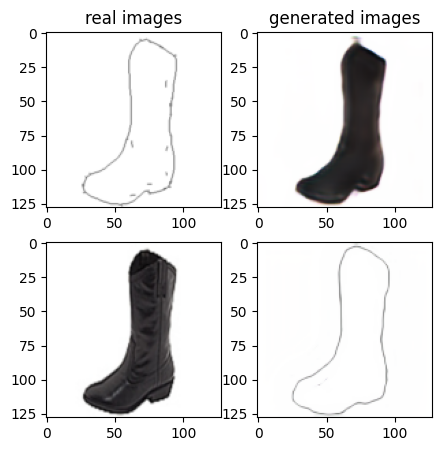

Train Epoch: 1 20% 	Total Loss: 1.517056 	Loss_G_AB: 0.320435	Loss_G_BA: 0.813586	Loss_cycle: 0.651199	Loss_D_A: 0.057577	Loss_D_B: 0.241270
0 10009 T:  1.6864840984344482
Train Epoch: 1 20% 	Total Loss: 1.560714 	Loss_G_AB: 0.332700	Loss_G_BA: 0.841766	Loss_cycle: 0.621336	Loss_D_A: 0.086098	Loss_D_B: 0.266048
0 10019 T:  0.9846651554107666
Train Epoch: 1 20% 	Total Loss: 1.691795 	Loss_G_AB: 0.316569	Loss_G_BA: 0.866063	Loss_cycle: 0.768812	Loss_D_A: 0.058262	Loss_D_B: 0.273405
0 10029 T:  0.9898700714111328
Train Epoch: 1 20% 	Total Loss: 1.598703 	Loss_G_AB: 0.306826	Loss_G_BA: 0.907175	Loss_cycle: 0.617865	Loss_D_A: 0.090614	Loss_D_B: 0.283222
0 10039 T:  0.9873251914978027
Train Epoch: 1 20% 	Total Loss: 1.707136 	Loss_G_AB: 0.305394	Loss_G_BA: 0.914137	Loss_cycle: 0.742873	Loss_D_A: 0.084186	Loss_D_B: 0.270312
0 10049 T:  0.9836816787719727
Train Epoch: 1 20% 	Total Loss: 1.484738 	Loss_G_AB: 0.337038	Loss_G_BA: 0.876719	Loss_cycle: 0.530382	Loss_D_A: 0.069261	Loss_D_B: 0.278217

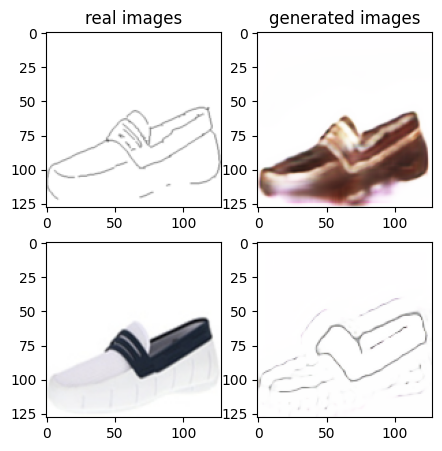

Train Epoch: 1 22% 	Total Loss: 1.422328 	Loss_G_AB: 0.296447	Loss_G_BA: 0.944311	Loss_cycle: 0.535118	Loss_D_A: 0.015002	Loss_D_B: 0.251829
0 11009 T:  1.6337285041809082
Train Epoch: 1 22% 	Total Loss: 1.421315 	Loss_G_AB: 0.335346	Loss_G_BA: 0.892267	Loss_cycle: 0.505808	Loss_D_A: 0.040225	Loss_D_B: 0.261475
0 11019 T:  1.0035107135772705
Train Epoch: 1 22% 	Total Loss: 1.679681 	Loss_G_AB: 0.284132	Loss_G_BA: 1.046481	Loss_cycle: 0.745805	Loss_D_A: 0.012488	Loss_D_B: 0.256081
0 11029 T:  1.0065968036651611
Train Epoch: 1 22% 	Total Loss: 1.581557 	Loss_G_AB: 0.318782	Loss_G_BA: 0.910235	Loss_cycle: 0.683432	Loss_D_A: 0.020958	Loss_D_B: 0.262657
0 11039 T:  1.0195374488830566
Train Epoch: 1 22% 	Total Loss: 1.662186 	Loss_G_AB: 0.289568	Loss_G_BA: 1.020280	Loss_cycle: 0.748448	Loss_D_A: 0.011322	Loss_D_B: 0.247492
0 11049 T:  1.0080475807189941
Train Epoch: 1 22% 	Total Loss: 1.519478 	Loss_G_AB: 0.342409	Loss_G_BA: 1.004434	Loss_cycle: 0.604644	Loss_D_A: 0.009214	Loss_D_B: 0.232199

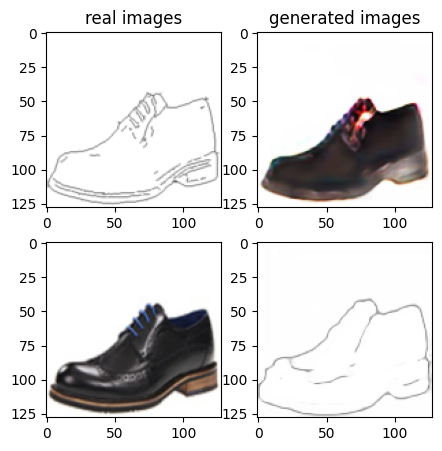

Train Epoch: 1 24% 	Total Loss: 1.508823 	Loss_G_AB: 0.279126	Loss_G_BA: 0.940560	Loss_cycle: 0.634597	Loss_D_A: 0.011946	Loss_D_B: 0.252437
0 12009 T:  1.8816862106323242
Train Epoch: 1 24% 	Total Loss: 1.525432 	Loss_G_AB: 0.287889	Loss_G_BA: 0.969345	Loss_cycle: 0.608258	Loss_D_A: 0.018305	Loss_D_B: 0.270252
0 12019 T:  0.9980590343475342
Train Epoch: 1 24% 	Total Loss: 1.659699 	Loss_G_AB: 0.296386	Loss_G_BA: 1.002439	Loss_cycle: 0.745758	Loss_D_A: 0.015448	Loss_D_B: 0.249080
0 12029 T:  1.002547025680542
Train Epoch: 1 24% 	Total Loss: 1.575545 	Loss_G_AB: 0.317919	Loss_G_BA: 0.984873	Loss_cycle: 0.662254	Loss_D_A: 0.011665	Loss_D_B: 0.250231
0 12039 T:  1.012526273727417
Train Epoch: 1 24% 	Total Loss: 1.595780 	Loss_G_AB: 0.291452	Loss_G_BA: 1.008427	Loss_cycle: 0.700228	Loss_D_A: 0.007995	Loss_D_B: 0.237617
0 12049 T:  1.0183405876159668
Train Epoch: 1 24% 	Total Loss: 1.634578 	Loss_G_AB: 0.312840	Loss_G_BA: 1.047087	Loss_cycle: 0.710618	Loss_D_A: 0.010197	Loss_D_B: 0.233800
0

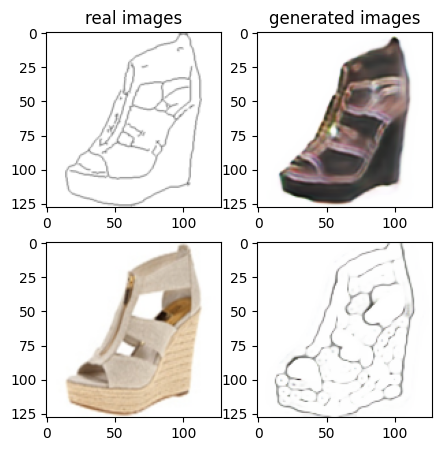

Train Epoch: 1 26% 	Total Loss: 1.323756 	Loss_G_AB: 0.318146	Loss_G_BA: 0.968430	Loss_cycle: 0.404127	Loss_D_A: 0.020908	Loss_D_B: 0.255433
0 13009 T:  1.986985683441162
Train Epoch: 1 26% 	Total Loss: 1.775530 	Loss_G_AB: 0.299569	Loss_G_BA: 0.972428	Loss_cycle: 0.871365	Loss_D_A: 0.012033	Loss_D_B: 0.256134
0 13019 T:  0.986818790435791
Train Epoch: 1 26% 	Total Loss: 1.501753 	Loss_G_AB: 0.274335	Loss_G_BA: 1.000283	Loss_cycle: 0.593013	Loss_D_A: 0.021475	Loss_D_B: 0.249956
0 13029 T:  0.987450122833252
Train Epoch: 1 26% 	Total Loss: 1.579520 	Loss_G_AB: 0.311361	Loss_G_BA: 1.014699	Loss_cycle: 0.635508	Loss_D_A: 0.008073	Loss_D_B: 0.272910
0 13039 T:  0.9913539886474609
Train Epoch: 1 26% 	Total Loss: 1.400308 	Loss_G_AB: 0.296070	Loss_G_BA: 0.941086	Loss_cycle: 0.519265	Loss_D_A: 0.019771	Loss_D_B: 0.242694
0 13049 T:  0.9809246063232422
Train Epoch: 1 26% 	Total Loss: 1.489956 	Loss_G_AB: 0.312404	Loss_G_BA: 1.016126	Loss_cycle: 0.549034	Loss_D_A: 0.008642	Loss_D_B: 0.268015
0 

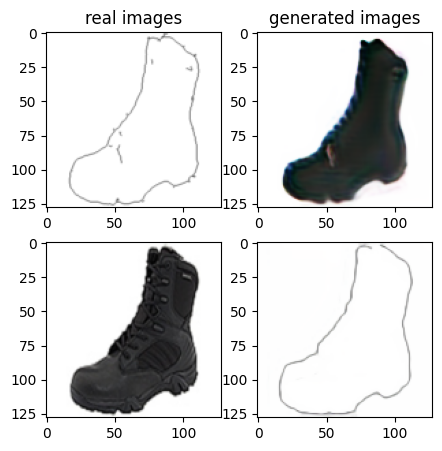

Train Epoch: 1 28% 	Total Loss: 1.719891 	Loss_G_AB: 0.276949	Loss_G_BA: 1.035399	Loss_cycle: 0.797371	Loss_D_A: 0.011267	Loss_D_B: 0.255079
0 14009 T:  1.6387097835540771
Train Epoch: 1 28% 	Total Loss: 1.401835 	Loss_G_AB: 0.251477	Loss_G_BA: 0.954439	Loss_cycle: 0.523868	Loss_D_A: 0.009588	Loss_D_B: 0.265421
0 14019 T:  0.9855046272277832
Train Epoch: 1 28% 	Total Loss: 1.496647 	Loss_G_AB: 0.291022	Loss_G_BA: 0.916937	Loss_cycle: 0.552659	Loss_D_A: 0.064070	Loss_D_B: 0.275939
0 14029 T:  0.985356330871582
Train Epoch: 1 28% 	Total Loss: 1.512087 	Loss_G_AB: 0.295441	Loss_G_BA: 0.853777	Loss_cycle: 0.637307	Loss_D_A: 0.038059	Loss_D_B: 0.262112
0 14039 T:  0.9819834232330322
Train Epoch: 1 28% 	Total Loss: 1.631105 	Loss_G_AB: 0.281436	Loss_G_BA: 1.028888	Loss_cycle: 0.672085	Loss_D_A: 0.009774	Loss_D_B: 0.294085
0 14049 T:  0.9852521419525146
Train Epoch: 1 28% 	Total Loss: 1.440023 	Loss_G_AB: 0.295402	Loss_G_BA: 0.992111	Loss_cycle: 0.536827	Loss_D_A: 0.016563	Loss_D_B: 0.242877


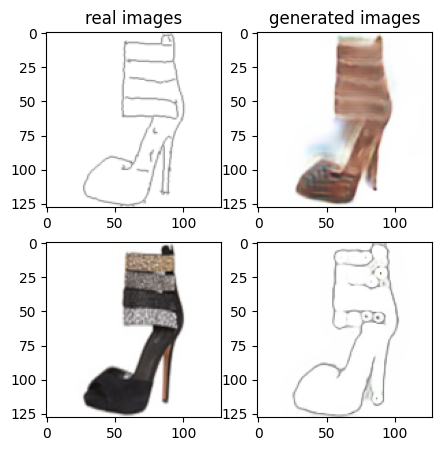

Train Epoch: 1 30% 	Total Loss: 1.462350 	Loss_G_AB: 0.299033	Loss_G_BA: 0.976090	Loss_cycle: 0.564225	Loss_D_A: 0.011255	Loss_D_B: 0.249309
0 15009 T:  1.7830030918121338
Train Epoch: 1 30% 	Total Loss: 1.554566 	Loss_G_AB: 0.300323	Loss_G_BA: 1.018039	Loss_cycle: 0.622768	Loss_D_A: 0.010677	Loss_D_B: 0.261940
0 15019 T:  0.9897029399871826
Train Epoch: 1 30% 	Total Loss: 1.638638 	Loss_G_AB: 0.329157	Loss_G_BA: 1.011880	Loss_cycle: 0.713919	Loss_D_A: 0.008387	Loss_D_B: 0.245814
0 15029 T:  1.0147292613983154
Train Epoch: 1 30% 	Total Loss: 1.382959 	Loss_G_AB: 0.351334	Loss_G_BA: 0.985037	Loss_cycle: 0.470720	Loss_D_A: 0.020355	Loss_D_B: 0.223699
0 15039 T:  1.0091438293457031
Train Epoch: 1 30% 	Total Loss: 1.545827 	Loss_G_AB: 0.377563	Loss_G_BA: 0.948134	Loss_cycle: 0.572186	Loss_D_A: 0.019258	Loss_D_B: 0.291534
0 15049 T:  1.0073449611663818
Train Epoch: 1 30% 	Total Loss: 1.476660 	Loss_G_AB: 0.359179	Loss_G_BA: 0.930499	Loss_cycle: 0.514205	Loss_D_A: 0.053854	Loss_D_B: 0.263763

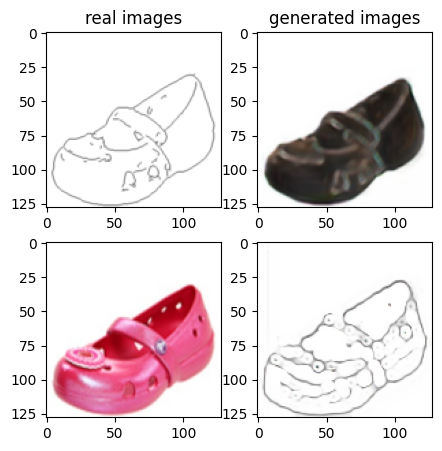

Train Epoch: 1 32% 	Total Loss: 1.512350 	Loss_G_AB: 0.319270	Loss_G_BA: 0.945362	Loss_cycle: 0.560725	Loss_D_A: 0.060094	Loss_D_B: 0.259215
0 16009 T:  2.0212833881378174
Train Epoch: 1 32% 	Total Loss: 1.504830 	Loss_G_AB: 0.296933	Loss_G_BA: 0.877230	Loss_cycle: 0.637483	Loss_D_A: 0.037209	Loss_D_B: 0.243056
0 16019 T:  1.023925542831421
Train Epoch: 1 32% 	Total Loss: 1.475057 	Loss_G_AB: 0.268636	Loss_G_BA: 0.922129	Loss_cycle: 0.555096	Loss_D_A: 0.037631	Loss_D_B: 0.286948
0 16029 T:  1.0093860626220703
Train Epoch: 1 32% 	Total Loss: 1.527704 	Loss_G_AB: 0.274539	Loss_G_BA: 1.038975	Loss_cycle: 0.599379	Loss_D_A: 0.011188	Loss_D_B: 0.260380
0 16039 T:  1.0040640830993652
Train Epoch: 1 32% 	Total Loss: 1.523324 	Loss_G_AB: 0.302979	Loss_G_BA: 0.936061	Loss_cycle: 0.602773	Loss_D_A: 0.039508	Loss_D_B: 0.261524
0 16049 T:  0.9863016605377197
Train Epoch: 1 32% 	Total Loss: 1.323023 	Loss_G_AB: 0.307281	Loss_G_BA: 0.857455	Loss_cycle: 0.432432	Loss_D_A: 0.062545	Loss_D_B: 0.245678


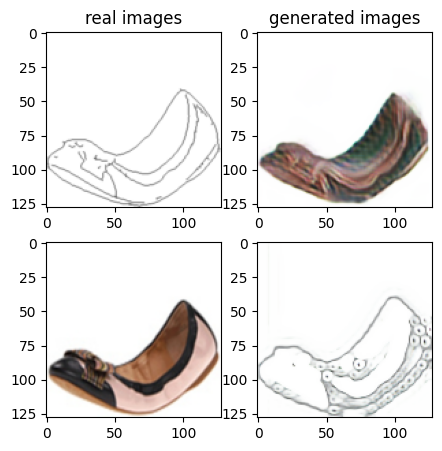

Train Epoch: 1 34% 	Total Loss: 1.415615 	Loss_G_AB: 0.285833	Loss_G_BA: 0.600818	Loss_cycle: 0.614491	Loss_D_A: 0.115492	Loss_D_B: 0.242306
0 17009 T:  1.6763806343078613
Train Epoch: 1 34% 	Total Loss: 1.583985 	Loss_G_AB: 0.310334	Loss_G_BA: 0.752710	Loss_cycle: 0.694866	Loss_D_A: 0.089712	Loss_D_B: 0.267885
0 17019 T:  0.9984796047210693
Train Epoch: 1 34% 	Total Loss: 1.415927 	Loss_G_AB: 0.332317	Loss_G_BA: 0.669317	Loss_cycle: 0.607053	Loss_D_A: 0.072372	Loss_D_B: 0.235685
0 17029 T:  0.9944417476654053
Train Epoch: 1 34% 	Total Loss: 1.573855 	Loss_G_AB: 0.301144	Loss_G_BA: 0.580523	Loss_cycle: 0.640660	Loss_D_A: 0.218565	Loss_D_B: 0.273797
0 17039 T:  0.9826977252960205
Train Epoch: 1 34% 	Total Loss: 1.541102 	Loss_G_AB: 0.299466	Loss_G_BA: 0.616301	Loss_cycle: 0.699331	Loss_D_A: 0.134613	Loss_D_B: 0.249275
0 17049 T:  0.990593671798706
Train Epoch: 1 34% 	Total Loss: 1.378048 	Loss_G_AB: 0.297501	Loss_G_BA: 0.517688	Loss_cycle: 0.561602	Loss_D_A: 0.164079	Loss_D_B: 0.244772


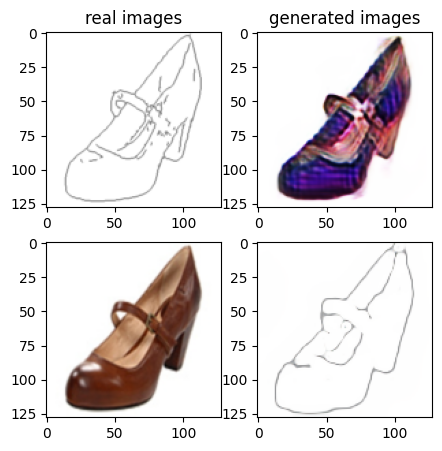

Train Epoch: 1 36% 	Total Loss: 1.818953 	Loss_G_AB: 0.286002	Loss_G_BA: 0.847816	Loss_cycle: 0.966049	Loss_D_A: 0.032975	Loss_D_B: 0.253019
0 18009 T:  1.6375510692596436
Train Epoch: 1 36% 	Total Loss: 1.586526 	Loss_G_AB: 0.296687	Loss_G_BA: 0.963643	Loss_cycle: 0.674166	Loss_D_A: 0.044362	Loss_D_B: 0.237833
0 18019 T:  0.9807016849517822
Train Epoch: 1 36% 	Total Loss: 1.474923 	Loss_G_AB: 0.335404	Loss_G_BA: 0.932248	Loss_cycle: 0.579198	Loss_D_A: 0.024891	Loss_D_B: 0.237007
0 18029 T:  0.9858386516571045
Train Epoch: 1 36% 	Total Loss: 1.414305 	Loss_G_AB: 0.284994	Loss_G_BA: 0.949010	Loss_cycle: 0.478624	Loss_D_A: 0.043643	Loss_D_B: 0.275036
0 18039 T:  0.9856324195861816
Train Epoch: 1 36% 	Total Loss: 1.422298 	Loss_G_AB: 0.316586	Loss_G_BA: 0.913306	Loss_cycle: 0.519063	Loss_D_A: 0.045109	Loss_D_B: 0.243180
0 18049 T:  0.9904634952545166
Train Epoch: 1 36% 	Total Loss: 1.535231 	Loss_G_AB: 0.295170	Loss_G_BA: 1.065664	Loss_cycle: 0.578574	Loss_D_A: 0.022941	Loss_D_B: 0.253299

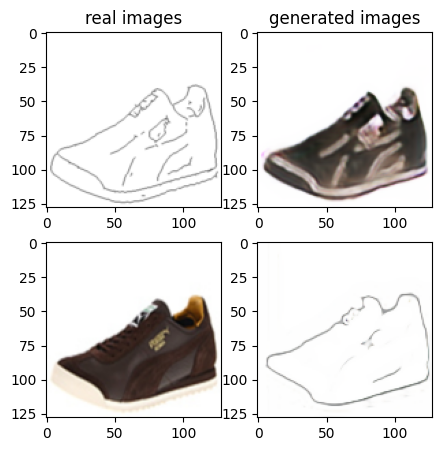

Train Epoch: 1 38% 	Total Loss: 1.382506 	Loss_G_AB: 0.311941	Loss_G_BA: 1.005413	Loss_cycle: 0.455751	Loss_D_A: 0.007813	Loss_D_B: 0.260265
0 19009 T:  1.6433601379394531
Train Epoch: 1 38% 	Total Loss: 1.511386 	Loss_G_AB: 0.334208	Loss_G_BA: 1.008849	Loss_cycle: 0.567743	Loss_D_A: 0.006157	Loss_D_B: 0.265957
0 19019 T:  0.9978241920471191
Train Epoch: 1 38% 	Total Loss: 1.286061 	Loss_G_AB: 0.275865	Loss_G_BA: 0.942723	Loss_cycle: 0.416985	Loss_D_A: 0.011478	Loss_D_B: 0.248304
0 19029 T:  0.9830918312072754
Train Epoch: 1 38% 	Total Loss: 1.513034 	Loss_G_AB: 0.276815	Loss_G_BA: 1.003866	Loss_cycle: 0.614885	Loss_D_A: 0.007034	Loss_D_B: 0.250775
0 19039 T:  0.988889217376709
Train Epoch: 1 38% 	Total Loss: 1.507426 	Loss_G_AB: 0.301906	Loss_G_BA: 0.959415	Loss_cycle: 0.628290	Loss_D_A: 0.008455	Loss_D_B: 0.240022
0 19049 T:  1.0163078308105469
Train Epoch: 1 38% 	Total Loss: 1.322484 	Loss_G_AB: 0.294617	Loss_G_BA: 1.050686	Loss_cycle: 0.387013	Loss_D_A: 0.007437	Loss_D_B: 0.255382


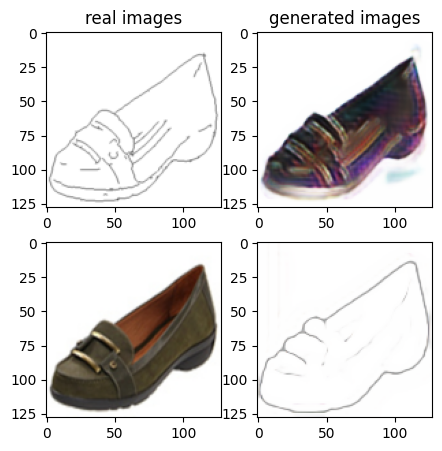

Train Epoch: 1 40% 	Total Loss: 1.433412 	Loss_G_AB: 0.298969	Loss_G_BA: 0.982951	Loss_cycle: 0.517529	Loss_D_A: 0.014700	Loss_D_B: 0.260222
0 20009 T:  1.9458272457122803
Train Epoch: 1 40% 	Total Loss: 1.424311 	Loss_G_AB: 0.338957	Loss_G_BA: 0.866189	Loss_cycle: 0.524929	Loss_D_A: 0.061268	Loss_D_B: 0.235542
0 20019 T:  1.0063161849975586
Train Epoch: 1 40% 	Total Loss: 1.471366 	Loss_G_AB: 0.301944	Loss_G_BA: 0.884170	Loss_cycle: 0.596272	Loss_D_A: 0.038106	Loss_D_B: 0.243931
0 20029 T:  1.0091044902801514
Train Epoch: 1 40% 	Total Loss: 1.466321 	Loss_G_AB: 0.318101	Loss_G_BA: 1.006324	Loss_cycle: 0.519138	Loss_D_A: 0.006628	Loss_D_B: 0.278343
0 20039 T:  1.0131678581237793
Train Epoch: 1 40% 	Total Loss: 1.397789 	Loss_G_AB: 0.307007	Loss_G_BA: 0.959726	Loss_cycle: 0.521694	Loss_D_A: 0.012136	Loss_D_B: 0.230592
0 20049 T:  1.0088768005371094
Train Epoch: 1 40% 	Total Loss: 1.476904 	Loss_G_AB: 0.260513	Loss_G_BA: 1.057342	Loss_cycle: 0.511652	Loss_D_A: 0.011740	Loss_D_B: 0.294584

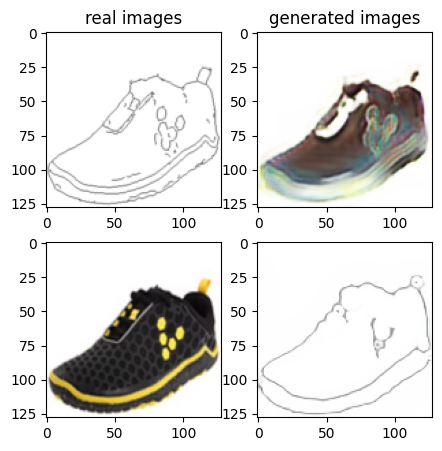

Train Epoch: 1 42% 	Total Loss: 1.313033 	Loss_G_AB: 0.266133	Loss_G_BA: 0.483716	Loss_cycle: 0.489122	Loss_D_A: 0.156236	Loss_D_B: 0.292750
0 21009 T:  2.0118496417999268
Train Epoch: 1 42% 	Total Loss: 1.679518 	Loss_G_AB: 0.338742	Loss_G_BA: 0.717018	Loss_cycle: 0.852724	Loss_D_A: 0.091509	Loss_D_B: 0.207405
0 21019 T:  1.0203328132629395
Train Epoch: 1 42% 	Total Loss: 1.435533 	Loss_G_AB: 0.297015	Loss_G_BA: 0.743090	Loss_cycle: 0.542435	Loss_D_A: 0.125519	Loss_D_B: 0.247527
0 21029 T:  1.0372052192687988
Train Epoch: 1 42% 	Total Loss: 1.341004 	Loss_G_AB: 0.272435	Loss_G_BA: 0.678453	Loss_cycle: 0.483934	Loss_D_A: 0.114067	Loss_D_B: 0.267559
0 21039 T:  1.0147433280944824
Train Epoch: 1 42% 	Total Loss: 1.469873 	Loss_G_AB: 0.309737	Loss_G_BA: 1.024313	Loss_cycle: 0.549420	Loss_D_A: 0.025199	Loss_D_B: 0.228230
0 21049 T:  0.990349531173706
Train Epoch: 1 42% 	Total Loss: 1.350483 	Loss_G_AB: 0.295465	Loss_G_BA: 0.966084	Loss_cycle: 0.428510	Loss_D_A: 0.030064	Loss_D_B: 0.261134


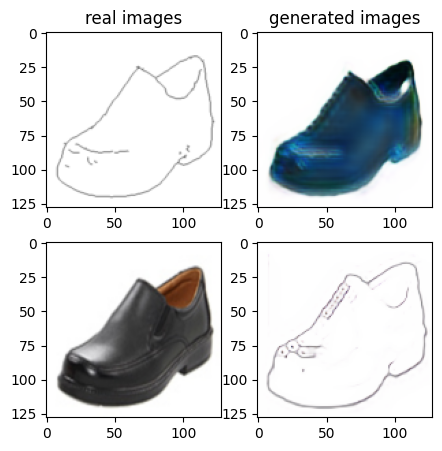

Train Epoch: 1 44% 	Total Loss: 1.433569 	Loss_G_AB: 0.311286	Loss_G_BA: 1.039659	Loss_cycle: 0.516305	Loss_D_A: 0.006082	Loss_D_B: 0.235709
0 22009 T:  1.857527256011963
Train Epoch: 1 44% 	Total Loss: 1.429421 	Loss_G_AB: 0.315255	Loss_G_BA: 0.983710	Loss_cycle: 0.516683	Loss_D_A: 0.004900	Loss_D_B: 0.258355
0 22019 T:  0.9888465404510498
Train Epoch: 1 44% 	Total Loss: 1.309611 	Loss_G_AB: 0.300028	Loss_G_BA: 0.968241	Loss_cycle: 0.428876	Loss_D_A: 0.007310	Loss_D_B: 0.239290
0 22029 T:  0.9841568470001221
Train Epoch: 1 44% 	Total Loss: 1.437983 	Loss_G_AB: 0.281250	Loss_G_BA: 0.989433	Loss_cycle: 0.550565	Loss_D_A: 0.004789	Loss_D_B: 0.247288
0 22039 T:  0.9875752925872803
Train Epoch: 1 44% 	Total Loss: 1.450186 	Loss_G_AB: 0.318165	Loss_G_BA: 0.982448	Loss_cycle: 0.570409	Loss_D_A: 0.004517	Loss_D_B: 0.224953
0 22049 T:  0.9928679466247559
Train Epoch: 1 44% 	Total Loss: 1.417320 	Loss_G_AB: 0.279137	Loss_G_BA: 0.996833	Loss_cycle: 0.519154	Loss_D_A: 0.014001	Loss_D_B: 0.246179


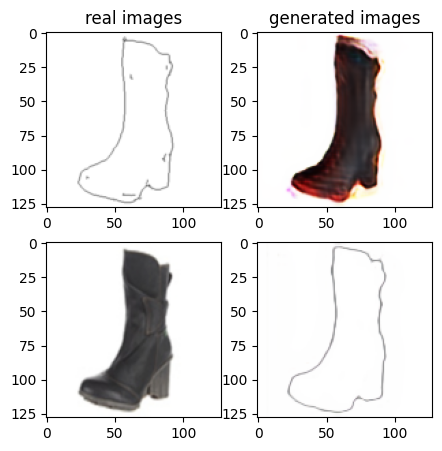

Train Epoch: 1 46% 	Total Loss: 1.430586 	Loss_G_AB: 0.313365	Loss_G_BA: 0.978724	Loss_cycle: 0.530464	Loss_D_A: 0.010189	Loss_D_B: 0.243889
0 23009 T:  1.6373724937438965
Train Epoch: 1 46% 	Total Loss: 1.448027 	Loss_G_AB: 0.302196	Loss_G_BA: 0.926463	Loss_cycle: 0.533561	Loss_D_A: 0.022842	Loss_D_B: 0.277295
0 23019 T:  0.9846842288970947
Train Epoch: 1 46% 	Total Loss: 1.400958 	Loss_G_AB: 0.311891	Loss_G_BA: 0.885841	Loss_cycle: 0.498830	Loss_D_A: 0.054856	Loss_D_B: 0.248405
0 23029 T:  0.9872791767120361
Train Epoch: 1 46% 	Total Loss: 1.504432 	Loss_G_AB: 0.310117	Loss_G_BA: 0.854200	Loss_cycle: 0.530329	Loss_D_A: 0.121934	Loss_D_B: 0.270011
0 23039 T:  0.9785788059234619
Train Epoch: 1 46% 	Total Loss: 1.410486 	Loss_G_AB: 0.306328	Loss_G_BA: 0.804400	Loss_cycle: 0.559285	Loss_D_A: 0.045679	Loss_D_B: 0.250157
0 23049 T:  0.9835965633392334
Train Epoch: 1 46% 	Total Loss: 1.475515 	Loss_G_AB: 0.318681	Loss_G_BA: 0.921316	Loss_cycle: 0.474642	Loss_D_A: 0.126866	Loss_D_B: 0.254008

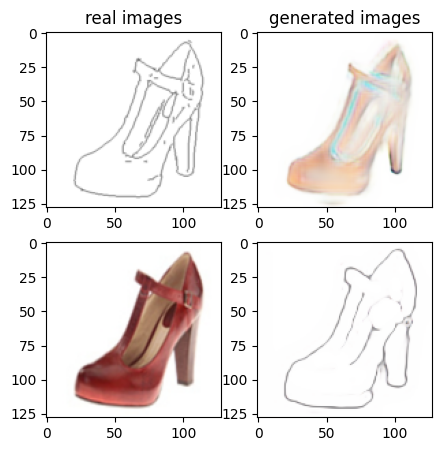

Train Epoch: 1 48% 	Total Loss: 1.461502 	Loss_G_AB: 0.282811	Loss_G_BA: 1.009593	Loss_cycle: 0.558714	Loss_D_A: 0.004156	Loss_D_B: 0.252431
0 24009 T:  1.6480424404144287
Train Epoch: 1 48% 	Total Loss: 1.571496 	Loss_G_AB: 0.329040	Loss_G_BA: 0.971975	Loss_cycle: 0.632319	Loss_D_A: 0.004304	Loss_D_B: 0.284366
0 24019 T:  0.9853401184082031
Train Epoch: 1 48% 	Total Loss: 1.395117 	Loss_G_AB: 0.288888	Loss_G_BA: 1.014735	Loss_cycle: 0.489450	Loss_D_A: 0.008009	Loss_D_B: 0.245847
0 24029 T:  0.9951186180114746
Train Epoch: 1 48% 	Total Loss: 1.322020 	Loss_G_AB: 0.308344	Loss_G_BA: 0.843458	Loss_cycle: 0.463213	Loss_D_A: 0.041314	Loss_D_B: 0.241592
0 24039 T:  1.0103142261505127
Train Epoch: 1 48% 	Total Loss: 1.382367 	Loss_G_AB: 0.284775	Loss_G_BA: 0.986747	Loss_cycle: 0.499053	Loss_D_A: 0.018826	Loss_D_B: 0.228727
0 24049 T:  1.0090813636779785
Train Epoch: 1 48% 	Total Loss: 1.564022 	Loss_G_AB: 0.429872	Loss_G_BA: 0.896505	Loss_cycle: 0.590428	Loss_D_A: 0.075036	Loss_D_B: 0.235369

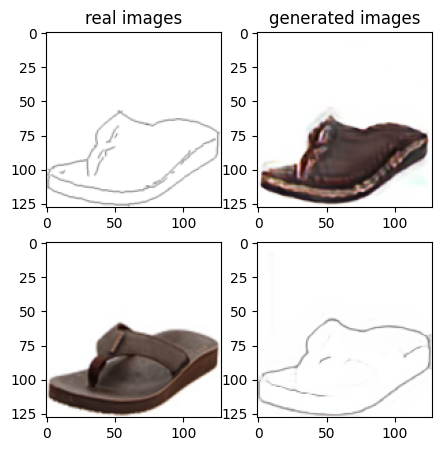

Train Epoch: 1 50% 	Total Loss: 1.467044 	Loss_G_AB: 0.287683	Loss_G_BA: 0.905394	Loss_cycle: 0.558519	Loss_D_A: 0.058255	Loss_D_B: 0.253731
0 25009 T:  1.9061005115509033
Train Epoch: 1 50% 	Total Loss: 1.509227 	Loss_G_AB: 0.327116	Loss_G_BA: 0.897284	Loss_cycle: 0.588088	Loss_D_A: 0.050315	Loss_D_B: 0.258624
0 25019 T:  1.0255870819091797
Train Epoch: 1 50% 	Total Loss: 1.430153 	Loss_G_AB: 0.342857	Loss_G_BA: 1.013310	Loss_cycle: 0.508145	Loss_D_A: 0.025671	Loss_D_B: 0.218254
0 25029 T:  1.0121817588806152
Train Epoch: 1 50% 	Total Loss: 1.414995 	Loss_G_AB: 0.302133	Loss_G_BA: 1.007070	Loss_cycle: 0.490298	Loss_D_A: 0.009238	Loss_D_B: 0.260857
0 25039 T:  0.9990108013153076
Train Epoch: 1 50% 	Total Loss: 1.476640 	Loss_G_AB: 0.323013	Loss_G_BA: 0.956409	Loss_cycle: 0.567280	Loss_D_A: 0.014756	Loss_D_B: 0.254893
0 25049 T:  1.0053043365478516
Train Epoch: 1 50% 	Total Loss: 1.443681 	Loss_G_AB: 0.332561	Loss_G_BA: 1.052594	Loss_cycle: 0.443821	Loss_D_A: 0.013836	Loss_D_B: 0.293446

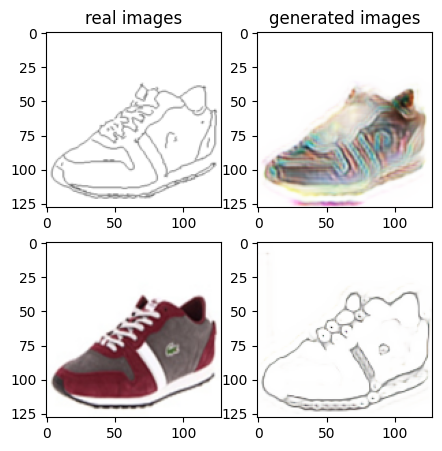

Train Epoch: 1 52% 	Total Loss: 1.437194 	Loss_G_AB: 0.275454	Loss_G_BA: 0.988326	Loss_cycle: 0.553414	Loss_D_A: 0.003808	Loss_D_B: 0.248082
0 26009 T:  2.061798095703125
Train Epoch: 1 52% 	Total Loss: 1.341480 	Loss_G_AB: 0.294458	Loss_G_BA: 0.968810	Loss_cycle: 0.453768	Loss_D_A: 0.016901	Loss_D_B: 0.239177
0 26019 T:  1.00211763381958
Train Epoch: 1 52% 	Total Loss: 1.390311 	Loss_G_AB: 0.306341	Loss_G_BA: 1.013682	Loss_cycle: 0.478781	Loss_D_A: 0.011626	Loss_D_B: 0.239892
0 26029 T:  0.9833168983459473
Train Epoch: 1 52% 	Total Loss: 1.432228 	Loss_G_AB: 0.300318	Loss_G_BA: 0.973899	Loss_cycle: 0.521667	Loss_D_A: 0.010155	Loss_D_B: 0.263299
0 26039 T:  0.9843392372131348
Train Epoch: 1 52% 	Total Loss: 1.522190 	Loss_G_AB: 0.330130	Loss_G_BA: 0.990821	Loss_cycle: 0.606566	Loss_D_A: 0.007040	Loss_D_B: 0.248108
0 26049 T:  0.9907398223876953
Train Epoch: 1 52% 	Total Loss: 1.463802 	Loss_G_AB: 0.329075	Loss_G_BA: 1.011222	Loss_cycle: 0.517360	Loss_D_A: 0.004325	Loss_D_B: 0.271970
0 

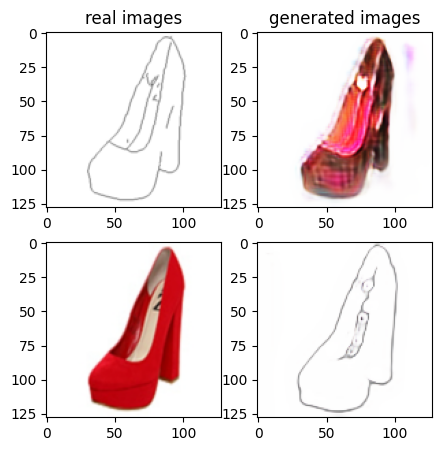

Train Epoch: 1 54% 	Total Loss: 1.465416 	Loss_G_AB: 0.273170	Loss_G_BA: 0.884896	Loss_cycle: 0.605484	Loss_D_A: 0.026823	Loss_D_B: 0.254077
0 27009 T:  1.6645698547363281
Train Epoch: 1 54% 	Total Loss: 1.544876 	Loss_G_AB: 0.313958	Loss_G_BA: 1.053618	Loss_cycle: 0.571046	Loss_D_A: 0.044641	Loss_D_B: 0.245402
0 27019 T:  0.9831051826477051
Train Epoch: 1 54% 	Total Loss: 1.336382 	Loss_G_AB: 0.321220	Loss_G_BA: 0.922403	Loss_cycle: 0.424980	Loss_D_A: 0.019688	Loss_D_B: 0.269902
0 27029 T:  0.9877529144287109
Train Epoch: 1 54% 	Total Loss: 1.344082 	Loss_G_AB: 0.269394	Loss_G_BA: 1.004891	Loss_cycle: 0.408314	Loss_D_A: 0.024249	Loss_D_B: 0.274377
0 27039 T:  0.9893839359283447
Train Epoch: 1 54% 	Total Loss: 1.318714 	Loss_G_AB: 0.278636	Loss_G_BA: 0.936701	Loss_cycle: 0.452365	Loss_D_A: 0.018912	Loss_D_B: 0.239767
0 27049 T:  0.992027997970581
Train Epoch: 1 54% 	Total Loss: 1.484276 	Loss_G_AB: 0.319974	Loss_G_BA: 1.028619	Loss_cycle: 0.540797	Loss_D_A: 0.008788	Loss_D_B: 0.260395


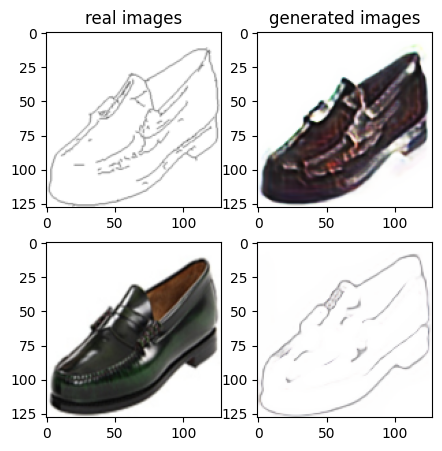

Train Epoch: 1 56% 	Total Loss: 1.322154 	Loss_G_AB: 0.285414	Loss_G_BA: 0.939183	Loss_cycle: 0.449028	Loss_D_A: 0.009501	Loss_D_B: 0.251327
0 28009 T:  1.6408088207244873
Train Epoch: 1 56% 	Total Loss: 1.299091 	Loss_G_AB: 0.293660	Loss_G_BA: 0.980130	Loss_cycle: 0.382836	Loss_D_A: 0.042814	Loss_D_B: 0.236546
0 28019 T:  0.9779138565063477
Train Epoch: 1 56% 	Total Loss: 1.410367 	Loss_G_AB: 0.255667	Loss_G_BA: 0.871669	Loss_cycle: 0.537577	Loss_D_A: 0.047094	Loss_D_B: 0.262028
0 28029 T:  0.9925332069396973
Train Epoch: 1 56% 	Total Loss: 1.425123 	Loss_G_AB: 0.290250	Loss_G_BA: 0.948787	Loss_cycle: 0.557090	Loss_D_A: 0.014332	Loss_D_B: 0.234182
0 28039 T:  0.9886596202850342
Train Epoch: 1 56% 	Total Loss: 1.556731 	Loss_G_AB: 0.368342	Loss_G_BA: 0.941145	Loss_cycle: 0.663983	Loss_D_A: 0.024511	Loss_D_B: 0.213493
0 28049 T:  0.9831364154815674
Train Epoch: 1 56% 	Total Loss: 1.434295 	Loss_G_AB: 0.321675	Loss_G_BA: 0.983780	Loss_cycle: 0.499247	Loss_D_A: 0.030322	Loss_D_B: 0.251997

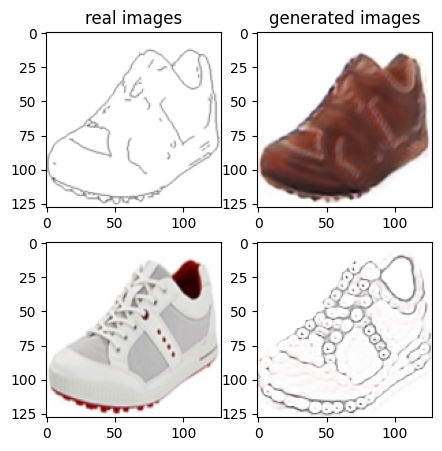

Train Epoch: 1 58% 	Total Loss: 1.460248 	Loss_G_AB: 0.283531	Loss_G_BA: 0.977440	Loss_cycle: 0.542397	Loss_D_A: 0.010925	Loss_D_B: 0.276440
0 29009 T:  1.8295183181762695
Train Epoch: 1 58% 	Total Loss: 1.266783 	Loss_G_AB: 0.285002	Loss_G_BA: 0.974948	Loss_cycle: 0.381343	Loss_D_A: 0.004214	Loss_D_B: 0.251251
0 29019 T:  0.9842913150787354
Train Epoch: 1 58% 	Total Loss: 1.366615 	Loss_G_AB: 0.379615	Loss_G_BA: 0.999202	Loss_cycle: 0.443507	Loss_D_A: 0.002613	Loss_D_B: 0.231086
0 29029 T:  1.0089170932769775
Train Epoch: 1 58% 	Total Loss: 1.385256 	Loss_G_AB: 0.299362	Loss_G_BA: 0.955814	Loss_cycle: 0.454124	Loss_D_A: 0.062885	Loss_D_B: 0.240659
0 29039 T:  1.0124757289886475
Train Epoch: 1 58% 	Total Loss: 1.252586 	Loss_G_AB: 0.306114	Loss_G_BA: 0.880933	Loss_cycle: 0.360400	Loss_D_A: 0.044848	Loss_D_B: 0.253814
0 29049 T:  1.0194931030273438
Train Epoch: 1 58% 	Total Loss: 1.379218 	Loss_G_AB: 0.251270	Loss_G_BA: 1.020225	Loss_cycle: 0.459921	Loss_D_A: 0.011180	Loss_D_B: 0.272370

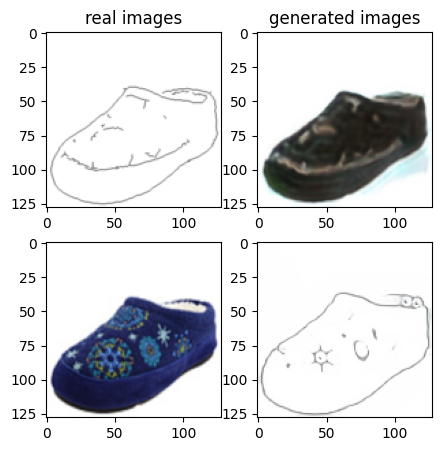

Train Epoch: 1 60% 	Total Loss: 1.309727 	Loss_G_AB: 0.280421	Loss_G_BA: 0.953134	Loss_cycle: 0.428535	Loss_D_A: 0.012496	Loss_D_B: 0.251919
0 30009 T:  2.003601312637329
Train Epoch: 1 60% 	Total Loss: 1.399022 	Loss_G_AB: 0.300394	Loss_G_BA: 0.926348	Loss_cycle: 0.511175	Loss_D_A: 0.015578	Loss_D_B: 0.258898
0 30019 T:  1.0106852054595947
Train Epoch: 1 60% 	Total Loss: 1.579982 	Loss_G_AB: 0.263494	Loss_G_BA: 0.983696	Loss_cycle: 0.686861	Loss_D_A: 0.020120	Loss_D_B: 0.249407
0 30029 T:  1.013688325881958
Train Epoch: 1 60% 	Total Loss: 1.292741 	Loss_G_AB: 0.322956	Loss_G_BA: 0.959552	Loss_cycle: 0.375551	Loss_D_A: 0.034086	Loss_D_B: 0.241850
0 30039 T:  0.9951374530792236
Train Epoch: 1 60% 	Total Loss: 1.364169 	Loss_G_AB: 0.299138	Loss_G_BA: 1.030080	Loss_cycle: 0.416377	Loss_D_A: 0.010559	Loss_D_B: 0.272624
0 30049 T:  1.004103183746338
Train Epoch: 1 60% 	Total Loss: 1.330169 	Loss_G_AB: 0.312406	Loss_G_BA: 0.962819	Loss_cycle: 0.452266	Loss_D_A: 0.008156	Loss_D_B: 0.232135
0 

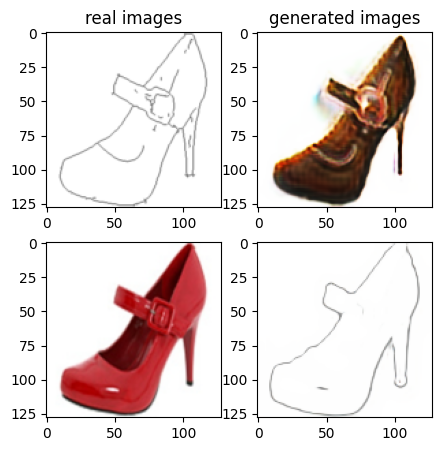

Train Epoch: 1 62% 	Total Loss: 1.579063 	Loss_G_AB: 0.272014	Loss_G_BA: 0.992957	Loss_cycle: 0.639563	Loss_D_A: 0.065532	Loss_D_B: 0.241483
0 31009 T:  2.023897647857666
Train Epoch: 1 62% 	Total Loss: 1.401631 	Loss_G_AB: 0.314213	Loss_G_BA: 0.969212	Loss_cycle: 0.515440	Loss_D_A: 0.011410	Loss_D_B: 0.233069
0 31019 T:  1.0152852535247803
Train Epoch: 1 62% 	Total Loss: 1.444668 	Loss_G_AB: 0.308056	Loss_G_BA: 0.979018	Loss_cycle: 0.536616	Loss_D_A: 0.018720	Loss_D_B: 0.245796
0 31029 T:  0.9876077175140381
Train Epoch: 1 62% 	Total Loss: 1.352414 	Loss_G_AB: 0.302632	Loss_G_BA: 1.010593	Loss_cycle: 0.444300	Loss_D_A: 0.005749	Loss_D_B: 0.245752
0 31039 T:  0.9840688705444336
Train Epoch: 1 62% 	Total Loss: 1.389715 	Loss_G_AB: 0.303350	Loss_G_BA: 0.948906	Loss_cycle: 0.494173	Loss_D_A: 0.016495	Loss_D_B: 0.252918
0 31049 T:  0.981475830078125
Train Epoch: 1 62% 	Total Loss: 1.409877 	Loss_G_AB: 0.264920	Loss_G_BA: 0.928265	Loss_cycle: 0.532336	Loss_D_A: 0.036152	Loss_D_B: 0.244797
0

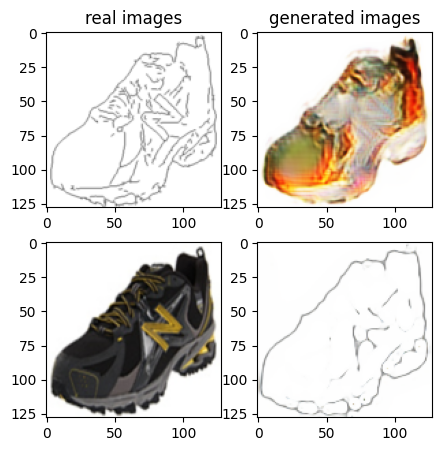

Train Epoch: 1 64% 	Total Loss: 1.319412 	Loss_G_AB: 0.317833	Loss_G_BA: 0.837717	Loss_cycle: 0.444109	Loss_D_A: 0.051917	Loss_D_B: 0.245610
0 32009 T:  1.7254903316497803
Train Epoch: 1 64% 	Total Loss: 1.367303 	Loss_G_AB: 0.267736	Loss_G_BA: 0.871366	Loss_cycle: 0.495586	Loss_D_A: 0.031250	Loss_D_B: 0.270916
0 32019 T:  0.9935932159423828
Train Epoch: 1 64% 	Total Loss: 1.342956 	Loss_G_AB: 0.278953	Loss_G_BA: 0.957180	Loss_cycle: 0.454467	Loss_D_A: 0.027263	Loss_D_B: 0.243159
0 32029 T:  1.005843162536621
Train Epoch: 1 64% 	Total Loss: 1.444877 	Loss_G_AB: 0.298339	Loss_G_BA: 0.952634	Loss_cycle: 0.543356	Loss_D_A: 0.034635	Loss_D_B: 0.241399
0 32039 T:  0.9899077415466309
Train Epoch: 1 64% 	Total Loss: 1.357065 	Loss_G_AB: 0.292572	Loss_G_BA: 0.974343	Loss_cycle: 0.476489	Loss_D_A: 0.010838	Loss_D_B: 0.236279
0 32049 T:  0.9822683334350586
Train Epoch: 1 64% 	Total Loss: 1.343533 	Loss_G_AB: 0.299781	Loss_G_BA: 0.922918	Loss_cycle: 0.455993	Loss_D_A: 0.019367	Loss_D_B: 0.256823


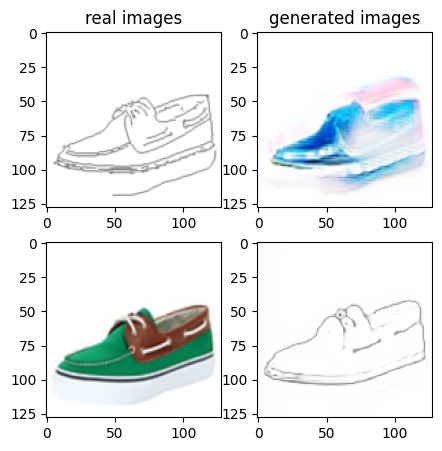

Train Epoch: 1 66% 	Total Loss: 1.283290 	Loss_G_AB: 0.305344	Loss_G_BA: 0.966861	Loss_cycle: 0.382102	Loss_D_A: 0.014387	Loss_D_B: 0.250699
0 33009 T:  1.6849148273468018
Train Epoch: 1 66% 	Total Loss: 1.460511 	Loss_G_AB: 0.294942	Loss_G_BA: 1.028387	Loss_cycle: 0.507290	Loss_D_A: 0.007846	Loss_D_B: 0.283710
0 33019 T:  0.9825577735900879
Train Epoch: 1 66% 	Total Loss: 1.351119 	Loss_G_AB: 0.303744	Loss_G_BA: 0.984865	Loss_cycle: 0.447503	Loss_D_A: 0.009013	Loss_D_B: 0.250299
0 33029 T:  0.9827015399932861
Train Epoch: 1 66% 	Total Loss: 1.461829 	Loss_G_AB: 0.360685	Loss_G_BA: 1.015695	Loss_cycle: 0.547149	Loss_D_A: 0.004815	Loss_D_B: 0.221676
0 33039 T:  0.986992359161377
Train Epoch: 1 66% 	Total Loss: 1.320760 	Loss_G_AB: 0.289482	Loss_G_BA: 0.826512	Loss_cycle: 0.416476	Loss_D_A: 0.084568	Loss_D_B: 0.261719
0 33049 T:  0.9811341762542725
Train Epoch: 1 66% 	Total Loss: 1.305650 	Loss_G_AB: 0.305668	Loss_G_BA: 0.806053	Loss_cycle: 0.473897	Loss_D_A: 0.048114	Loss_D_B: 0.227779


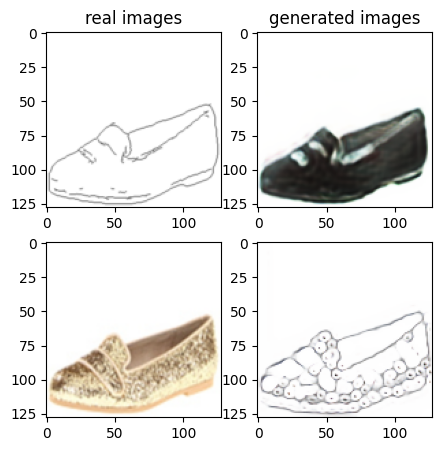

Train Epoch: 1 68% 	Total Loss: 1.481894 	Loss_G_AB: 0.314172	Loss_G_BA: 0.882769	Loss_cycle: 0.632223	Loss_D_A: 0.021490	Loss_D_B: 0.229710
0 34009 T:  1.6822900772094727
Train Epoch: 1 68% 	Total Loss: 1.463010 	Loss_G_AB: 0.320058	Loss_G_BA: 0.984014	Loss_cycle: 0.552651	Loss_D_A: 0.022326	Loss_D_B: 0.235997
0 34019 T:  0.9829235076904297
Train Epoch: 1 68% 	Total Loss: 1.378815 	Loss_G_AB: 0.321866	Loss_G_BA: 0.979888	Loss_cycle: 0.481071	Loss_D_A: 0.006414	Loss_D_B: 0.240453
0 34029 T:  0.9862067699432373
Train Epoch: 1 68% 	Total Loss: 1.262622 	Loss_G_AB: 0.291592	Loss_G_BA: 0.785171	Loss_cycle: 0.420671	Loss_D_A: 0.045402	Loss_D_B: 0.258167
0 34039 T:  0.9786500930786133
Train Epoch: 1 68% 	Total Loss: 1.362826 	Loss_G_AB: 0.387159	Loss_G_BA: 1.049183	Loss_cycle: 0.373730	Loss_D_A: 0.020267	Loss_D_B: 0.250657
0 34049 T:  0.9905657768249512
Train Epoch: 1 68% 	Total Loss: 1.492172 	Loss_G_AB: 0.352148	Loss_G_BA: 0.999845	Loss_cycle: 0.535530	Loss_D_A: 0.006082	Loss_D_B: 0.274564

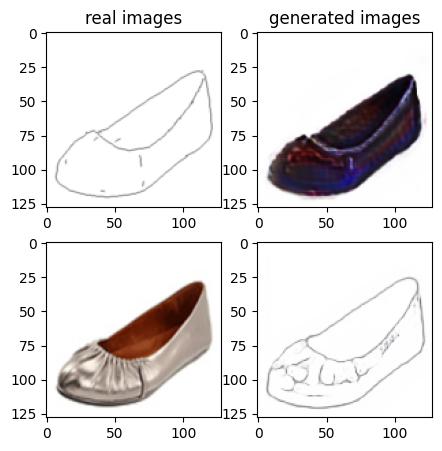

Train Epoch: 1 70% 	Total Loss: 1.449979 	Loss_G_AB: 0.300277	Loss_G_BA: 0.981756	Loss_cycle: 0.530278	Loss_D_A: 0.005259	Loss_D_B: 0.273426
0 35009 T:  1.833799123764038
Train Epoch: 1 70% 	Total Loss: 1.404147 	Loss_G_AB: 0.324426	Loss_G_BA: 1.012069	Loss_cycle: 0.500553	Loss_D_A: 0.002434	Loss_D_B: 0.232913
0 35019 T:  0.9886350631713867
Train Epoch: 1 70% 	Total Loss: 1.390557 	Loss_G_AB: 0.339751	Loss_G_BA: 0.983682	Loss_cycle: 0.452243	Loss_D_A: 0.009878	Loss_D_B: 0.266720
0 35029 T:  0.9854533672332764
Train Epoch: 1 70% 	Total Loss: 1.316700 	Loss_G_AB: 0.317438	Loss_G_BA: 0.980464	Loss_cycle: 0.392665	Loss_D_A: 0.020916	Loss_D_B: 0.254168
0 35039 T:  0.9853873252868652
Train Epoch: 1 70% 	Total Loss: 1.272729 	Loss_G_AB: 0.301681	Loss_G_BA: 0.936116	Loss_cycle: 0.404886	Loss_D_A: 0.009980	Loss_D_B: 0.238965
0 35049 T:  0.9886066913604736
Train Epoch: 1 70% 	Total Loss: 1.313604 	Loss_G_AB: 0.321427	Loss_G_BA: 1.021584	Loss_cycle: 0.398098	Loss_D_A: 0.010543	Loss_D_B: 0.233457


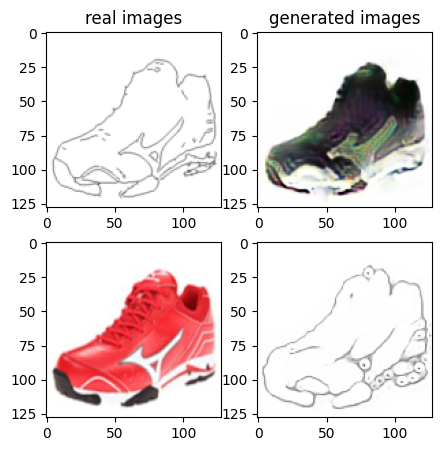

Train Epoch: 1 72% 	Total Loss: 1.515009 	Loss_G_AB: 0.358056	Loss_G_BA: 0.969102	Loss_cycle: 0.543650	Loss_D_A: 0.037243	Loss_D_B: 0.270537
0 36009 T:  1.644911766052246
Train Epoch: 1 72% 	Total Loss: 1.213276 	Loss_G_AB: 0.302348	Loss_G_BA: 0.959654	Loss_cycle: 0.321562	Loss_D_A: 0.013229	Loss_D_B: 0.247484
0 36019 T:  1.0010454654693604
Train Epoch: 1 72% 	Total Loss: 1.381897 	Loss_G_AB: 0.277897	Loss_G_BA: 0.985028	Loss_cycle: 0.440965	Loss_D_A: 0.025821	Loss_D_B: 0.283649
0 36029 T:  0.9931848049163818
Train Epoch: 1 72% 	Total Loss: 1.451198 	Loss_G_AB: 0.305230	Loss_G_BA: 0.995097	Loss_cycle: 0.523144	Loss_D_A: 0.040990	Loss_D_B: 0.236901
0 36039 T:  0.9874355792999268
Train Epoch: 1 72% 	Total Loss: 1.419710 	Loss_G_AB: 0.359025	Loss_G_BA: 0.863472	Loss_cycle: 0.488104	Loss_D_A: 0.044388	Loss_D_B: 0.275969
0 36049 T:  1.0072696208953857
Train Epoch: 1 72% 	Total Loss: 1.282669 	Loss_G_AB: 0.323298	Loss_G_BA: 0.861532	Loss_cycle: 0.418822	Loss_D_A: 0.042256	Loss_D_B: 0.229176


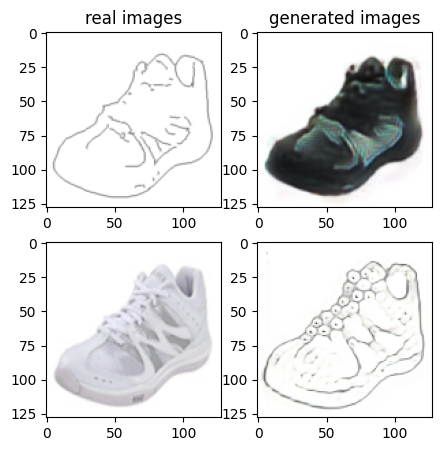

Train Epoch: 1 74% 	Total Loss: 1.433369 	Loss_G_AB: 0.289588	Loss_G_BA: 0.970663	Loss_cycle: 0.536189	Loss_D_A: 0.004326	Loss_D_B: 0.262729
0 37009 T:  1.7049105167388916
Train Epoch: 1 74% 	Total Loss: 1.332458 	Loss_G_AB: 0.299086	Loss_G_BA: 0.996040	Loss_cycle: 0.442562	Loss_D_A: 0.002966	Loss_D_B: 0.239368
0 37019 T:  0.9837257862091064
Train Epoch: 1 74% 	Total Loss: 1.219512 	Loss_G_AB: 0.267026	Loss_G_BA: 0.974280	Loss_cycle: 0.352472	Loss_D_A: 0.003802	Loss_D_B: 0.242586
0 37029 T:  1.0359396934509277
Train Epoch: 1 74% 	Total Loss: 1.301948 	Loss_G_AB: 0.326846	Loss_G_BA: 0.986382	Loss_cycle: 0.409705	Loss_D_A: 0.003784	Loss_D_B: 0.231845
0 37039 T:  1.0079548358917236
Train Epoch: 1 74% 	Total Loss: 1.380115 	Loss_G_AB: 0.279402	Loss_G_BA: 1.034804	Loss_cycle: 0.488066	Loss_D_A: 0.004811	Loss_D_B: 0.230135
0 37049 T:  1.0032508373260498
Train Epoch: 1 74% 	Total Loss: 1.381859 	Loss_G_AB: 0.297630	Loss_G_BA: 0.999362	Loss_cycle: 0.473426	Loss_D_A: 0.003732	Loss_D_B: 0.256206

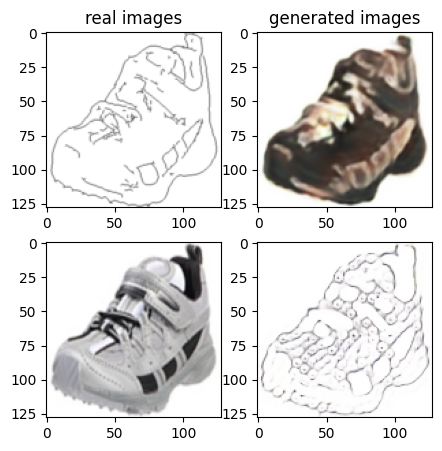

Train Epoch: 1 76% 	Total Loss: 1.318248 	Loss_G_AB: 0.300006	Loss_G_BA: 0.921293	Loss_cycle: 0.424233	Loss_D_A: 0.030245	Loss_D_B: 0.253121
0 38009 T:  1.7420258522033691
Train Epoch: 1 76% 	Total Loss: 1.343499 	Loss_G_AB: 0.320847	Loss_G_BA: 1.020491	Loss_cycle: 0.411487	Loss_D_A: 0.009086	Loss_D_B: 0.252257
0 38019 T:  1.023231029510498
Train Epoch: 1 76% 	Total Loss: 1.323441 	Loss_G_AB: 0.303862	Loss_G_BA: 0.968198	Loss_cycle: 0.428561	Loss_D_A: 0.006014	Loss_D_B: 0.252836
0 38029 T:  1.0316548347473145
Train Epoch: 1 76% 	Total Loss: 1.399296 	Loss_G_AB: 0.322208	Loss_G_BA: 1.011344	Loss_cycle: 0.490482	Loss_D_A: 0.007109	Loss_D_B: 0.234929
0 38039 T:  1.014458417892456
Train Epoch: 1 76% 	Total Loss: 1.433164 	Loss_G_AB: 0.337908	Loss_G_BA: 1.006277	Loss_cycle: 0.537086	Loss_D_A: 0.003658	Loss_D_B: 0.220326
0 38049 T:  1.00687837600708
Train Epoch: 1 76% 	Total Loss: 1.312774 	Loss_G_AB: 0.290548	Loss_G_BA: 1.012415	Loss_cycle: 0.404994	Loss_D_A: 0.003655	Loss_D_B: 0.252644
0 3

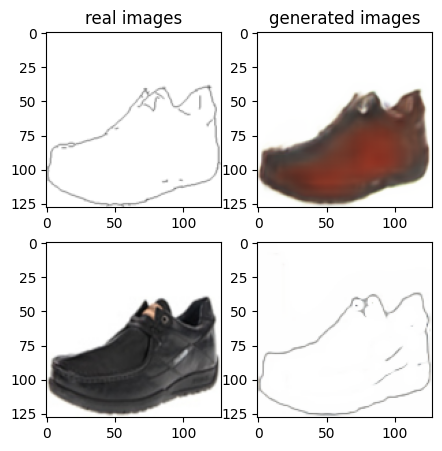

Train Epoch: 1 78% 	Total Loss: 1.336817 	Loss_G_AB: 0.302578	Loss_G_BA: 0.924730	Loss_cycle: 0.448245	Loss_D_A: 0.032936	Loss_D_B: 0.241983
0 39009 T:  1.6637940406799316
Train Epoch: 1 78% 	Total Loss: 1.399292 	Loss_G_AB: 0.324316	Loss_G_BA: 0.968167	Loss_cycle: 0.455636	Loss_D_A: 0.043347	Loss_D_B: 0.254068
0 39019 T:  1.0221893787384033
Train Epoch: 1 78% 	Total Loss: 1.292430 	Loss_G_AB: 0.268426	Loss_G_BA: 0.856640	Loss_cycle: 0.389773	Loss_D_A: 0.053201	Loss_D_B: 0.286923
0 39029 T:  1.0297071933746338
Train Epoch: 1 78% 	Total Loss: 1.468722 	Loss_G_AB: 0.295707	Loss_G_BA: 0.900286	Loss_cycle: 0.568778	Loss_D_A: 0.063381	Loss_D_B: 0.238567
0 39039 T:  1.0329868793487549
Train Epoch: 1 78% 	Total Loss: 1.322957 	Loss_G_AB: 0.294577	Loss_G_BA: 0.853482	Loss_cycle: 0.428115	Loss_D_A: 0.064117	Loss_D_B: 0.256696
0 39049 T:  1.0353553295135498
Train Epoch: 1 78% 	Total Loss: 1.362505 	Loss_G_AB: 0.308036	Loss_G_BA: 1.008405	Loss_cycle: 0.405940	Loss_D_A: 0.040842	Loss_D_B: 0.257503

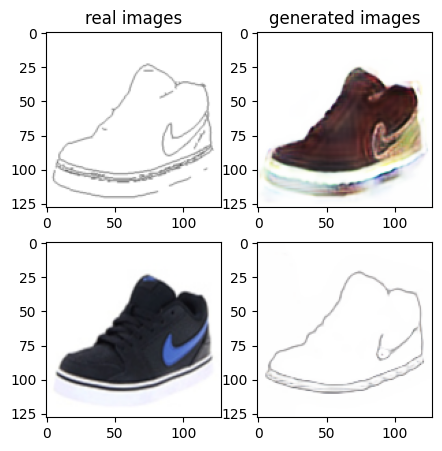

Train Epoch: 1 80% 	Total Loss: 1.286726 	Loss_G_AB: 0.313141	Loss_G_BA: 0.961045	Loss_cycle: 0.385580	Loss_D_A: 0.013411	Loss_D_B: 0.250642
0 40009 T:  1.9354851245880127
Train Epoch: 1 80% 	Total Loss: 1.408168 	Loss_G_AB: 0.284511	Loss_G_BA: 0.960154	Loss_cycle: 0.534689	Loss_D_A: 0.008160	Loss_D_B: 0.242986
0 40019 T:  1.01157808303833
Train Epoch: 1 80% 	Total Loss: 1.397528 	Loss_G_AB: 0.306560	Loss_G_BA: 0.791530	Loss_cycle: 0.477669	Loss_D_A: 0.126768	Loss_D_B: 0.244047
0 40029 T:  1.0137076377868652
Train Epoch: 1 80% 	Total Loss: 1.299781 	Loss_G_AB: 0.289812	Loss_G_BA: 0.772431	Loss_cycle: 0.414065	Loss_D_A: 0.090563	Loss_D_B: 0.264032
0 40039 T:  1.016664981842041
Train Epoch: 1 80% 	Total Loss: 1.310010 	Loss_G_AB: 0.300695	Loss_G_BA: 0.784937	Loss_cycle: 0.472583	Loss_D_A: 0.069153	Loss_D_B: 0.225459
0 40049 T:  0.9824230670928955
Train Epoch: 1 80% 	Total Loss: 1.404351 	Loss_G_AB: 0.294159	Loss_G_BA: 0.820688	Loss_cycle: 0.497813	Loss_D_A: 0.116079	Loss_D_B: 0.233036
0 

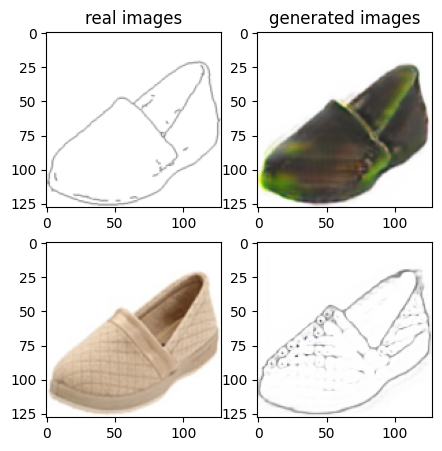

Train Epoch: 1 82% 	Total Loss: 1.388329 	Loss_G_AB: 0.298811	Loss_G_BA: 0.987051	Loss_cycle: 0.430473	Loss_D_A: 0.015651	Loss_D_B: 0.299274
0 41009 T:  1.9931378364562988
Train Epoch: 1 82% 	Total Loss: 1.250768 	Loss_G_AB: 0.298011	Loss_G_BA: 0.986599	Loss_cycle: 0.356207	Loss_D_A: 0.005131	Loss_D_B: 0.247125
0 41019 T:  1.0161724090576172
Train Epoch: 1 82% 	Total Loss: 1.380315 	Loss_G_AB: 0.298206	Loss_G_BA: 1.007585	Loss_cycle: 0.479516	Loss_D_A: 0.011526	Loss_D_B: 0.236377
0 41029 T:  0.9844579696655273
Train Epoch: 1 82% 	Total Loss: 1.350894 	Loss_G_AB: 0.319833	Loss_G_BA: 0.958755	Loss_cycle: 0.472827	Loss_D_A: 0.009751	Loss_D_B: 0.229021
0 41039 T:  0.9852511882781982
Train Epoch: 1 82% 	Total Loss: 1.370297 	Loss_G_AB: 0.253786	Loss_G_BA: 1.021004	Loss_cycle: 0.453799	Loss_D_A: 0.004267	Loss_D_B: 0.274835
0 41049 T:  0.9854326248168945
Train Epoch: 1 82% 	Total Loss: 1.362294 	Loss_G_AB: 0.315748	Loss_G_BA: 0.987826	Loss_cycle: 0.495879	Loss_D_A: 0.004211	Loss_D_B: 0.210417

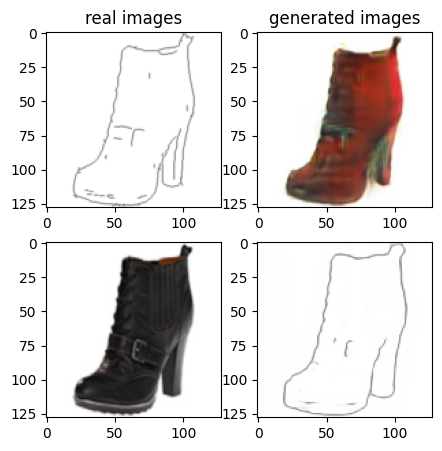

Train Epoch: 1 84% 	Total Loss: 1.322547 	Loss_G_AB: 0.312729	Loss_G_BA: 1.015515	Loss_cycle: 0.396457	Loss_D_A: 0.002487	Loss_D_B: 0.259480
0 42009 T:  1.8031420707702637
Train Epoch: 1 84% 	Total Loss: 1.322910 	Loss_G_AB: 0.304824	Loss_G_BA: 0.999173	Loss_cycle: 0.456910	Loss_D_A: 0.002879	Loss_D_B: 0.211122
0 42019 T:  0.9834709167480469
Train Epoch: 1 84% 	Total Loss: 1.457612 	Loss_G_AB: 0.297972	Loss_G_BA: 0.997935	Loss_cycle: 0.551758	Loss_D_A: 0.002339	Loss_D_B: 0.255562
0 42029 T:  0.9860146045684814
Train Epoch: 1 84% 	Total Loss: 1.258838 	Loss_G_AB: 0.274307	Loss_G_BA: 0.983749	Loss_cycle: 0.368010	Loss_D_A: 0.003638	Loss_D_B: 0.258162
0 42039 T:  0.9744462966918945
Train Epoch: 1 84% 	Total Loss: 1.356408 	Loss_G_AB: 0.320339	Loss_G_BA: 0.837879	Loss_cycle: 0.421829	Loss_D_A: 0.098207	Loss_D_B: 0.257263
0 42049 T:  0.9800159931182861
Train Epoch: 1 84% 	Total Loss: 1.393323 	Loss_G_AB: 0.271776	Loss_G_BA: 0.963445	Loss_cycle: 0.393453	Loss_D_A: 0.124344	Loss_D_B: 0.257915

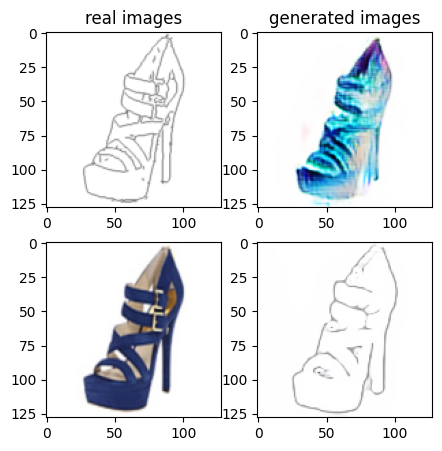

Train Epoch: 1 86% 	Total Loss: 1.360168 	Loss_G_AB: 0.304600	Loss_G_BA: 0.895930	Loss_cycle: 0.469818	Loss_D_A: 0.037151	Loss_D_B: 0.252935
0 43009 T:  1.6417899131774902
Train Epoch: 1 86% 	Total Loss: 1.314074 	Loss_G_AB: 0.315574	Loss_G_BA: 0.868631	Loss_cycle: 0.400509	Loss_D_A: 0.074060	Loss_D_B: 0.247402
0 43019 T:  0.9827945232391357
Train Epoch: 1 86% 	Total Loss: 1.279536 	Loss_G_AB: 0.275023	Loss_G_BA: 0.992832	Loss_cycle: 0.391556	Loss_D_A: 0.011496	Loss_D_B: 0.242556
0 43029 T:  0.9783525466918945
Train Epoch: 1 86% 	Total Loss: 1.427346 	Loss_G_AB: 0.308997	Loss_G_BA: 0.958422	Loss_cycle: 0.526746	Loss_D_A: 0.020305	Loss_D_B: 0.246585
0 43039 T:  0.9770572185516357
Train Epoch: 1 86% 	Total Loss: 1.252559 	Loss_G_AB: 0.290779	Loss_G_BA: 0.992410	Loss_cycle: 0.351774	Loss_D_A: 0.020503	Loss_D_B: 0.238688
0 43049 T:  0.9808688163757324
Train Epoch: 1 86% 	Total Loss: 1.392719 	Loss_G_AB: 0.298539	Loss_G_BA: 1.009989	Loss_cycle: 0.465834	Loss_D_A: 0.010574	Loss_D_B: 0.262047

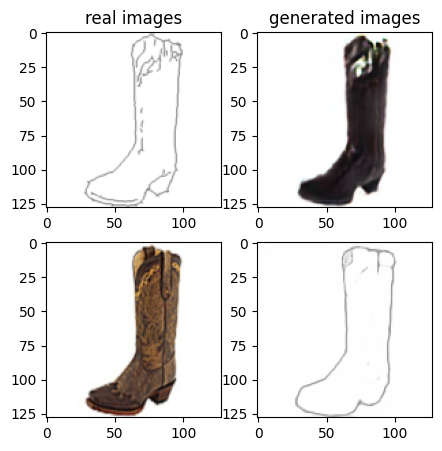

Train Epoch: 1 88% 	Total Loss: 1.293096 	Loss_G_AB: 0.315488	Loss_G_BA: 0.987088	Loss_cycle: 0.392101	Loss_D_A: 0.004059	Loss_D_B: 0.245648
0 44009 T:  1.6469964981079102
Train Epoch: 1 88% 	Total Loss: 1.358358 	Loss_G_AB: 0.313060	Loss_G_BA: 1.018303	Loss_cycle: 0.449777	Loss_D_A: 0.006499	Loss_D_B: 0.236401
0 44019 T:  0.9825921058654785
Train Epoch: 1 88% 	Total Loss: 1.462925 	Loss_G_AB: 0.293076	Loss_G_BA: 0.996144	Loss_cycle: 0.552085	Loss_D_A: 0.003419	Loss_D_B: 0.262812
0 44029 T:  0.9836935997009277
Train Epoch: 1 88% 	Total Loss: 1.407173 	Loss_G_AB: 0.293649	Loss_G_BA: 0.966862	Loss_cycle: 0.515737	Loss_D_A: 0.006858	Loss_D_B: 0.254323
0 44039 T:  0.9826812744140625
Train Epoch: 1 88% 	Total Loss: 1.381311 	Loss_G_AB: 0.315671	Loss_G_BA: 1.017620	Loss_cycle: 0.443527	Loss_D_A: 0.004067	Loss_D_B: 0.267071
0 44049 T:  0.9859042167663574
Train Epoch: 1 88% 	Total Loss: 1.344216 	Loss_G_AB: 0.286071	Loss_G_BA: 1.022059	Loss_cycle: 0.444846	Loss_D_A: 0.003513	Loss_D_B: 0.241792

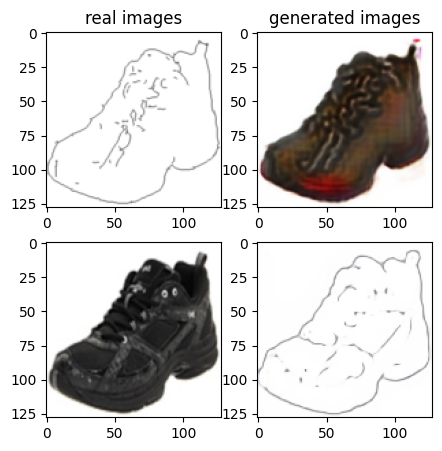

Train Epoch: 1 90% 	Total Loss: 1.258713 	Loss_G_AB: 0.254507	Loss_G_BA: 0.986484	Loss_cycle: 0.360826	Loss_D_A: 0.001911	Loss_D_B: 0.275481
0 45009 T:  1.6679322719573975
Train Epoch: 1 90% 	Total Loss: 1.355497 	Loss_G_AB: 0.280511	Loss_G_BA: 0.988107	Loss_cycle: 0.472847	Loss_D_A: 0.002950	Loss_D_B: 0.245391
0 45019 T:  0.981919527053833
Train Epoch: 1 90% 	Total Loss: 1.308274 	Loss_G_AB: 0.286523	Loss_G_BA: 1.003377	Loss_cycle: 0.414093	Loss_D_A: 0.002374	Loss_D_B: 0.246857
0 45029 T:  0.9832704067230225
Train Epoch: 1 90% 	Total Loss: 1.324442 	Loss_G_AB: 0.306733	Loss_G_BA: 1.000890	Loss_cycle: 0.433943	Loss_D_A: 0.002207	Loss_D_B: 0.234482
0 45039 T:  0.9883079528808594
Train Epoch: 1 90% 	Total Loss: 1.375713 	Loss_G_AB: 0.267710	Loss_G_BA: 0.988251	Loss_cycle: 0.497180	Loss_D_A: 0.003146	Loss_D_B: 0.247407
0 45049 T:  0.9797120094299316
Train Epoch: 1 90% 	Total Loss: 1.351642 	Loss_G_AB: 0.341034	Loss_G_BA: 1.013280	Loss_cycle: 0.443567	Loss_D_A: 0.002723	Loss_D_B: 0.228195


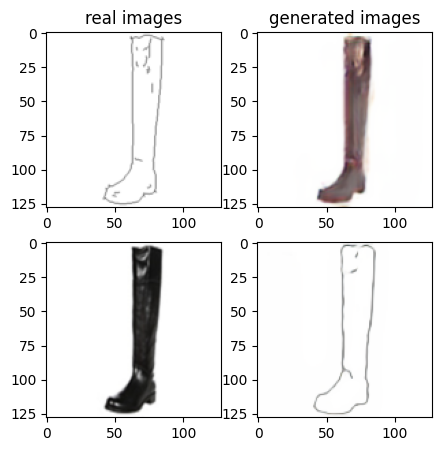

Train Epoch: 1 92% 	Total Loss: 1.311019 	Loss_G_AB: 0.309881	Loss_G_BA: 1.000061	Loss_cycle: 0.401659	Loss_D_A: 0.002045	Loss_D_B: 0.252344
0 46009 T:  1.6298902034759521
Train Epoch: 1 92% 	Total Loss: 1.365806 	Loss_G_AB: 0.311625	Loss_G_BA: 1.005612	Loss_cycle: 0.462582	Loss_D_A: 0.001770	Loss_D_B: 0.242837
0 46019 T:  0.982551097869873
Train Epoch: 1 92% 	Total Loss: 1.335169 	Loss_G_AB: 0.305620	Loss_G_BA: 0.981553	Loss_cycle: 0.463831	Loss_D_A: 0.002535	Loss_D_B: 0.225216
0 46029 T:  0.9836664199829102
Train Epoch: 1 92% 	Total Loss: 1.320425 	Loss_G_AB: 0.293917	Loss_G_BA: 1.009957	Loss_cycle: 0.410396	Loss_D_A: 0.001632	Loss_D_B: 0.256461
0 46039 T:  0.9789257049560547
Train Epoch: 1 92% 	Total Loss: 1.472154 	Loss_G_AB: 0.339767	Loss_G_BA: 1.003377	Loss_cycle: 0.566637	Loss_D_A: 0.001544	Loss_D_B: 0.232401
0 46049 T:  1.004251480102539
Train Epoch: 1 92% 	Total Loss: 1.400390 	Loss_G_AB: 0.296713	Loss_G_BA: 0.992571	Loss_cycle: 0.455833	Loss_D_A: 0.001393	Loss_D_B: 0.298522
0

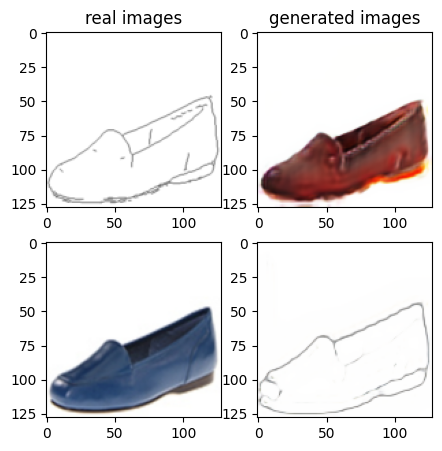

Train Epoch: 1 94% 	Total Loss: 1.342754 	Loss_G_AB: 0.289455	Loss_G_BA: 1.008672	Loss_cycle: 0.439948	Loss_D_A: 0.004437	Loss_D_B: 0.249306
0 47009 T:  1.6347553730010986
Train Epoch: 1 94% 	Total Loss: 1.396220 	Loss_G_AB: 0.340172	Loss_G_BA: 1.014055	Loss_cycle: 0.496939	Loss_D_A: 0.003461	Loss_D_B: 0.218706
0 47019 T:  0.9975039958953857
Train Epoch: 1 94% 	Total Loss: 1.326647 	Loss_G_AB: 0.351345	Loss_G_BA: 1.001841	Loss_cycle: 0.438884	Loss_D_A: 0.002210	Loss_D_B: 0.208960
0 47029 T:  1.0045366287231445
Train Epoch: 1 94% 	Total Loss: 1.351657 	Loss_G_AB: 0.328120	Loss_G_BA: 0.994898	Loss_cycle: 0.430931	Loss_D_A: 0.006138	Loss_D_B: 0.253078
0 47039 T:  1.023174524307251
Train Epoch: 1 94% 	Total Loss: 1.327014 	Loss_G_AB: 0.289460	Loss_G_BA: 0.999509	Loss_cycle: 0.404908	Loss_D_A: 0.002010	Loss_D_B: 0.275611
0 47049 T:  0.997258186340332
Train Epoch: 1 94% 	Total Loss: 1.306794 	Loss_G_AB: 0.362014	Loss_G_BA: 0.998737	Loss_cycle: 0.421384	Loss_D_A: 0.002102	Loss_D_B: 0.202933
0

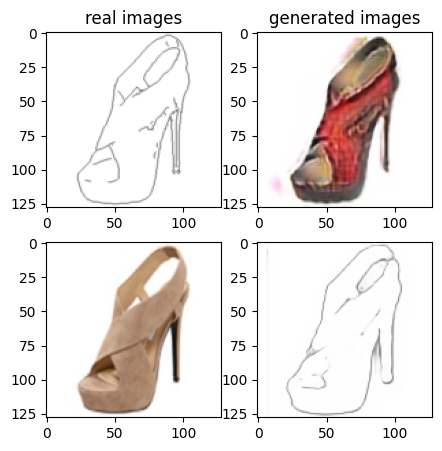

Train Epoch: 1 96% 	Total Loss: 1.374359 	Loss_G_AB: 0.281832	Loss_G_BA: 0.965082	Loss_cycle: 0.477589	Loss_D_A: 0.019946	Loss_D_B: 0.253366
0 48009 T:  1.6789264678955078
Train Epoch: 1 96% 	Total Loss: 1.438871 	Loss_G_AB: 0.317412	Loss_G_BA: 0.998313	Loss_cycle: 0.521449	Loss_D_A: 0.010175	Loss_D_B: 0.249384
0 48019 T:  0.9861712455749512
Train Epoch: 1 96% 	Total Loss: 1.216227 	Loss_G_AB: 0.307236	Loss_G_BA: 0.974943	Loss_cycle: 0.333498	Loss_D_A: 0.026263	Loss_D_B: 0.215377
0 48029 T:  1.016106128692627
Train Epoch: 1 96% 	Total Loss: 1.274612 	Loss_G_AB: 0.328787	Loss_G_BA: 0.942394	Loss_cycle: 0.365367	Loss_D_A: 0.023799	Loss_D_B: 0.249856
0 48039 T:  1.0203123092651367
Train Epoch: 1 96% 	Total Loss: 1.417740 	Loss_G_AB: 0.301337	Loss_G_BA: 0.986624	Loss_cycle: 0.512625	Loss_D_A: 0.004146	Loss_D_B: 0.256988
0 48049 T:  1.016786813735962
Train Epoch: 1 96% 	Total Loss: 1.523111 	Loss_G_AB: 0.359528	Loss_G_BA: 1.009075	Loss_cycle: 0.602072	Loss_D_A: 0.003456	Loss_D_B: 0.233281
0

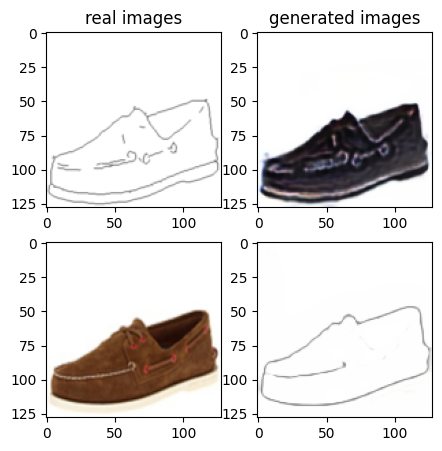

Train Epoch: 1 98% 	Total Loss: 1.294022 	Loss_G_AB: 0.311112	Loss_G_BA: 0.988126	Loss_cycle: 0.409285	Loss_D_A: 0.002523	Loss_D_B: 0.232595
0 49009 T:  2.089728593826294
Train Epoch: 1 98% 	Total Loss: 1.270898 	Loss_G_AB: 0.386447	Loss_G_BA: 1.001953	Loss_cycle: 0.355640	Loss_D_A: 0.002834	Loss_D_B: 0.218224
0 49019 T:  1.0028765201568604
Train Epoch: 1 98% 	Total Loss: 1.440463 	Loss_G_AB: 0.304251	Loss_G_BA: 0.994154	Loss_cycle: 0.537230	Loss_D_A: 0.002051	Loss_D_B: 0.251979
0 49029 T:  0.9972438812255859
Train Epoch: 1 98% 	Total Loss: 1.369416 	Loss_G_AB: 0.321054	Loss_G_BA: 1.007053	Loss_cycle: 0.460461	Loss_D_A: 0.001554	Loss_D_B: 0.243348
0 49039 T:  1.0050244331359863
Train Epoch: 1 98% 	Total Loss: 1.215804 	Loss_G_AB: 0.337486	Loss_G_BA: 1.005948	Loss_cycle: 0.334097	Loss_D_A: 0.003949	Loss_D_B: 0.206040
0 49049 T:  1.0017850399017334
Train Epoch: 1 98% 	Total Loss: 1.306709 	Loss_G_AB: 0.248356	Loss_G_BA: 0.991483	Loss_cycle: 0.388353	Loss_D_A: 0.002892	Loss_D_B: 0.295545


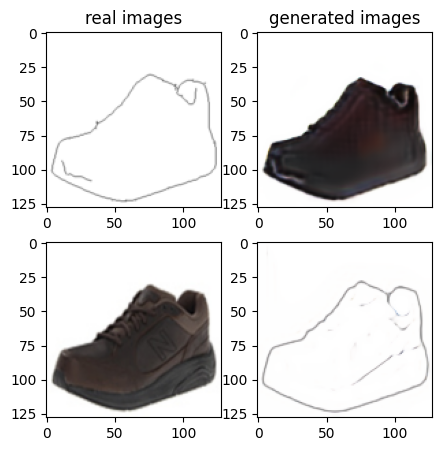

Train Epoch: 2 0% 	Total Loss: 1.324668 	Loss_G_AB: 0.312501	Loss_G_BA: 1.006553	Loss_cycle: 0.430402	Loss_D_A: 0.001659	Loss_D_B: 0.233080
1 50009 T:  1.998304843902588
Train Epoch: 2 0% 	Total Loss: 1.415911 	Loss_G_AB: 0.297961	Loss_G_BA: 0.991327	Loss_cycle: 0.486977	Loss_D_A: 0.002391	Loss_D_B: 0.281900
1 50019 T:  1.011023759841919
Train Epoch: 2 0% 	Total Loss: 1.299072 	Loss_G_AB: 0.327324	Loss_G_BA: 0.989059	Loss_cycle: 0.384999	Loss_D_A: 0.004414	Loss_D_B: 0.251468
1 50029 T:  0.9970550537109375
Train Epoch: 2 0% 	Total Loss: 1.309570 	Loss_G_AB: 0.292746	Loss_G_BA: 1.016567	Loss_cycle: 0.417359	Loss_D_A: 0.003152	Loss_D_B: 0.234402
1 50039 T:  1.0017445087432861
Train Epoch: 2 0% 	Total Loss: 1.335460 	Loss_G_AB: 0.304733	Loss_G_BA: 1.000962	Loss_cycle: 0.441861	Loss_D_A: 0.002069	Loss_D_B: 0.238682
1 50049 T:  0.9793400764465332
Train Epoch: 2 0% 	Total Loss: 1.347315 	Loss_G_AB: 0.267932	Loss_G_BA: 0.998782	Loss_cycle: 0.441483	Loss_D_A: 0.002775	Loss_D_B: 0.269700
1 50059

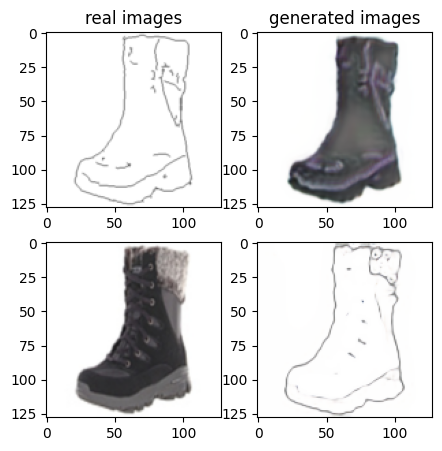

Train Epoch: 2 2% 	Total Loss: 1.335940 	Loss_G_AB: 0.297286	Loss_G_BA: 0.988669	Loss_cycle: 0.406450	Loss_D_A: 0.027340	Loss_D_B: 0.259172
1 51009 T:  2.015970230102539
Train Epoch: 2 2% 	Total Loss: 1.222999 	Loss_G_AB: 0.300032	Loss_G_BA: 0.949256	Loss_cycle: 0.352172	Loss_D_A: 0.019304	Loss_D_B: 0.226879
1 51019 T:  0.9877405166625977
Train Epoch: 2 2% 	Total Loss: 1.391765 	Loss_G_AB: 0.316037	Loss_G_BA: 1.022672	Loss_cycle: 0.471929	Loss_D_A: 0.009160	Loss_D_B: 0.241322
1 51029 T:  0.9812006950378418
Train Epoch: 2 2% 	Total Loss: 1.321357 	Loss_G_AB: 0.282124	Loss_G_BA: 0.948130	Loss_cycle: 0.431360	Loss_D_A: 0.012731	Loss_D_B: 0.262139
1 51039 T:  0.9829545021057129
Train Epoch: 2 2% 	Total Loss: 1.251977 	Loss_G_AB: 0.298288	Loss_G_BA: 0.984737	Loss_cycle: 0.358764	Loss_D_A: 0.012937	Loss_D_B: 0.238764
1 51049 T:  0.9787604808807373
Train Epoch: 2 2% 	Total Loss: 1.316182 	Loss_G_AB: 0.270464	Loss_G_BA: 0.977515	Loss_cycle: 0.428983	Loss_D_A: 0.004314	Loss_D_B: 0.258894
1 5105

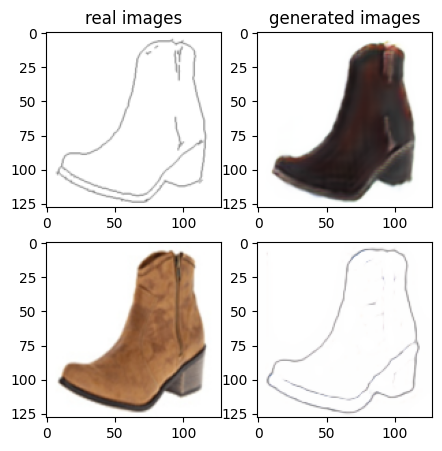

Train Epoch: 2 4% 	Total Loss: 1.289415 	Loss_G_AB: 0.278355	Loss_G_BA: 1.000934	Loss_cycle: 0.394229	Loss_D_A: 0.001971	Loss_D_B: 0.253569
1 52009 T:  1.7200138568878174
Train Epoch: 2 4% 	Total Loss: 1.335771 	Loss_G_AB: 0.278669	Loss_G_BA: 0.987841	Loss_cycle: 0.459284	Loss_D_A: 0.002745	Loss_D_B: 0.240487
1 52019 T:  0.9860901832580566
Train Epoch: 2 4% 	Total Loss: 1.292764 	Loss_G_AB: 0.351041	Loss_G_BA: 0.978808	Loss_cycle: 0.394926	Loss_D_A: 0.008105	Loss_D_B: 0.224808
1 52029 T:  0.9820108413696289
Train Epoch: 2 4% 	Total Loss: 1.179167 	Loss_G_AB: 0.295186	Loss_G_BA: 0.859704	Loss_cycle: 0.299070	Loss_D_A: 0.048362	Loss_D_B: 0.254290
1 52039 T:  0.9767796993255615
Train Epoch: 2 4% 	Total Loss: 1.459817 	Loss_G_AB: 0.331387	Loss_G_BA: 0.830504	Loss_cycle: 0.595524	Loss_D_A: 0.033535	Loss_D_B: 0.249813
1 52049 T:  0.9799473285675049
Train Epoch: 2 4% 	Total Loss: 1.474421 	Loss_G_AB: 0.267857	Loss_G_BA: 0.757857	Loss_cycle: 0.469721	Loss_D_A: 0.218962	Loss_D_B: 0.272882
1 520

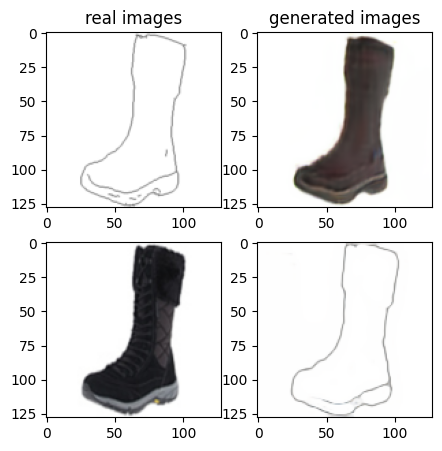

Train Epoch: 2 6% 	Total Loss: 1.345998 	Loss_G_AB: 0.330310	Loss_G_BA: 0.964005	Loss_cycle: 0.404137	Loss_D_A: 0.035234	Loss_D_B: 0.259470
1 53009 T:  1.9808204174041748
Train Epoch: 2 6% 	Total Loss: 1.349412 	Loss_G_AB: 0.244454	Loss_G_BA: 0.974824	Loss_cycle: 0.453777	Loss_D_A: 0.006773	Loss_D_B: 0.279224
1 53019 T:  1.0017943382263184
Train Epoch: 2 6% 	Total Loss: 1.297158 	Loss_G_AB: 0.249944	Loss_G_BA: 0.917539	Loss_cycle: 0.397389	Loss_D_A: 0.058898	Loss_D_B: 0.257129
1 53029 T:  1.021956205368042
Train Epoch: 2 6% 	Total Loss: 1.366608 	Loss_G_AB: 0.327221	Loss_G_BA: 0.923143	Loss_cycle: 0.476374	Loss_D_A: 0.044445	Loss_D_B: 0.220606
1 53039 T:  0.9853696823120117
Train Epoch: 2 6% 	Total Loss: 1.273071 	Loss_G_AB: 0.303715	Loss_G_BA: 0.981937	Loss_cycle: 0.377626	Loss_D_A: 0.008440	Loss_D_B: 0.244179
1 53049 T:  0.9818460941314697
Train Epoch: 2 6% 	Total Loss: 1.441692 	Loss_G_AB: 0.317559	Loss_G_BA: 1.006391	Loss_cycle: 0.548749	Loss_D_A: 0.003447	Loss_D_B: 0.227520
1 5305

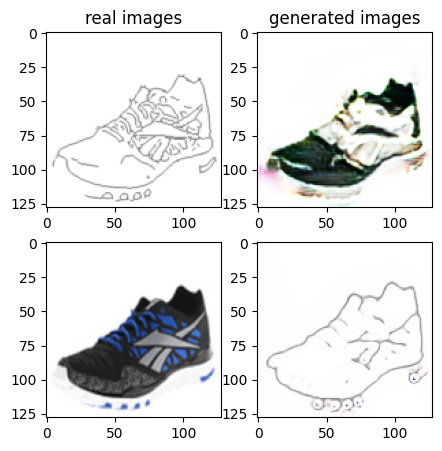

Train Epoch: 2 8% 	Total Loss: 1.308259 	Loss_G_AB: 0.274701	Loss_G_BA: 0.997870	Loss_cycle: 0.390271	Loss_D_A: 0.002174	Loss_D_B: 0.279528
1 54009 T:  1.6628954410552979
Train Epoch: 2 8% 	Total Loss: 1.283876 	Loss_G_AB: 0.352290	Loss_G_BA: 0.996056	Loss_cycle: 0.413777	Loss_D_A: 0.002051	Loss_D_B: 0.193876
1 54019 T:  0.9836227893829346
Train Epoch: 2 8% 	Total Loss: 1.285284 	Loss_G_AB: 0.293452	Loss_G_BA: 0.996037	Loss_cycle: 0.346065	Loss_D_A: 0.002159	Loss_D_B: 0.292315
1 54029 T:  0.9879145622253418
Train Epoch: 2 8% 	Total Loss: 1.343694 	Loss_G_AB: 0.298921	Loss_G_BA: 1.009030	Loss_cycle: 0.438975	Loss_D_A: 0.001620	Loss_D_B: 0.249123
1 54039 T:  0.9819731712341309
Train Epoch: 2 8% 	Total Loss: 1.376526 	Loss_G_AB: 0.269813	Loss_G_BA: 0.985659	Loss_cycle: 0.489956	Loss_D_A: 0.001513	Loss_D_B: 0.257321
1 54049 T:  0.9810340404510498
Train Epoch: 2 8% 	Total Loss: 1.269169 	Loss_G_AB: 0.346036	Loss_G_BA: 1.004988	Loss_cycle: 0.375664	Loss_D_A: 0.001984	Loss_D_B: 0.216009
1 540

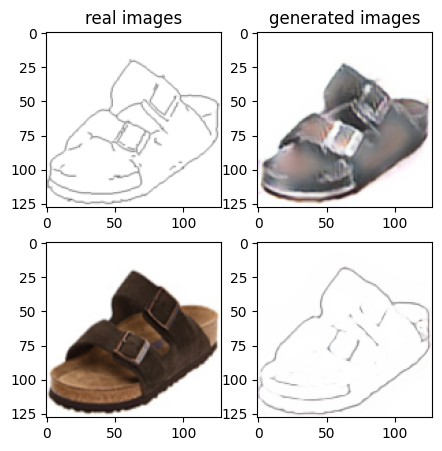

Train Epoch: 2 10% 	Total Loss: 1.246724 	Loss_G_AB: 0.304133	Loss_G_BA: 1.001507	Loss_cycle: 0.346009	Loss_D_A: 0.001637	Loss_D_B: 0.246257
1 55009 T:  1.829585313796997
Train Epoch: 2 10% 	Total Loss: 1.231530 	Loss_G_AB: 0.320371	Loss_G_BA: 0.993577	Loss_cycle: 0.370241	Loss_D_A: 0.001782	Loss_D_B: 0.202533
1 55019 T:  0.9791712760925293
Train Epoch: 2 10% 	Total Loss: 1.364865 	Loss_G_AB: 0.335393	Loss_G_BA: 0.999204	Loss_cycle: 0.391337	Loss_D_A: 0.001393	Loss_D_B: 0.304836
1 55029 T:  0.9851408004760742
Train Epoch: 2 10% 	Total Loss: 1.390477 	Loss_G_AB: 0.313285	Loss_G_BA: 0.999511	Loss_cycle: 0.459560	Loss_D_A: 0.001938	Loss_D_B: 0.272581
1 55039 T:  0.977954626083374
Train Epoch: 2 10% 	Total Loss: 1.371397 	Loss_G_AB: 0.326745	Loss_G_BA: 0.995335	Loss_cycle: 0.442112	Loss_D_A: 0.001822	Loss_D_B: 0.266423
1 55049 T:  0.9800093173980713
Train Epoch: 2 11% 	Total Loss: 1.411189 	Loss_G_AB: 0.295853	Loss_G_BA: 0.859770	Loss_cycle: 0.422665	Loss_D_A: 0.158085	Loss_D_B: 0.252628
1

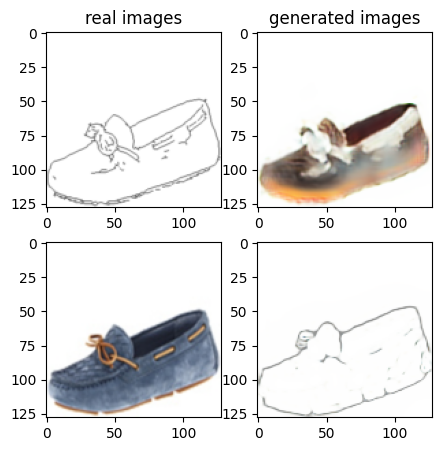

Train Epoch: 2 12% 	Total Loss: 1.334993 	Loss_G_AB: 0.313789	Loss_G_BA: 0.983276	Loss_cycle: 0.442778	Loss_D_A: 0.005965	Loss_D_B: 0.237717
1 56009 T:  1.6633784770965576
Train Epoch: 2 12% 	Total Loss: 1.391501 	Loss_G_AB: 0.295903	Loss_G_BA: 0.936286	Loss_cycle: 0.524486	Loss_D_A: 0.015790	Loss_D_B: 0.235130
1 56019 T:  0.979661226272583
Train Epoch: 2 12% 	Total Loss: 1.231193 	Loss_G_AB: 0.314808	Loss_G_BA: 0.949970	Loss_cycle: 0.340119	Loss_D_A: 0.036159	Loss_D_B: 0.222526
1 56029 T:  0.9802799224853516
Train Epoch: 2 12% 	Total Loss: 1.502408 	Loss_G_AB: 0.406755	Loss_G_BA: 1.019221	Loss_cycle: 0.530356	Loss_D_A: 0.007592	Loss_D_B: 0.251472
1 56039 T:  0.9812185764312744
Train Epoch: 2 12% 	Total Loss: 1.269903 	Loss_G_AB: 0.315538	Loss_G_BA: 0.984514	Loss_cycle: 0.388808	Loss_D_A: 0.008007	Loss_D_B: 0.223061
1 56049 T:  0.9863853454589844
Train Epoch: 2 13% 	Total Loss: 1.380208 	Loss_G_AB: 0.291291	Loss_G_BA: 1.010272	Loss_cycle: 0.462188	Loss_D_A: 0.005992	Loss_D_B: 0.261246


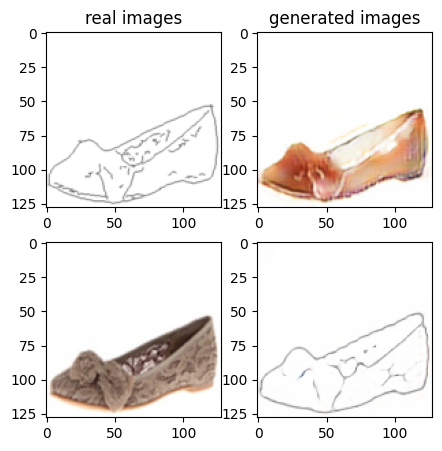

Train Epoch: 2 14% 	Total Loss: 1.280625 	Loss_G_AB: 0.296774	Loss_G_BA: 0.996489	Loss_cycle: 0.365503	Loss_D_A: 0.002864	Loss_D_B: 0.265627
1 57009 T:  1.6835439205169678
Train Epoch: 2 14% 	Total Loss: 1.329552 	Loss_G_AB: 0.343853	Loss_G_BA: 1.001314	Loss_cycle: 0.431563	Loss_D_A: 0.005822	Loss_D_B: 0.219584
1 57019 T:  0.9848523139953613
Train Epoch: 2 14% 	Total Loss: 1.309073 	Loss_G_AB: 0.264637	Loss_G_BA: 0.987100	Loss_cycle: 0.409938	Loss_D_A: 0.001682	Loss_D_B: 0.271584
1 57029 T:  0.9819290637969971
Train Epoch: 2 14% 	Total Loss: 1.213660 	Loss_G_AB: 0.289727	Loss_G_BA: 0.988344	Loss_cycle: 0.336882	Loss_D_A: 0.001958	Loss_D_B: 0.235784
1 57039 T:  0.9840929508209229
Train Epoch: 2 14% 	Total Loss: 1.339414 	Loss_G_AB: 0.288649	Loss_G_BA: 1.008887	Loss_cycle: 0.458344	Loss_D_A: 0.001673	Loss_D_B: 0.230629
1 57049 T:  0.986602783203125
Train Epoch: 2 15% 	Total Loss: 1.269146 	Loss_G_AB: 0.325259	Loss_G_BA: 0.993363	Loss_cycle: 0.388077	Loss_D_A: 0.001679	Loss_D_B: 0.220079


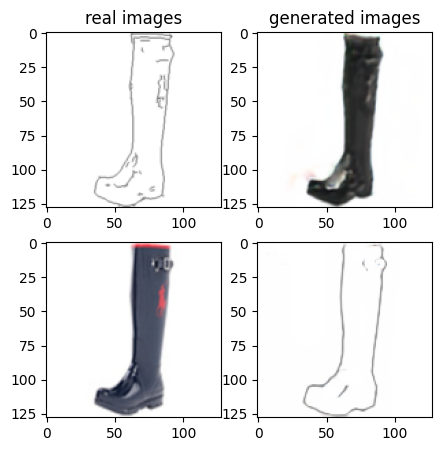

Train Epoch: 2 16% 	Total Loss: 1.240698 	Loss_G_AB: 0.289796	Loss_G_BA: 1.003150	Loss_cycle: 0.341084	Loss_D_A: 0.002399	Loss_D_B: 0.250742
1 58009 T:  1.654345989227295
Train Epoch: 2 16% 	Total Loss: 1.320521 	Loss_G_AB: 0.340832	Loss_G_BA: 0.993073	Loss_cycle: 0.447271	Loss_D_A: 0.002550	Loss_D_B: 0.203748
1 58019 T:  0.981020450592041
Train Epoch: 2 16% 	Total Loss: 1.323173 	Loss_G_AB: 0.322948	Loss_G_BA: 0.931859	Loss_cycle: 0.411737	Loss_D_A: 0.053785	Loss_D_B: 0.230247
1 58029 T:  0.9758617877960205
Train Epoch: 2 16% 	Total Loss: 1.310234 	Loss_G_AB: 0.273488	Loss_G_BA: 0.934803	Loss_cycle: 0.386656	Loss_D_A: 0.040947	Loss_D_B: 0.278485
1 58039 T:  0.9795699119567871
Train Epoch: 2 17% 	Total Loss: 1.330221 	Loss_G_AB: 0.293417	Loss_G_BA: 0.941449	Loss_cycle: 0.471974	Loss_D_A: 0.008082	Loss_D_B: 0.232732
1 58049 T:  1.003650188446045
Train Epoch: 2 17% 	Total Loss: 1.382595 	Loss_G_AB: 0.286077	Loss_G_BA: 1.030724	Loss_cycle: 0.469455	Loss_D_A: 0.002338	Loss_D_B: 0.252401
1 

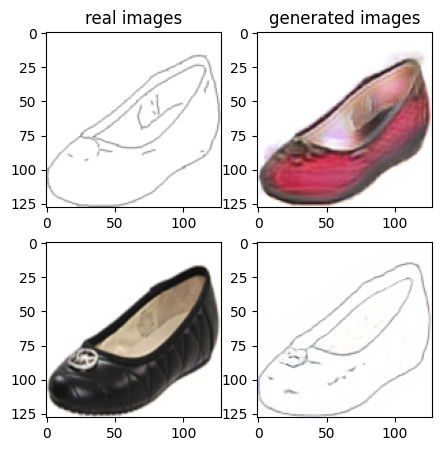

Train Epoch: 2 18% 	Total Loss: 1.205105 	Loss_G_AB: 0.317630	Loss_G_BA: 1.009935	Loss_cycle: 0.326075	Loss_D_A: 0.003468	Loss_D_B: 0.211779
1 59009 T:  1.658926010131836
Train Epoch: 2 18% 	Total Loss: 1.173937 	Loss_G_AB: 0.329774	Loss_G_BA: 0.992995	Loss_cycle: 0.278458	Loss_D_A: 0.003143	Loss_D_B: 0.230951
1 59019 T:  0.9846036434173584
Train Epoch: 2 18% 	Total Loss: 1.343978 	Loss_G_AB: 0.304495	Loss_G_BA: 1.004127	Loss_cycle: 0.450762	Loss_D_A: 0.002324	Loss_D_B: 0.236581
1 59029 T:  0.9815695285797119
Train Epoch: 2 18% 	Total Loss: 1.253304 	Loss_G_AB: 0.294034	Loss_G_BA: 1.003395	Loss_cycle: 0.373480	Loss_D_A: 0.002030	Loss_D_B: 0.229079
1 59039 T:  0.9807131290435791
Train Epoch: 2 19% 	Total Loss: 1.246466 	Loss_G_AB: 0.288321	Loss_G_BA: 0.996080	Loss_cycle: 0.366519	Loss_D_A: 0.001954	Loss_D_B: 0.235792
1 59049 T:  0.9799644947052002
Train Epoch: 2 19% 	Total Loss: 1.321070 	Loss_G_AB: 0.298814	Loss_G_BA: 1.002731	Loss_cycle: 0.406134	Loss_D_A: 0.001353	Loss_D_B: 0.262811


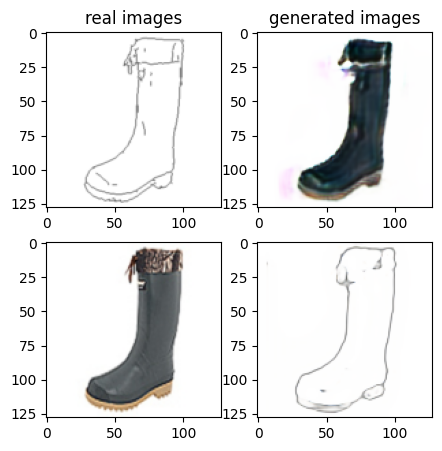

Train Epoch: 2 20% 	Total Loss: 1.420835 	Loss_G_AB: 0.325292	Loss_G_BA: 1.013289	Loss_cycle: 0.520717	Loss_D_A: 0.004775	Loss_D_B: 0.226052
1 60009 T:  1.6501493453979492
Train Epoch: 2 20% 	Total Loss: 1.331629 	Loss_G_AB: 0.307090	Loss_G_BA: 0.996361	Loss_cycle: 0.427699	Loss_D_A: 0.002847	Loss_D_B: 0.249358
1 60019 T:  0.984330415725708
Train Epoch: 2 20% 	Total Loss: 1.180191 	Loss_G_AB: 0.342524	Loss_G_BA: 0.979299	Loss_cycle: 0.280571	Loss_D_A: 0.018896	Loss_D_B: 0.219813
1 60029 T:  0.9804272651672363
Train Epoch: 2 20% 	Total Loss: 1.178785 	Loss_G_AB: 0.271010	Loss_G_BA: 0.997135	Loss_cycle: 0.284267	Loss_D_A: 0.014393	Loss_D_B: 0.246052
1 60039 T:  0.97959303855896
Train Epoch: 2 21% 	Total Loss: 1.366055 	Loss_G_AB: 0.335430	Loss_G_BA: 0.962832	Loss_cycle: 0.488724	Loss_D_A: 0.006466	Loss_D_B: 0.221734
1 60049 T:  0.9987900257110596
Train Epoch: 2 21% 	Total Loss: 1.242743 	Loss_G_AB: 0.306475	Loss_G_BA: 0.961148	Loss_cycle: 0.334907	Loss_D_A: 0.029784	Loss_D_B: 0.244241
1 

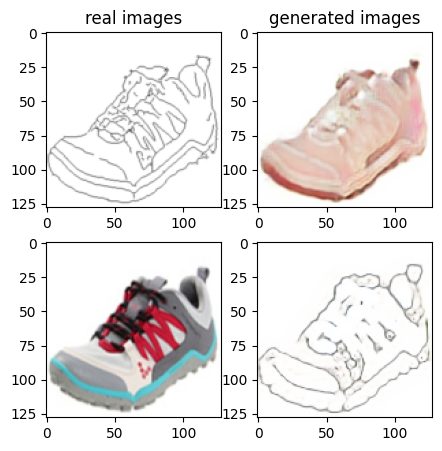

Train Epoch: 2 22% 	Total Loss: 1.352631 	Loss_G_AB: 0.300901	Loss_G_BA: 0.992585	Loss_cycle: 0.447756	Loss_D_A: 0.004246	Loss_D_B: 0.253885
1 61009 T:  1.6445581912994385
Train Epoch: 2 22% 	Total Loss: 1.281821 	Loss_G_AB: 0.262946	Loss_G_BA: 1.002799	Loss_cycle: 0.365034	Loss_D_A: 0.004646	Loss_D_B: 0.279268
1 61019 T:  0.9811863899230957
Train Epoch: 2 22% 	Total Loss: 1.373503 	Loss_G_AB: 0.287526	Loss_G_BA: 1.016782	Loss_cycle: 0.476465	Loss_D_A: 0.002002	Loss_D_B: 0.242882
1 61029 T:  0.9869410991668701
Train Epoch: 2 23% 	Total Loss: 1.226968 	Loss_G_AB: 0.288621	Loss_G_BA: 0.987222	Loss_cycle: 0.348421	Loss_D_A: 0.002598	Loss_D_B: 0.238028
1 61039 T:  1.0052127838134766
Train Epoch: 2 23% 	Total Loss: 1.285293 	Loss_G_AB: 0.296150	Loss_G_BA: 0.994762	Loss_cycle: 0.388980	Loss_D_A: 0.001823	Loss_D_B: 0.249034
1 61049 T:  0.9943022727966309
Train Epoch: 2 23% 	Total Loss: 1.347826 	Loss_G_AB: 0.348221	Loss_G_BA: 0.996804	Loss_cycle: 0.424322	Loss_D_A: 0.001817	Loss_D_B: 0.249174

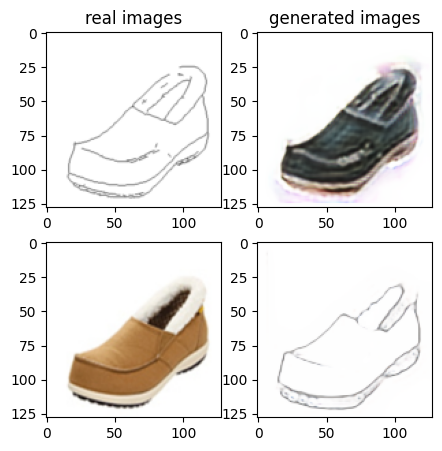

Train Epoch: 2 24% 	Total Loss: 1.347916 	Loss_G_AB: 0.310714	Loss_G_BA: 0.993359	Loss_cycle: 0.447389	Loss_D_A: 0.003195	Loss_D_B: 0.245296
1 62009 T:  1.811631441116333
Train Epoch: 2 24% 	Total Loss: 1.310976 	Loss_G_AB: 0.343935	Loss_G_BA: 0.993672	Loss_cycle: 0.416203	Loss_D_A: 0.001739	Loss_D_B: 0.224230
1 62019 T:  0.9802124500274658
Train Epoch: 2 24% 	Total Loss: 1.332049 	Loss_G_AB: 0.299142	Loss_G_BA: 0.991144	Loss_cycle: 0.434512	Loss_D_A: 0.012090	Loss_D_B: 0.240305
1 62029 T:  0.9799745082855225
Train Epoch: 2 25% 	Total Loss: 1.217496 	Loss_G_AB: 0.280548	Loss_G_BA: 0.920279	Loss_cycle: 0.342452	Loss_D_A: 0.035226	Loss_D_B: 0.239405
1 62039 T:  0.9792296886444092
Train Epoch: 2 25% 	Total Loss: 1.428233 	Loss_G_AB: 0.398814	Loss_G_BA: 0.907339	Loss_cycle: 0.471096	Loss_D_A: 0.041939	Loss_D_B: 0.262121
1 62049 T:  0.982384204864502
Train Epoch: 2 25% 	Total Loss: 1.409107 	Loss_G_AB: 0.355399	Loss_G_BA: 1.027387	Loss_cycle: 0.412576	Loss_D_A: 0.047504	Loss_D_B: 0.257634
1

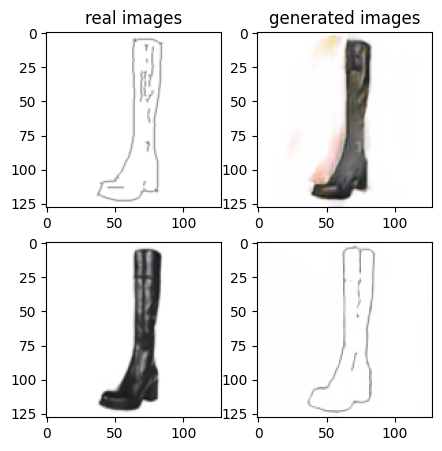

Train Epoch: 2 26% 	Total Loss: 1.277856 	Loss_G_AB: 0.314503	Loss_G_BA: 0.978835	Loss_cycle: 0.368232	Loss_D_A: 0.035053	Loss_D_B: 0.227902
1 63009 T:  1.891791582107544
Train Epoch: 2 26% 	Total Loss: 1.242695 	Loss_G_AB: 0.295469	Loss_G_BA: 1.011850	Loss_cycle: 0.338143	Loss_D_A: 0.006004	Loss_D_B: 0.244888
1 63019 T:  0.9775652885437012
Train Epoch: 2 27% 	Total Loss: 1.260027 	Loss_G_AB: 0.298807	Loss_G_BA: 0.986838	Loss_cycle: 0.361735	Loss_D_A: 0.002860	Loss_D_B: 0.252609
1 63029 T:  0.9842195510864258
Train Epoch: 2 27% 	Total Loss: 1.245803 	Loss_G_AB: 0.331079	Loss_G_BA: 1.007111	Loss_cycle: 0.345372	Loss_D_A: 0.002141	Loss_D_B: 0.229194
1 63039 T:  0.9796643257141113
Train Epoch: 2 27% 	Total Loss: 1.195625 	Loss_G_AB: 0.292049	Loss_G_BA: 0.993687	Loss_cycle: 0.307744	Loss_D_A: 0.002626	Loss_D_B: 0.242387
1 63049 T:  1.02146315574646
Train Epoch: 2 27% 	Total Loss: 1.261419 	Loss_G_AB: 0.327929	Loss_G_BA: 0.993532	Loss_cycle: 0.373708	Loss_D_A: 0.001741	Loss_D_B: 0.225240
1 

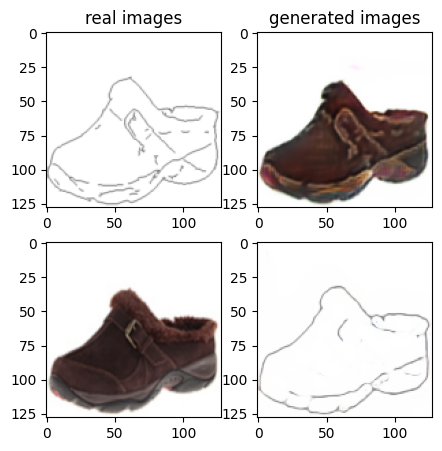

Train Epoch: 2 28% 	Total Loss: 1.212475 	Loss_G_AB: 0.326338	Loss_G_BA: 0.503284	Loss_cycle: 0.374105	Loss_D_A: 0.184712	Loss_D_B: 0.238846
1 64009 T:  1.6455566883087158
Train Epoch: 2 28% 	Total Loss: 1.355952 	Loss_G_AB: 0.310883	Loss_G_BA: 0.695113	Loss_cycle: 0.464154	Loss_D_A: 0.156265	Loss_D_B: 0.232534
1 64019 T:  0.9827136993408203
Train Epoch: 2 29% 	Total Loss: 1.307783 	Loss_G_AB: 0.300779	Loss_G_BA: 0.561336	Loss_cycle: 0.486887	Loss_D_A: 0.157695	Loss_D_B: 0.232143
1 64029 T:  0.9803740978240967
Train Epoch: 2 29% 	Total Loss: 1.269352 	Loss_G_AB: 0.302521	Loss_G_BA: 0.583826	Loss_cycle: 0.429989	Loss_D_A: 0.165477	Loss_D_B: 0.230713
1 64039 T:  0.9961068630218506
Train Epoch: 2 29% 	Total Loss: 1.355111 	Loss_G_AB: 0.318690	Loss_G_BA: 0.738438	Loss_cycle: 0.415597	Loss_D_A: 0.159912	Loss_D_B: 0.251036
1 64049 T:  0.9982810020446777
Train Epoch: 2 29% 	Total Loss: 1.270460 	Loss_G_AB: 0.260634	Loss_G_BA: 0.520149	Loss_cycle: 0.407188	Loss_D_A: 0.211914	Loss_D_B: 0.260966

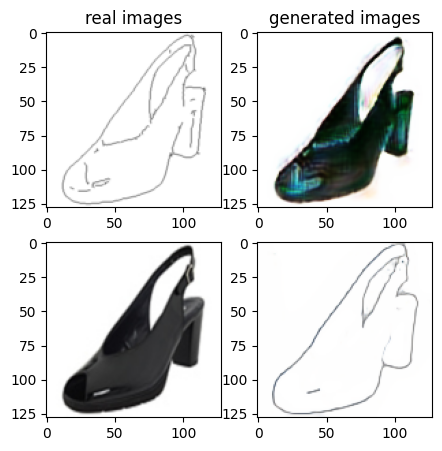

Train Epoch: 2 30% 	Total Loss: 1.328525 	Loss_G_AB: 0.317676	Loss_G_BA: 0.969945	Loss_cycle: 0.426289	Loss_D_A: 0.004095	Loss_D_B: 0.254331
1 65009 T:  1.6716320514678955
Train Epoch: 2 30% 	Total Loss: 1.256773 	Loss_G_AB: 0.310553	Loss_G_BA: 1.018509	Loss_cycle: 0.351579	Loss_D_A: 0.003600	Loss_D_B: 0.237063
1 65019 T:  0.9744367599487305
Train Epoch: 2 31% 	Total Loss: 1.391756 	Loss_G_AB: 0.275772	Loss_G_BA: 0.969412	Loss_cycle: 0.492577	Loss_D_A: 0.004487	Loss_D_B: 0.272100
1 65029 T:  0.9802596569061279
Train Epoch: 2 31% 	Total Loss: 1.277142 	Loss_G_AB: 0.276287	Loss_G_BA: 0.978261	Loss_cycle: 0.379910	Loss_D_A: 0.010731	Loss_D_B: 0.259227
1 65039 T:  0.9795002937316895
Train Epoch: 2 31% 	Total Loss: 1.298876 	Loss_G_AB: 0.363885	Loss_G_BA: 1.025854	Loss_cycle: 0.371137	Loss_D_A: 0.003875	Loss_D_B: 0.228994
1 65049 T:  0.9866781234741211
Train Epoch: 2 31% 	Total Loss: 1.316176 	Loss_G_AB: 0.312646	Loss_G_BA: 1.011392	Loss_cycle: 0.395810	Loss_D_A: 0.003260	Loss_D_B: 0.255087

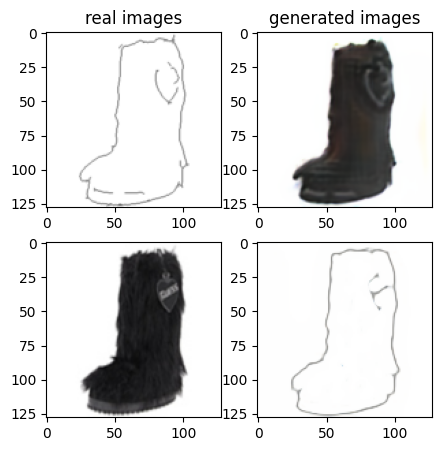

Train Epoch: 2 32% 	Total Loss: 1.300053 	Loss_G_AB: 0.289488	Loss_G_BA: 0.979289	Loss_cycle: 0.412016	Loss_D_A: 0.002012	Loss_D_B: 0.251637
1 66009 T:  1.6876518726348877
Train Epoch: 2 33% 	Total Loss: 1.270739 	Loss_G_AB: 0.288975	Loss_G_BA: 1.002647	Loss_cycle: 0.368246	Loss_D_A: 0.003546	Loss_D_B: 0.253136
1 66019 T:  0.9833014011383057
Train Epoch: 2 33% 	Total Loss: 1.190488 	Loss_G_AB: 0.314393	Loss_G_BA: 0.993162	Loss_cycle: 0.298336	Loss_D_A: 0.002813	Loss_D_B: 0.235562
1 66029 T:  0.9780936241149902
Train Epoch: 2 33% 	Total Loss: 1.361458 	Loss_G_AB: 0.377412	Loss_G_BA: 1.011663	Loss_cycle: 0.461588	Loss_D_A: 0.002117	Loss_D_B: 0.203215
1 66039 T:  0.9896373748779297
Train Epoch: 2 33% 	Total Loss: 1.404846 	Loss_G_AB: 0.263912	Loss_G_BA: 0.990013	Loss_cycle: 0.499047	Loss_D_A: 0.001776	Loss_D_B: 0.277060
1 66049 T:  1.005143165588379
Train Epoch: 2 33% 	Total Loss: 1.269511 	Loss_G_AB: 0.245194	Loss_G_BA: 1.001868	Loss_cycle: 0.368564	Loss_D_A: 0.002169	Loss_D_B: 0.275247


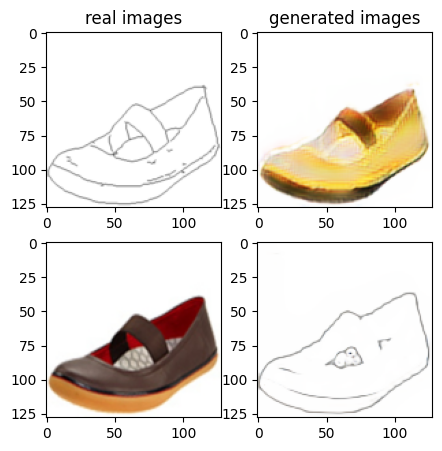

Train Epoch: 2 34% 	Total Loss: 1.288807 	Loss_G_AB: 0.283861	Loss_G_BA: 0.988885	Loss_cycle: 0.386383	Loss_D_A: 0.008445	Loss_D_B: 0.257606
1 67009 T:  1.9966144561767578
Train Epoch: 2 35% 	Total Loss: 1.316739 	Loss_G_AB: 0.297099	Loss_G_BA: 0.959375	Loss_cycle: 0.409956	Loss_D_A: 0.021665	Loss_D_B: 0.256880
1 67019 T:  0.9821548461914062
Train Epoch: 2 35% 	Total Loss: 1.279017 	Loss_G_AB: 0.296603	Loss_G_BA: 0.931969	Loss_cycle: 0.409295	Loss_D_A: 0.013034	Loss_D_B: 0.242402
1 67029 T:  0.9825394153594971
Train Epoch: 2 35% 	Total Loss: 1.327106 	Loss_G_AB: 0.270010	Loss_G_BA: 1.053869	Loss_cycle: 0.402721	Loss_D_A: 0.008235	Loss_D_B: 0.254211
1 67039 T:  1.0044260025024414
Train Epoch: 2 35% 	Total Loss: 1.319639 	Loss_G_AB: 0.286743	Loss_G_BA: 0.938732	Loss_cycle: 0.428926	Loss_D_A: 0.020144	Loss_D_B: 0.257831
1 67049 T:  1.0165622234344482
Train Epoch: 2 35% 	Total Loss: 1.276368 	Loss_G_AB: 0.278375	Loss_G_BA: 0.981788	Loss_cycle: 0.387805	Loss_D_A: 0.016850	Loss_D_B: 0.241632

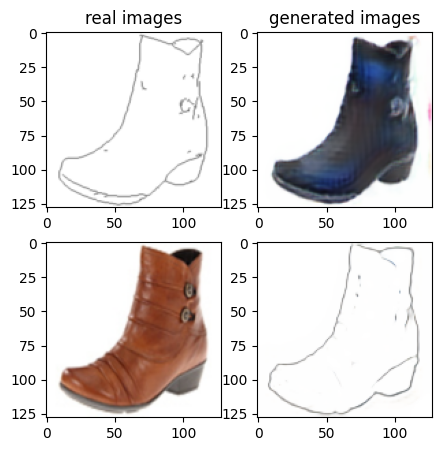

Train Epoch: 2 36% 	Total Loss: 1.229495 	Loss_G_AB: 0.300814	Loss_G_BA: 0.818497	Loss_cycle: 0.372920	Loss_D_A: 0.069173	Loss_D_B: 0.227746
1 68009 T:  1.6781749725341797
Train Epoch: 2 37% 	Total Loss: 1.334127 	Loss_G_AB: 0.277828	Loss_G_BA: 0.843117	Loss_cycle: 0.357577	Loss_D_A: 0.151057	Loss_D_B: 0.265020
1 68019 T:  0.9947304725646973
Train Epoch: 2 37% 	Total Loss: 1.332121 	Loss_G_AB: 0.308821	Loss_G_BA: 0.814810	Loss_cycle: 0.436882	Loss_D_A: 0.100440	Loss_D_B: 0.232983
1 68029 T:  1.0084500312805176
Train Epoch: 2 37% 	Total Loss: 1.311476 	Loss_G_AB: 0.334795	Loss_G_BA: 0.863796	Loss_cycle: 0.394353	Loss_D_A: 0.087211	Loss_D_B: 0.230616
1 68039 T:  1.0162150859832764
Train Epoch: 2 37% 	Total Loss: 1.296101 	Loss_G_AB: 0.281482	Loss_G_BA: 0.887927	Loss_cycle: 0.357076	Loss_D_A: 0.061940	Loss_D_B: 0.292380
1 68049 T:  0.9988770484924316
Train Epoch: 2 37% 	Total Loss: 1.228270 	Loss_G_AB: 0.301909	Loss_G_BA: 0.926919	Loss_cycle: 0.346796	Loss_D_A: 0.044354	Loss_D_B: 0.222706

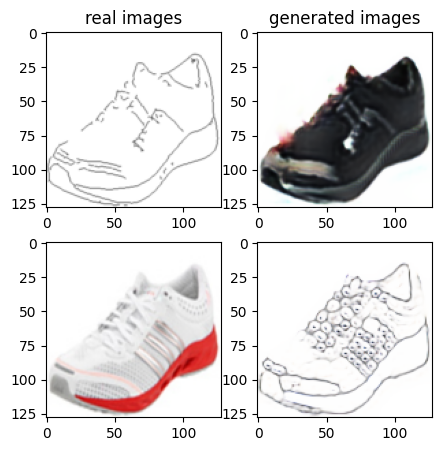

Train Epoch: 2 39% 	Total Loss: 1.278654 	Loss_G_AB: 0.308688	Loss_G_BA: 0.985813	Loss_cycle: 0.387592	Loss_D_A: 0.002314	Loss_D_B: 0.241498
1 69009 T:  1.8557136058807373
Train Epoch: 2 39% 	Total Loss: 1.285388 	Loss_G_AB: 0.278403	Loss_G_BA: 0.975055	Loss_cycle: 0.383279	Loss_D_A: 0.010599	Loss_D_B: 0.264781
1 69019 T:  1.002549409866333
Train Epoch: 2 39% 	Total Loss: 1.333822 	Loss_G_AB: 0.303814	Loss_G_BA: 0.956414	Loss_cycle: 0.454954	Loss_D_A: 0.010497	Loss_D_B: 0.238257
1 69029 T:  1.0152840614318848
Train Epoch: 2 39% 	Total Loss: 1.271362 	Loss_G_AB: 0.266664	Loss_G_BA: 1.013703	Loss_cycle: 0.371294	Loss_D_A: 0.012129	Loss_D_B: 0.247756
1 69039 T:  1.011955976486206
Train Epoch: 2 39% 	Total Loss: 1.279607 	Loss_G_AB: 0.354846	Loss_G_BA: 0.947080	Loss_cycle: 0.387624	Loss_D_A: 0.019202	Loss_D_B: 0.221817
1 69049 T:  1.0088732242584229
Train Epoch: 2 39% 	Total Loss: 1.300098 	Loss_G_AB: 0.318892	Loss_G_BA: 0.990151	Loss_cycle: 0.420735	Loss_D_A: 0.006021	Loss_D_B: 0.218820
1

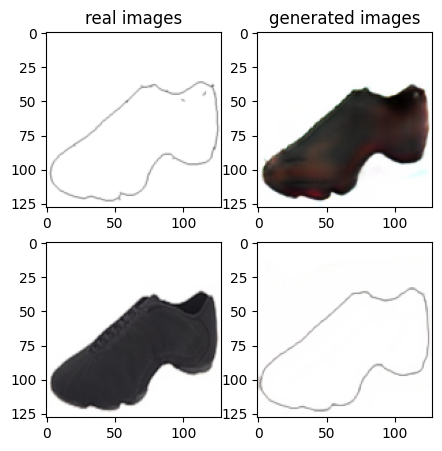

Train Epoch: 2 41% 	Total Loss: 1.268770 	Loss_G_AB: 0.303870	Loss_G_BA: 0.995487	Loss_cycle: 0.384731	Loss_D_A: 0.001847	Loss_D_B: 0.232513
1 70009 T:  1.947178602218628
Train Epoch: 2 41% 	Total Loss: 1.310909 	Loss_G_AB: 0.297760	Loss_G_BA: 0.980404	Loss_cycle: 0.418206	Loss_D_A: 0.001793	Loss_D_B: 0.251828
1 70019 T:  1.0016915798187256
Train Epoch: 2 41% 	Total Loss: 1.283233 	Loss_G_AB: 0.280189	Loss_G_BA: 1.015901	Loss_cycle: 0.385406	Loss_D_A: 0.001373	Loss_D_B: 0.248408
1 70029 T:  1.0311567783355713
Train Epoch: 2 41% 	Total Loss: 1.137104 	Loss_G_AB: 0.302654	Loss_G_BA: 0.991374	Loss_cycle: 0.250300	Loss_D_A: 0.002248	Loss_D_B: 0.237543
1 70039 T:  0.996912956237793
Train Epoch: 2 41% 	Total Loss: 1.303539 	Loss_G_AB: 0.286946	Loss_G_BA: 0.997546	Loss_cycle: 0.429476	Loss_D_A: 0.001695	Loss_D_B: 0.230121
1 70049 T:  1.033050537109375
Train Epoch: 2 41% 	Total Loss: 1.293003 	Loss_G_AB: 0.242552	Loss_G_BA: 1.000323	Loss_cycle: 0.391946	Loss_D_A: 0.003052	Loss_D_B: 0.276568
1 

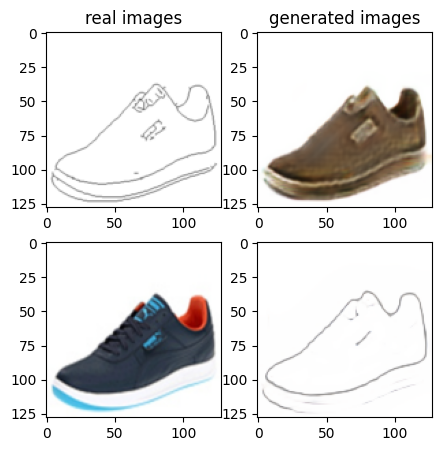

Train Epoch: 2 43% 	Total Loss: 1.300251 	Loss_G_AB: 0.312961	Loss_G_BA: 1.002804	Loss_cycle: 0.417639	Loss_D_A: 0.008206	Loss_D_B: 0.216524
1 71009 T:  1.9928410053253174
Train Epoch: 2 43% 	Total Loss: 1.289112 	Loss_G_AB: 0.314559	Loss_G_BA: 0.938869	Loss_cycle: 0.372235	Loss_D_A: 0.049972	Loss_D_B: 0.240191
1 71019 T:  1.0052826404571533
Train Epoch: 2 43% 	Total Loss: 1.313286 	Loss_G_AB: 0.342065	Loss_G_BA: 0.897108	Loss_cycle: 0.394550	Loss_D_A: 0.059704	Loss_D_B: 0.239446
1 71029 T:  1.0234110355377197
Train Epoch: 2 43% 	Total Loss: 1.261879 	Loss_G_AB: 0.345905	Loss_G_BA: 0.971393	Loss_cycle: 0.359030	Loss_D_A: 0.023057	Loss_D_B: 0.221143
1 71039 T:  1.0011475086212158
Train Epoch: 2 43% 	Total Loss: 1.421932 	Loss_G_AB: 0.362130	Loss_G_BA: 1.053584	Loss_cycle: 0.474754	Loss_D_A: 0.007117	Loss_D_B: 0.232203
1 71049 T:  1.009868860244751
Train Epoch: 2 43% 	Total Loss: 1.329720 	Loss_G_AB: 0.249105	Loss_G_BA: 0.977000	Loss_cycle: 0.403918	Loss_D_A: 0.010740	Loss_D_B: 0.302010


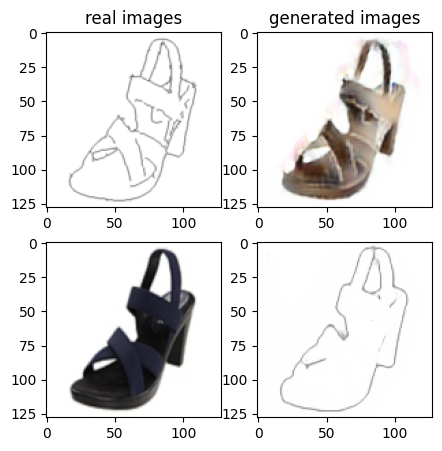

Train Epoch: 2 45% 	Total Loss: 1.278610 	Loss_G_AB: 0.302023	Loss_G_BA: 1.001150	Loss_cycle: 0.395303	Loss_D_A: 0.007562	Loss_D_B: 0.224158
1 72009 T:  1.8515548706054688
Train Epoch: 2 45% 	Total Loss: 1.357434 	Loss_G_AB: 0.293091	Loss_G_BA: 0.963063	Loss_cycle: 0.476353	Loss_D_A: 0.020081	Loss_D_B: 0.232922
1 72019 T:  1.0459048748016357
Train Epoch: 2 45% 	Total Loss: 1.219574 	Loss_G_AB: 0.316117	Loss_G_BA: 1.046273	Loss_cycle: 0.299631	Loss_D_A: 0.005745	Loss_D_B: 0.233003
1 72029 T:  1.0121893882751465
Train Epoch: 2 45% 	Total Loss: 1.359644 	Loss_G_AB: 0.366361	Loss_G_BA: 0.977659	Loss_cycle: 0.478053	Loss_D_A: 0.007036	Loss_D_B: 0.202545
1 72039 T:  1.0044126510620117
Train Epoch: 2 45% 	Total Loss: 1.292546 	Loss_G_AB: 0.379239	Loss_G_BA: 0.983528	Loss_cycle: 0.358089	Loss_D_A: 0.002619	Loss_D_B: 0.250455
1 72049 T:  1.0524344444274902
Train Epoch: 2 45% 	Total Loss: 1.231819 	Loss_G_AB: 0.272763	Loss_G_BA: 0.954379	Loss_cycle: 0.319441	Loss_D_A: 0.022492	Loss_D_B: 0.276316

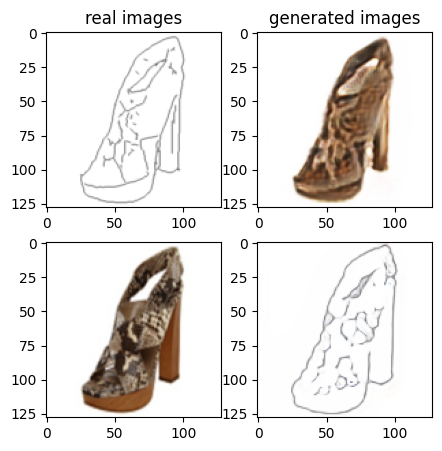

Train Epoch: 2 47% 	Total Loss: 1.300575 	Loss_G_AB: 0.281802	Loss_G_BA: 0.986872	Loss_cycle: 0.401129	Loss_D_A: 0.002509	Loss_D_B: 0.262600
1 73009 T:  1.6838862895965576
Train Epoch: 2 47% 	Total Loss: 1.227856 	Loss_G_AB: 0.329358	Loss_G_BA: 1.016862	Loss_cycle: 0.344339	Loss_D_A: 0.001880	Loss_D_B: 0.208528
1 73019 T:  0.9791550636291504
Train Epoch: 2 47% 	Total Loss: 1.295663 	Loss_G_AB: 0.300148	Loss_G_BA: 1.000147	Loss_cycle: 0.389920	Loss_D_A: 0.001457	Loss_D_B: 0.254139
1 73029 T:  0.9835784435272217
Train Epoch: 2 47% 	Total Loss: 1.362390 	Loss_G_AB: 0.368451	Loss_G_BA: 0.996480	Loss_cycle: 0.455765	Loss_D_A: 0.002425	Loss_D_B: 0.221734
1 73039 T:  0.9773092269897461
Train Epoch: 2 47% 	Total Loss: 1.311315 	Loss_G_AB: 0.319866	Loss_G_BA: 1.001369	Loss_cycle: 0.434290	Loss_D_A: 0.001822	Loss_D_B: 0.214585
1 73049 T:  0.9884755611419678
Train Epoch: 2 47% 	Total Loss: 1.204713 	Loss_G_AB: 0.351501	Loss_G_BA: 0.992483	Loss_cycle: 0.286468	Loss_D_A: 0.004579	Loss_D_B: 0.241673

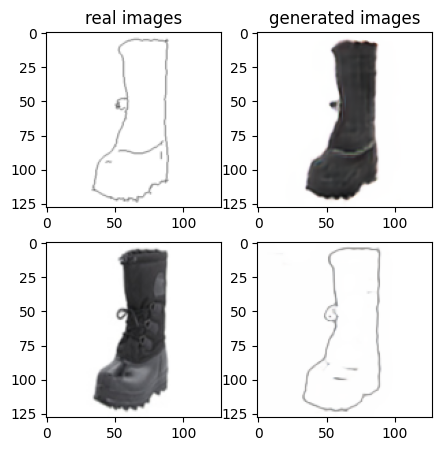

Train Epoch: 2 49% 	Total Loss: 1.204563 	Loss_G_AB: 0.331595	Loss_G_BA: 0.840949	Loss_cycle: 0.329273	Loss_D_A: 0.062787	Loss_D_B: 0.226230
1 74009 T:  1.7331013679504395
Train Epoch: 2 49% 	Total Loss: 1.245424 	Loss_G_AB: 0.289638	Loss_G_BA: 0.883948	Loss_cycle: 0.341625	Loss_D_A: 0.058161	Loss_D_B: 0.258844
1 74019 T:  0.987252950668335
Train Epoch: 2 49% 	Total Loss: 1.292954 	Loss_G_AB: 0.285475	Loss_G_BA: 0.985321	Loss_cycle: 0.374035	Loss_D_A: 0.024273	Loss_D_B: 0.259248
1 74029 T:  0.9835286140441895
Train Epoch: 2 49% 	Total Loss: 1.257128 	Loss_G_AB: 0.296181	Loss_G_BA: 0.947398	Loss_cycle: 0.370958	Loss_D_A: 0.019826	Loss_D_B: 0.244554
1 74039 T:  0.9855532646179199
Train Epoch: 2 49% 	Total Loss: 1.330414 	Loss_G_AB: 0.298459	Loss_G_BA: 1.029890	Loss_cycle: 0.395112	Loss_D_A: 0.008280	Loss_D_B: 0.262847
1 74049 T:  0.9864223003387451
Train Epoch: 2 49% 	Total Loss: 1.399855 	Loss_G_AB: 0.281718	Loss_G_BA: 0.958674	Loss_cycle: 0.494976	Loss_D_A: 0.022804	Loss_D_B: 0.261880


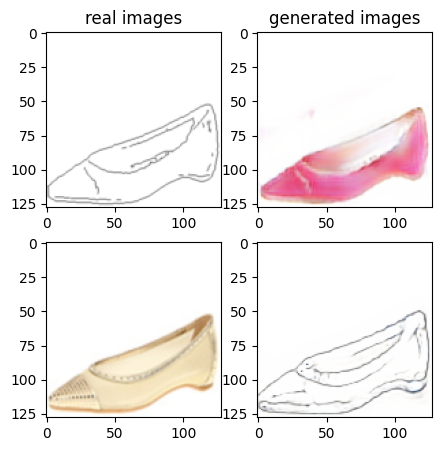

Train Epoch: 2 51% 	Total Loss: 1.276727 	Loss_G_AB: 0.329167	Loss_G_BA: 1.010980	Loss_cycle: 0.372361	Loss_D_A: 0.006659	Loss_D_B: 0.227633
1 75009 T:  1.884591817855835
Train Epoch: 2 51% 	Total Loss: 1.208443 	Loss_G_AB: 0.293197	Loss_G_BA: 1.015315	Loss_cycle: 0.291710	Loss_D_A: 0.002667	Loss_D_B: 0.259810
1 75019 T:  0.9903838634490967
Train Epoch: 2 51% 	Total Loss: 1.227514 	Loss_G_AB: 0.289459	Loss_G_BA: 0.993180	Loss_cycle: 0.352540	Loss_D_A: 0.002483	Loss_D_B: 0.231172
1 75029 T:  0.9808361530303955
Train Epoch: 2 51% 	Total Loss: 1.267218 	Loss_G_AB: 0.278621	Loss_G_BA: 0.992509	Loss_cycle: 0.372432	Loss_D_A: 0.002493	Loss_D_B: 0.256728
1 75039 T:  0.989415168762207
Train Epoch: 2 51% 	Total Loss: 1.255155 	Loss_G_AB: 0.292554	Loss_G_BA: 1.013239	Loss_cycle: 0.368117	Loss_D_A: 0.002788	Loss_D_B: 0.231352
1 75049 T:  0.9872524738311768
Train Epoch: 2 51% 	Total Loss: 1.224229 	Loss_G_AB: 0.291572	Loss_G_BA: 0.991173	Loss_cycle: 0.336364	Loss_D_A: 0.001469	Loss_D_B: 0.245023
1

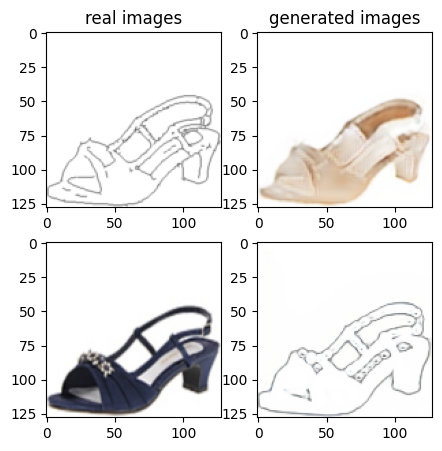

Train Epoch: 2 53% 	Total Loss: 1.299457 	Loss_G_AB: 0.293231	Loss_G_BA: 0.967977	Loss_cycle: 0.421691	Loss_D_A: 0.009317	Loss_D_B: 0.237845
1 76009 T:  2.091933250427246
Train Epoch: 2 53% 	Total Loss: 1.196996 	Loss_G_AB: 0.290850	Loss_G_BA: 0.981450	Loss_cycle: 0.323415	Loss_D_A: 0.005821	Loss_D_B: 0.231610
1 76019 T:  1.0056352615356445
Train Epoch: 2 53% 	Total Loss: 1.244553 	Loss_G_AB: 0.320981	Loss_G_BA: 1.021475	Loss_cycle: 0.324232	Loss_D_A: 0.008633	Loss_D_B: 0.240461
1 76029 T:  1.0253331661224365
Train Epoch: 2 53% 	Total Loss: 1.298287 	Loss_G_AB: 0.265112	Loss_G_BA: 1.002342	Loss_cycle: 0.398311	Loss_D_A: 0.003819	Loss_D_B: 0.262430
1 76039 T:  1.0040977001190186
Train Epoch: 2 53% 	Total Loss: 1.233636 	Loss_G_AB: 0.298402	Loss_G_BA: 0.998274	Loss_cycle: 0.336971	Loss_D_A: 0.003115	Loss_D_B: 0.245212
1 76049 T:  0.9757475852966309
Train Epoch: 2 53% 	Total Loss: 1.192509 	Loss_G_AB: 0.285530	Loss_G_BA: 0.982181	Loss_cycle: 0.316914	Loss_D_A: 0.005296	Loss_D_B: 0.236444


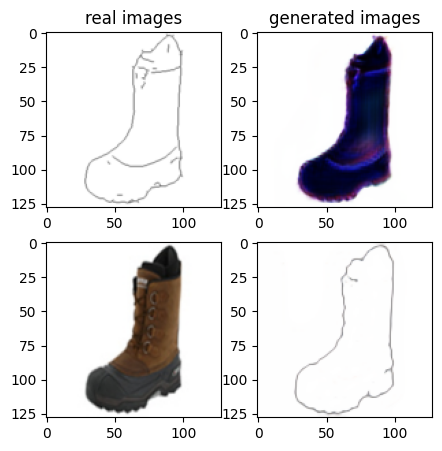

Train Epoch: 2 55% 	Total Loss: 1.235043 	Loss_G_AB: 0.302358	Loss_G_BA: 0.952595	Loss_cycle: 0.309986	Loss_D_A: 0.040111	Loss_D_B: 0.257469
1 77009 T:  1.93890380859375
Train Epoch: 2 55% 	Total Loss: 1.231209 	Loss_G_AB: 0.310713	Loss_G_BA: 0.993015	Loss_cycle: 0.323921	Loss_D_A: 0.018786	Loss_D_B: 0.236638
1 77019 T:  1.0212500095367432
Train Epoch: 2 55% 	Total Loss: 1.281482 	Loss_G_AB: 0.298536	Loss_G_BA: 0.959142	Loss_cycle: 0.397396	Loss_D_A: 0.013405	Loss_D_B: 0.241842
1 77029 T:  1.0238697528839111
Train Epoch: 2 55% 	Total Loss: 1.309669 	Loss_G_AB: 0.281007	Loss_G_BA: 0.990029	Loss_cycle: 0.408024	Loss_D_A: 0.024255	Loss_D_B: 0.241873
1 77039 T:  0.9872477054595947
Train Epoch: 2 55% 	Total Loss: 1.271010 	Loss_G_AB: 0.342426	Loss_G_BA: 0.990500	Loss_cycle: 0.342095	Loss_D_A: 0.009278	Loss_D_B: 0.253174
1 77049 T:  0.9769673347473145
Train Epoch: 2 55% 	Total Loss: 1.296248 	Loss_G_AB: 0.330533	Loss_G_BA: 1.007707	Loss_cycle: 0.385944	Loss_D_A: 0.004751	Loss_D_B: 0.236433
1

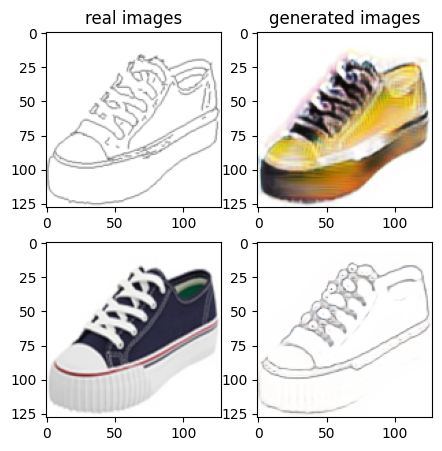

Train Epoch: 2 57% 	Total Loss: 1.317980 	Loss_G_AB: 0.383358	Loss_G_BA: 0.989051	Loss_cycle: 0.399717	Loss_D_A: 0.001754	Loss_D_B: 0.230304
1 78009 T:  1.9735918045043945
Train Epoch: 2 57% 	Total Loss: 1.249253 	Loss_G_AB: 0.338066	Loss_G_BA: 1.004985	Loss_cycle: 0.337176	Loss_D_A: 0.004959	Loss_D_B: 0.235592
1 78019 T:  1.004464864730835
Train Epoch: 2 57% 	Total Loss: 1.182608 	Loss_G_AB: 0.317811	Loss_G_BA: 1.004837	Loss_cycle: 0.288509	Loss_D_A: 0.003946	Loss_D_B: 0.228830
1 78029 T:  1.0113599300384521
Train Epoch: 2 57% 	Total Loss: 1.256021 	Loss_G_AB: 0.293272	Loss_G_BA: 0.997760	Loss_cycle: 0.347675	Loss_D_A: 0.001554	Loss_D_B: 0.261276
1 78039 T:  1.032705545425415
Train Epoch: 2 57% 	Total Loss: 1.140086 	Loss_G_AB: 0.277792	Loss_G_BA: 1.002661	Loss_cycle: 0.251181	Loss_D_A: 0.001407	Loss_D_B: 0.247271
1 78049 T:  0.9929139614105225
Train Epoch: 2 57% 	Total Loss: 1.214003 	Loss_G_AB: 0.303729	Loss_G_BA: 0.999651	Loss_cycle: 0.303592	Loss_D_A: 0.001132	Loss_D_B: 0.257588
1

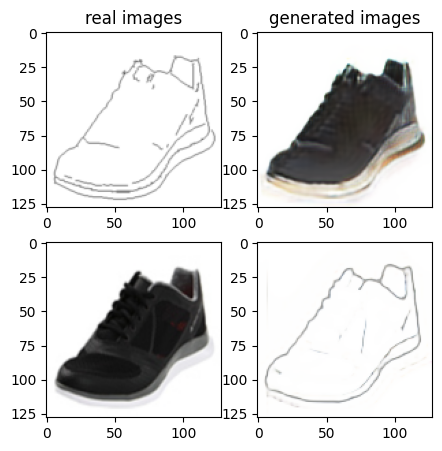

Train Epoch: 2 59% 	Total Loss: 1.310854 	Loss_G_AB: 0.292685	Loss_G_BA: 1.005904	Loss_cycle: 0.410457	Loss_D_A: 0.002942	Loss_D_B: 0.248161
1 79009 T:  2.040581464767456
Train Epoch: 2 59% 	Total Loss: 1.236782 	Loss_G_AB: 0.363922	Loss_G_BA: 0.994707	Loss_cycle: 0.338650	Loss_D_A: 0.001890	Loss_D_B: 0.216928
1 79019 T:  1.0318152904510498
Train Epoch: 2 59% 	Total Loss: 1.248706 	Loss_G_AB: 0.274467	Loss_G_BA: 1.007415	Loss_cycle: 0.363181	Loss_D_A: 0.004646	Loss_D_B: 0.239938
1 79029 T:  1.036503791809082
Train Epoch: 2 59% 	Total Loss: 1.224885 	Loss_G_AB: 0.338037	Loss_G_BA: 1.003235	Loss_cycle: 0.337696	Loss_D_A: 0.002366	Loss_D_B: 0.214186
1 79039 T:  0.9824073314666748
Train Epoch: 2 59% 	Total Loss: 1.283136 	Loss_G_AB: 0.260912	Loss_G_BA: 0.995884	Loss_cycle: 0.344921	Loss_D_A: 0.002287	Loss_D_B: 0.307530
1 79049 T:  0.9832742214202881
Train Epoch: 2 59% 	Total Loss: 1.178014 	Loss_G_AB: 0.326101	Loss_G_BA: 1.009085	Loss_cycle: 0.279365	Loss_D_A: 0.003043	Loss_D_B: 0.228013
1

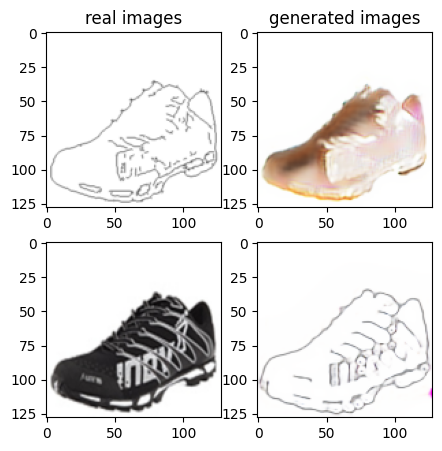

Train Epoch: 2 61% 	Total Loss: 1.342323 	Loss_G_AB: 0.351588	Loss_G_BA: 1.049662	Loss_cycle: 0.409113	Loss_D_A: 0.007730	Loss_D_B: 0.224854
1 80009 T:  2.031893014907837
Train Epoch: 2 61% 	Total Loss: 1.277711 	Loss_G_AB: 0.323045	Loss_G_BA: 0.968856	Loss_cycle: 0.356513	Loss_D_A: 0.008535	Loss_D_B: 0.266713
1 80019 T:  1.0140182971954346
Train Epoch: 2 61% 	Total Loss: 1.295810 	Loss_G_AB: 0.293145	Loss_G_BA: 0.953870	Loss_cycle: 0.365162	Loss_D_A: 0.010924	Loss_D_B: 0.296218
1 80029 T:  1.0072524547576904
Train Epoch: 2 61% 	Total Loss: 1.229462 	Loss_G_AB: 0.296582	Loss_G_BA: 0.772767	Loss_cycle: 0.353693	Loss_D_A: 0.077082	Loss_D_B: 0.264012
1 80039 T:  0.9948978424072266
Train Epoch: 2 61% 	Total Loss: 1.295105 	Loss_G_AB: 0.286983	Loss_G_BA: 0.986117	Loss_cycle: 0.374017	Loss_D_A: 0.013705	Loss_D_B: 0.270833
1 80049 T:  0.9775776863098145
Train Epoch: 2 61% 	Total Loss: 1.393939 	Loss_G_AB: 0.284075	Loss_G_BA: 0.999549	Loss_cycle: 0.490179	Loss_D_A: 0.015983	Loss_D_B: 0.245966


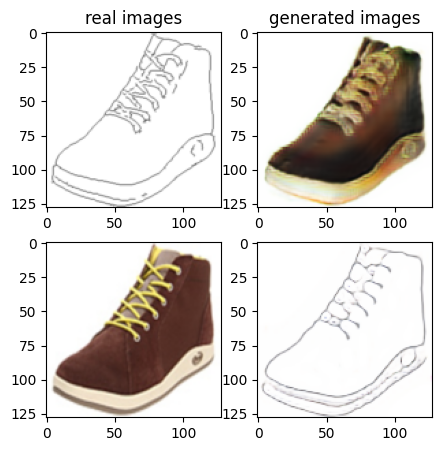

Train Epoch: 2 63% 	Total Loss: 1.271908 	Loss_G_AB: 0.273721	Loss_G_BA: 1.019182	Loss_cycle: 0.358602	Loss_D_A: 0.006660	Loss_D_B: 0.260194
1 81009 T:  1.675917625427246
Train Epoch: 2 63% 	Total Loss: 1.335866 	Loss_G_AB: 0.314730	Loss_G_BA: 1.002955	Loss_cycle: 0.428483	Loss_D_A: 0.003109	Loss_D_B: 0.245431
1 81019 T:  1.0133788585662842
Train Epoch: 2 63% 	Total Loss: 1.517202 	Loss_G_AB: 0.254072	Loss_G_BA: 0.978935	Loss_cycle: 0.603340	Loss_D_A: 0.006445	Loss_D_B: 0.290914
1 81029 T:  1.0525057315826416
Train Epoch: 2 63% 	Total Loss: 1.373555 	Loss_G_AB: 0.334052	Loss_G_BA: 0.827640	Loss_cycle: 0.394093	Loss_D_A: 0.161509	Loss_D_B: 0.237107
1 81039 T:  1.0374152660369873
Train Epoch: 2 63% 	Total Loss: 1.234649 	Loss_G_AB: 0.281375	Loss_G_BA: 0.821916	Loss_cycle: 0.383361	Loss_D_A: 0.049847	Loss_D_B: 0.249796
1 81049 T:  1.001030445098877
Train Epoch: 2 63% 	Total Loss: 1.387217 	Loss_G_AB: 0.371359	Loss_G_BA: 0.881658	Loss_cycle: 0.446806	Loss_D_A: 0.078626	Loss_D_B: 0.235277
1

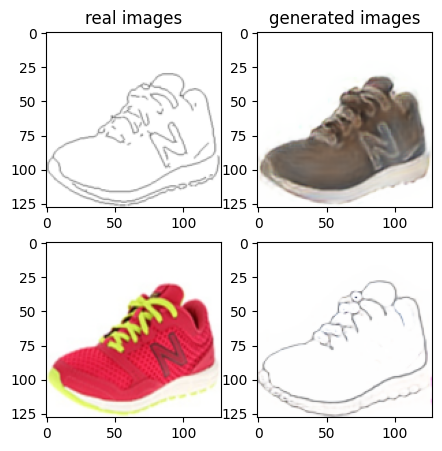

Train Epoch: 2 65% 	Total Loss: 1.230807 	Loss_G_AB: 0.313100	Loss_G_BA: 0.996791	Loss_cycle: 0.344149	Loss_D_A: 0.001018	Loss_D_B: 0.230694
1 82009 T:  1.8063409328460693
Train Epoch: 2 65% 	Total Loss: 1.253135 	Loss_G_AB: 0.322528	Loss_G_BA: 1.001894	Loss_cycle: 0.354586	Loss_D_A: 0.001034	Loss_D_B: 0.235305
1 82019 T:  0.9790980815887451
Train Epoch: 2 65% 	Total Loss: 1.297464 	Loss_G_AB: 0.303417	Loss_G_BA: 0.991288	Loss_cycle: 0.394929	Loss_D_A: 0.001841	Loss_D_B: 0.253342
1 82029 T:  1.0043153762817383
Train Epoch: 2 65% 	Total Loss: 1.273039 	Loss_G_AB: 0.328571	Loss_G_BA: 1.002262	Loss_cycle: 0.381595	Loss_D_A: 0.002068	Loss_D_B: 0.223959
1 82039 T:  0.997187614440918
Train Epoch: 2 65% 	Total Loss: 1.266140 	Loss_G_AB: 0.304911	Loss_G_BA: 1.003598	Loss_cycle: 0.349728	Loss_D_A: 0.003722	Loss_D_B: 0.258435
1 82049 T:  1.0012702941894531
Train Epoch: 2 65% 	Total Loss: 1.357574 	Loss_G_AB: 0.287880	Loss_G_BA: 1.000279	Loss_cycle: 0.446841	Loss_D_A: 0.001368	Loss_D_B: 0.265285


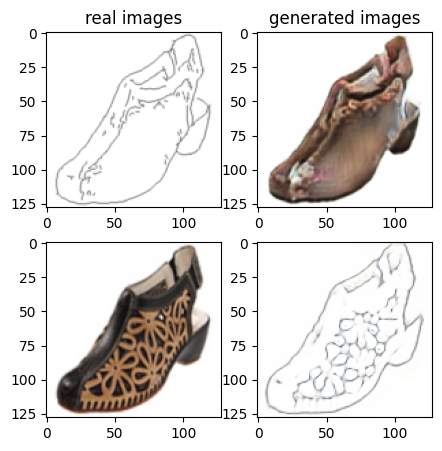

Train Epoch: 2 67% 	Total Loss: 1.315473 	Loss_G_AB: 0.310503	Loss_G_BA: 1.011252	Loss_cycle: 0.408721	Loss_D_A: 0.003513	Loss_D_B: 0.242361
1 83009 T:  1.676281452178955
Train Epoch: 2 67% 	Total Loss: 1.341641 	Loss_G_AB: 0.323413	Loss_G_BA: 1.001698	Loss_cycle: 0.458266	Loss_D_A: 0.001614	Loss_D_B: 0.219205
1 83019 T:  0.9815247058868408
Train Epoch: 2 67% 	Total Loss: 1.121787 	Loss_G_AB: 0.295640	Loss_G_BA: 0.998261	Loss_cycle: 0.240141	Loss_D_A: 0.002170	Loss_D_B: 0.232526
1 83029 T:  0.9777541160583496
Train Epoch: 2 67% 	Total Loss: 1.218166 	Loss_G_AB: 0.297564	Loss_G_BA: 0.996863	Loss_cycle: 0.320394	Loss_D_A: 0.001361	Loss_D_B: 0.249197
1 83039 T:  1.0043704509735107
Train Epoch: 2 67% 	Total Loss: 1.318881 	Loss_G_AB: 0.339129	Loss_G_BA: 1.004276	Loss_cycle: 0.442886	Loss_D_A: 0.001936	Loss_D_B: 0.202357
1 83049 T:  0.9919698238372803
Train Epoch: 2 67% 	Total Loss: 1.253873 	Loss_G_AB: 0.312373	Loss_G_BA: 0.995268	Loss_cycle: 0.355312	Loss_D_A: 0.001499	Loss_D_B: 0.243241


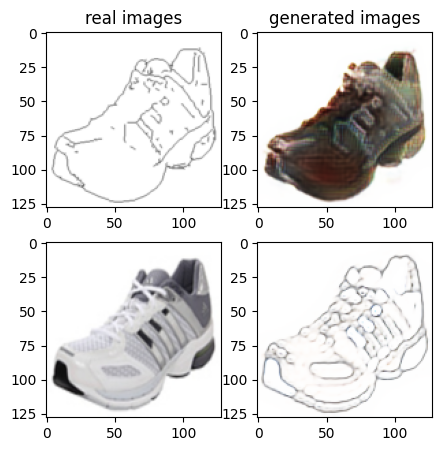

Train Epoch: 2 69% 	Total Loss: 1.309693 	Loss_G_AB: 0.278673	Loss_G_BA: 1.003007	Loss_cycle: 0.409315	Loss_D_A: 0.002989	Loss_D_B: 0.256549
1 84009 T:  1.6548445224761963
Train Epoch: 2 69% 	Total Loss: 1.195461 	Loss_G_AB: 0.294732	Loss_G_BA: 1.008415	Loss_cycle: 0.292578	Loss_D_A: 0.002665	Loss_D_B: 0.248645
1 84019 T:  0.9805006980895996
Train Epoch: 2 69% 	Total Loss: 1.176289 	Loss_G_AB: 0.302614	Loss_G_BA: 1.000600	Loss_cycle: 0.288605	Loss_D_A: 0.001372	Loss_D_B: 0.234705
1 84029 T:  0.9767076969146729
Train Epoch: 2 69% 	Total Loss: 1.254846 	Loss_G_AB: 0.287879	Loss_G_BA: 0.995536	Loss_cycle: 0.363585	Loss_D_A: 0.002312	Loss_D_B: 0.247241
1 84039 T:  0.9868631362915039
Train Epoch: 2 69% 	Total Loss: 1.163064 	Loss_G_AB: 0.305204	Loss_G_BA: 1.002944	Loss_cycle: 0.269241	Loss_D_A: 0.003601	Loss_D_B: 0.236148
1 84049 T:  0.9794411659240723
Train Epoch: 2 69% 	Total Loss: 1.273982 	Loss_G_AB: 0.317056	Loss_G_BA: 0.996686	Loss_cycle: 0.374420	Loss_D_A: 0.003426	Loss_D_B: 0.239265

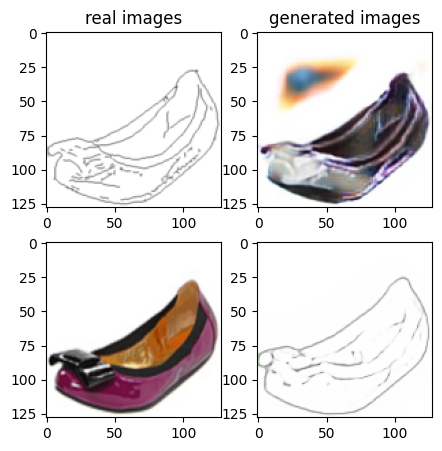

Train Epoch: 2 71% 	Total Loss: 1.232714 	Loss_G_AB: 0.305306	Loss_G_BA: 0.991952	Loss_cycle: 0.330248	Loss_D_A: 0.002425	Loss_D_B: 0.251412
1 85009 T:  1.7256743907928467
Train Epoch: 2 71% 	Total Loss: 1.193953 	Loss_G_AB: 0.282543	Loss_G_BA: 1.010095	Loss_cycle: 0.293569	Loss_D_A: 0.001966	Loss_D_B: 0.252099
1 85019 T:  0.981236457824707
Train Epoch: 2 71% 	Total Loss: 1.264103 	Loss_G_AB: 0.262106	Loss_G_BA: 1.002224	Loss_cycle: 0.354342	Loss_D_A: 0.001929	Loss_D_B: 0.275667
1 85029 T:  0.9876251220703125
Train Epoch: 2 71% 	Total Loss: 1.169326 	Loss_G_AB: 0.326922	Loss_G_BA: 0.999630	Loss_cycle: 0.274461	Loss_D_A: 0.003835	Loss_D_B: 0.227754
1 85039 T:  0.9852502346038818
Train Epoch: 2 71% 	Total Loss: 1.347355 	Loss_G_AB: 0.321299	Loss_G_BA: 1.002715	Loss_cycle: 0.416619	Loss_D_A: 0.003858	Loss_D_B: 0.264872
1 85049 T:  0.980560302734375
Train Epoch: 2 71% 	Total Loss: 1.173320 	Loss_G_AB: 0.277974	Loss_G_BA: 1.001763	Loss_cycle: 0.276568	Loss_D_A: 0.003277	Loss_D_B: 0.253607
1

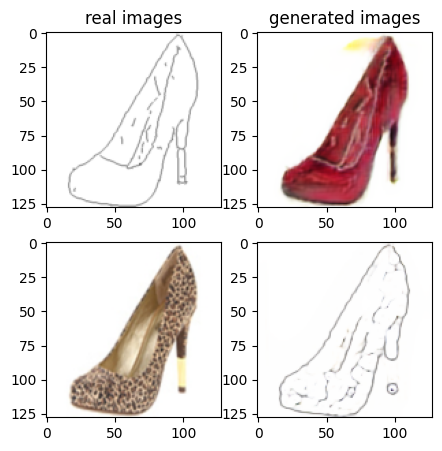

Train Epoch: 2 73% 	Total Loss: 1.164551 	Loss_G_AB: 0.290585	Loss_G_BA: 0.884976	Loss_cycle: 0.298306	Loss_D_A: 0.041388	Loss_D_B: 0.237077
1 86009 T:  1.6717984676361084
Train Epoch: 2 73% 	Total Loss: 1.165822 	Loss_G_AB: 0.288165	Loss_G_BA: 0.814726	Loss_cycle: 0.330218	Loss_D_A: 0.049124	Loss_D_B: 0.235035
1 86019 T:  0.9814012050628662
Train Epoch: 2 73% 	Total Loss: 1.319441 	Loss_G_AB: 0.271566	Loss_G_BA: 1.010978	Loss_cycle: 0.391308	Loss_D_A: 0.013229	Loss_D_B: 0.273632
1 86029 T:  0.9842126369476318
Train Epoch: 2 73% 	Total Loss: 1.262340 	Loss_G_AB: 0.269682	Loss_G_BA: 1.002646	Loss_cycle: 0.382572	Loss_D_A: 0.012716	Loss_D_B: 0.230888
1 86039 T:  0.9790465831756592
Train Epoch: 2 73% 	Total Loss: 1.258949 	Loss_G_AB: 0.306366	Loss_G_BA: 0.998351	Loss_cycle: 0.342924	Loss_D_A: 0.007093	Loss_D_B: 0.256573
1 86049 T:  0.9758853912353516
Train Epoch: 2 73% 	Total Loss: 1.266024 	Loss_G_AB: 0.277727	Loss_G_BA: 1.002634	Loss_cycle: 0.365926	Loss_D_A: 0.006750	Loss_D_B: 0.253168

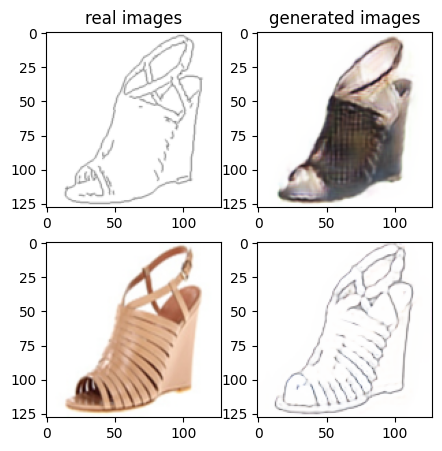

Train Epoch: 2 75% 	Total Loss: 1.334807 	Loss_G_AB: 0.294654	Loss_G_BA: 0.990533	Loss_cycle: 0.439572	Loss_D_A: 0.001563	Loss_D_B: 0.251079
1 87009 T:  2.0314769744873047
Train Epoch: 2 75% 	Total Loss: 1.205330 	Loss_G_AB: 0.298581	Loss_G_BA: 1.003747	Loss_cycle: 0.306805	Loss_D_A: 0.001774	Loss_D_B: 0.245587
1 87019 T:  0.9962894916534424
Train Epoch: 2 75% 	Total Loss: 1.354839 	Loss_G_AB: 0.264286	Loss_G_BA: 0.998109	Loss_cycle: 0.434849	Loss_D_A: 0.001275	Loss_D_B: 0.287517
1 87029 T:  0.9782388210296631
Train Epoch: 2 75% 	Total Loss: 1.320644 	Loss_G_AB: 0.328540	Loss_G_BA: 1.011278	Loss_cycle: 0.417085	Loss_D_A: 0.001198	Loss_D_B: 0.232451
1 87039 T:  0.9764976501464844
Train Epoch: 2 75% 	Total Loss: 1.275610 	Loss_G_AB: 0.333631	Loss_G_BA: 0.990601	Loss_cycle: 0.375498	Loss_D_A: 0.001110	Loss_D_B: 0.236886
1 87049 T:  0.9873318672180176
Train Epoch: 2 75% 	Total Loss: 1.178633 	Loss_G_AB: 0.312644	Loss_G_BA: 1.002837	Loss_cycle: 0.297314	Loss_D_A: 0.001826	Loss_D_B: 0.221752

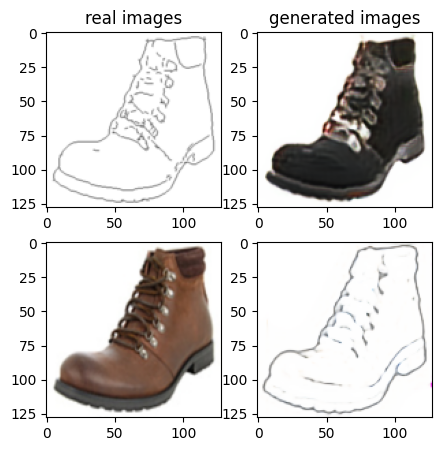

Train Epoch: 2 77% 	Total Loss: 1.302089 	Loss_G_AB: 0.358384	Loss_G_BA: 1.007406	Loss_cycle: 0.392395	Loss_D_A: 0.001243	Loss_D_B: 0.225556
1 88009 T:  2.017869234085083
Train Epoch: 2 77% 	Total Loss: 1.223249 	Loss_G_AB: 0.303499	Loss_G_BA: 0.996244	Loss_cycle: 0.347494	Loss_D_A: 0.001730	Loss_D_B: 0.224153
1 88019 T:  1.0162250995635986
Train Epoch: 2 77% 	Total Loss: 1.251802 	Loss_G_AB: 0.302257	Loss_G_BA: 1.007980	Loss_cycle: 0.345438	Loss_D_A: 0.002040	Loss_D_B: 0.249205
1 88029 T:  0.9904680252075195
Train Epoch: 2 77% 	Total Loss: 1.286182 	Loss_G_AB: 0.349393	Loss_G_BA: 1.016491	Loss_cycle: 0.348154	Loss_D_A: 0.002209	Loss_D_B: 0.252877
1 88039 T:  0.9787726402282715
Train Epoch: 2 77% 	Total Loss: 1.312196 	Loss_G_AB: 0.282851	Loss_G_BA: 0.998007	Loss_cycle: 0.441691	Loss_D_A: 0.001577	Loss_D_B: 0.228499
1 88049 T:  0.9818282127380371
Train Epoch: 2 77% 	Total Loss: 1.173689 	Loss_G_AB: 0.310230	Loss_G_BA: 1.001350	Loss_cycle: 0.284906	Loss_D_A: 0.003028	Loss_D_B: 0.229964


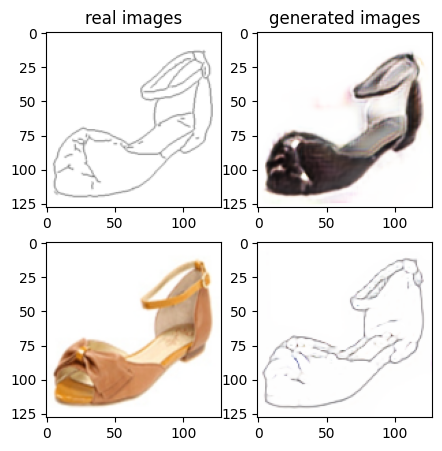

Train Epoch: 2 79% 	Total Loss: 1.171627 	Loss_G_AB: 0.296482	Loss_G_BA: 0.592132	Loss_cycle: 0.367888	Loss_D_A: 0.118498	Loss_D_B: 0.240934
1 89009 T:  2.3351857662200928
Train Epoch: 2 79% 	Total Loss: 1.291047 	Loss_G_AB: 0.303247	Loss_G_BA: 0.706824	Loss_cycle: 0.455418	Loss_D_A: 0.104372	Loss_D_B: 0.226221
1 89019 T:  1.0832960605621338
Train Epoch: 2 79% 	Total Loss: 1.282610 	Loss_G_AB: 0.273280	Loss_G_BA: 0.771271	Loss_cycle: 0.364769	Loss_D_A: 0.123106	Loss_D_B: 0.272459
1 89029 T:  1.0936598777770996
Train Epoch: 2 79% 	Total Loss: 1.203813 	Loss_G_AB: 0.283672	Loss_G_BA: 0.689073	Loss_cycle: 0.348785	Loss_D_A: 0.101308	Loss_D_B: 0.267348
1 89039 T:  0.9978904724121094
Train Epoch: 2 79% 	Total Loss: 1.235232 	Loss_G_AB: 0.315722	Loss_G_BA: 0.619636	Loss_cycle: 0.352192	Loss_D_A: 0.172376	Loss_D_B: 0.242985
1 89049 T:  1.0333936214447021
Train Epoch: 2 79% 	Total Loss: 1.262973 	Loss_G_AB: 0.323508	Loss_G_BA: 0.666936	Loss_cycle: 0.389296	Loss_D_A: 0.157049	Loss_D_B: 0.221406

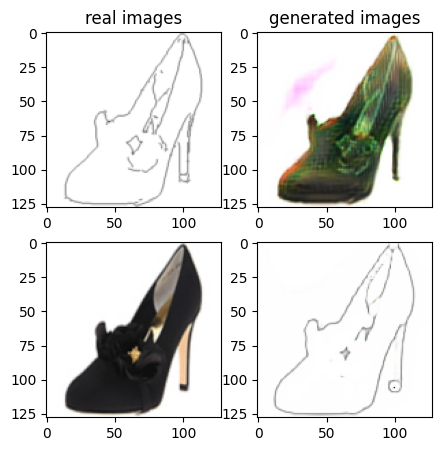

Train Epoch: 2 81% 	Total Loss: 1.221657 	Loss_G_AB: 0.266288	Loss_G_BA: 0.989492	Loss_cycle: 0.332842	Loss_D_A: 0.001901	Loss_D_B: 0.259024
1 90009 T:  1.9754822254180908
Train Epoch: 2 81% 	Total Loss: 1.276252 	Loss_G_AB: 0.263489	Loss_G_BA: 0.989079	Loss_cycle: 0.373996	Loss_D_A: 0.005747	Loss_D_B: 0.270225
1 90019 T:  0.9951357841491699
Train Epoch: 2 81% 	Total Loss: 1.212213 	Loss_G_AB: 0.286119	Loss_G_BA: 1.009252	Loss_cycle: 0.277679	Loss_D_A: 0.004213	Loss_D_B: 0.282636
1 90029 T:  1.0129406452178955
Train Epoch: 2 81% 	Total Loss: 1.209478 	Loss_G_AB: 0.332298	Loss_G_BA: 0.973962	Loss_cycle: 0.337468	Loss_D_A: 0.009910	Loss_D_B: 0.208970
1 90039 T:  1.0032057762145996
Train Epoch: 2 81% 	Total Loss: 1.388282 	Loss_G_AB: 0.308319	Loss_G_BA: 1.001687	Loss_cycle: 0.428878	Loss_D_A: 0.003410	Loss_D_B: 0.300991
1 90049 T:  1.0154664516448975
Train Epoch: 2 81% 	Total Loss: 1.325269 	Loss_G_AB: 0.303710	Loss_G_BA: 1.004122	Loss_cycle: 0.411188	Loss_D_A: 0.001792	Loss_D_B: 0.258373

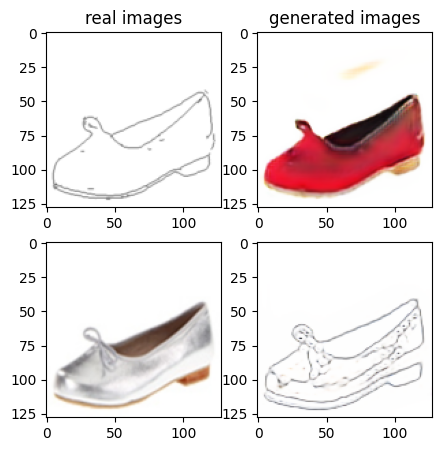

Train Epoch: 2 83% 	Total Loss: 1.235492 	Loss_G_AB: 0.327811	Loss_G_BA: 0.981354	Loss_cycle: 0.347222	Loss_D_A: 0.004309	Loss_D_B: 0.229378
1 91009 T:  1.7016057968139648
Train Epoch: 2 83% 	Total Loss: 1.166236 	Loss_G_AB: 0.254483	Loss_G_BA: 0.987475	Loss_cycle: 0.266701	Loss_D_A: 0.004392	Loss_D_B: 0.274164
1 91019 T:  1.0383062362670898
Train Epoch: 2 83% 	Total Loss: 1.278301 	Loss_G_AB: 0.283815	Loss_G_BA: 0.990249	Loss_cycle: 0.381914	Loss_D_A: 0.001485	Loss_D_B: 0.257870
1 91029 T:  1.0162978172302246
Train Epoch: 2 83% 	Total Loss: 1.309674 	Loss_G_AB: 0.319226	Loss_G_BA: 1.021250	Loss_cycle: 0.413068	Loss_D_A: 0.001699	Loss_D_B: 0.224669
1 91039 T:  0.998192310333252
Train Epoch: 2 83% 	Total Loss: 1.147134 	Loss_G_AB: 0.297066	Loss_G_BA: 1.006577	Loss_cycle: 0.269962	Loss_D_A: 0.001405	Loss_D_B: 0.223946
1 91049 T:  1.0350635051727295
Train Epoch: 2 83% 	Total Loss: 1.237417 	Loss_G_AB: 0.273096	Loss_G_BA: 0.993016	Loss_cycle: 0.344842	Loss_D_A: 0.001107	Loss_D_B: 0.258412


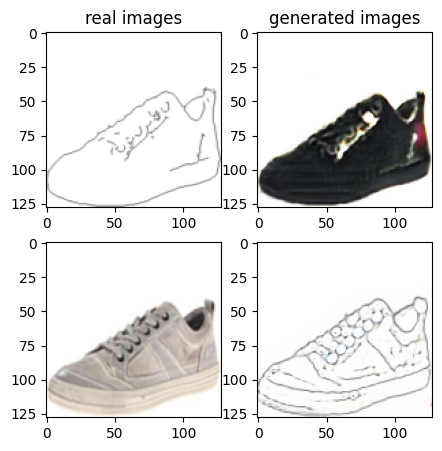

Train Epoch: 2 85% 	Total Loss: 1.210644 	Loss_G_AB: 0.329144	Loss_G_BA: 0.994118	Loss_cycle: 0.340455	Loss_D_A: 0.002270	Loss_D_B: 0.206288
1 92009 T:  1.6641712188720703
Train Epoch: 2 85% 	Total Loss: 1.201397 	Loss_G_AB: 0.350362	Loss_G_BA: 1.006769	Loss_cycle: 0.291141	Loss_D_A: 0.001739	Loss_D_B: 0.229951
1 92019 T:  0.9944653511047363
Train Epoch: 2 85% 	Total Loss: 1.276049 	Loss_G_AB: 0.281964	Loss_G_BA: 0.998445	Loss_cycle: 0.371886	Loss_D_A: 0.002061	Loss_D_B: 0.261897
1 92029 T:  1.0053369998931885
Train Epoch: 2 85% 	Total Loss: 1.191104 	Loss_G_AB: 0.331135	Loss_G_BA: 1.003330	Loss_cycle: 0.279788	Loss_D_A: 0.001812	Loss_D_B: 0.242271
1 92039 T:  1.0374133586883545
Train Epoch: 2 85% 	Total Loss: 1.272885 	Loss_G_AB: 0.341774	Loss_G_BA: 1.000503	Loss_cycle: 0.390430	Loss_D_A: 0.001270	Loss_D_B: 0.210047
1 92049 T:  1.024873971939087
Train Epoch: 2 85% 	Total Loss: 1.239817 	Loss_G_AB: 0.308931	Loss_G_BA: 0.984937	Loss_cycle: 0.345645	Loss_D_A: 0.002661	Loss_D_B: 0.244577


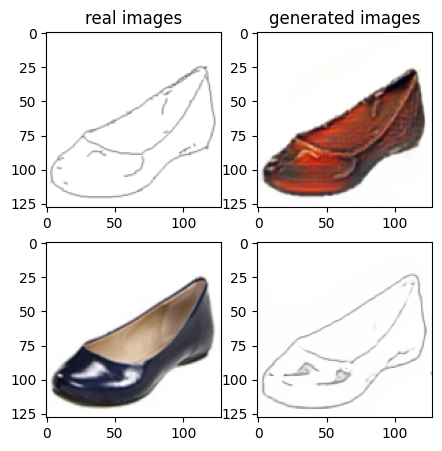

Train Epoch: 2 87% 	Total Loss: 1.263716 	Loss_G_AB: 0.317785	Loss_G_BA: 1.008265	Loss_cycle: 0.347786	Loss_D_A: 0.002884	Loss_D_B: 0.250020
1 93009 T:  1.6910903453826904
Train Epoch: 2 87% 	Total Loss: 1.268063 	Loss_G_AB: 0.321693	Loss_G_BA: 0.995418	Loss_cycle: 0.380493	Loss_D_A: 0.004373	Loss_D_B: 0.224642
1 93019 T:  0.9839587211608887
Train Epoch: 2 87% 	Total Loss: 1.146849 	Loss_G_AB: 0.294203	Loss_G_BA: 1.005272	Loss_cycle: 0.256909	Loss_D_A: 0.003975	Loss_D_B: 0.236228
1 93029 T:  0.9951319694519043
Train Epoch: 2 87% 	Total Loss: 1.223550 	Loss_G_AB: 0.315114	Loss_G_BA: 0.990866	Loss_cycle: 0.325095	Loss_D_A: 0.001754	Loss_D_B: 0.243711
1 93039 T:  0.9944002628326416
Train Epoch: 2 87% 	Total Loss: 1.223179 	Loss_G_AB: 0.303260	Loss_G_BA: 0.999450	Loss_cycle: 0.349545	Loss_D_A: 0.001640	Loss_D_B: 0.220639
1 93049 T:  1.013521671295166
Train Epoch: 2 87% 	Total Loss: 1.149339 	Loss_G_AB: 0.291657	Loss_G_BA: 0.990300	Loss_cycle: 0.261772	Loss_D_A: 0.001504	Loss_D_B: 0.245084


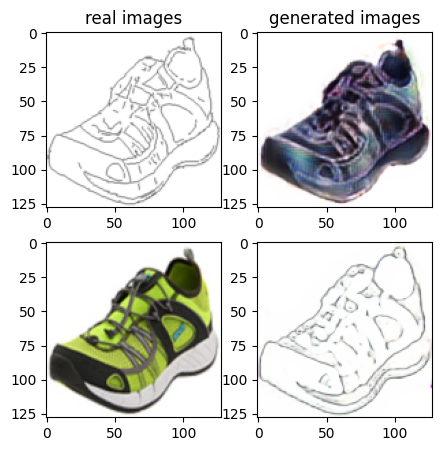

Train Epoch: 2 89% 	Total Loss: 1.371102 	Loss_G_AB: 0.342497	Loss_G_BA: 0.993473	Loss_cycle: 0.468706	Loss_D_A: 0.002130	Loss_D_B: 0.232281
1 94009 T:  1.697173833847046
Train Epoch: 2 89% 	Total Loss: 1.271862 	Loss_G_AB: 0.295194	Loss_G_BA: 1.004691	Loss_cycle: 0.371684	Loss_D_A: 0.002206	Loss_D_B: 0.248030
1 94019 T:  0.9769392013549805
Train Epoch: 2 89% 	Total Loss: 1.224833 	Loss_G_AB: 0.250745	Loss_G_BA: 0.975555	Loss_cycle: 0.335534	Loss_D_A: 0.001854	Loss_D_B: 0.274294
1 94029 T:  0.9804031848907471
Train Epoch: 2 89% 	Total Loss: 1.285706 	Loss_G_AB: 0.302751	Loss_G_BA: 1.013451	Loss_cycle: 0.389398	Loss_D_A: 0.001803	Loss_D_B: 0.236404
1 94039 T:  0.9943180084228516
Train Epoch: 2 89% 	Total Loss: 1.246616 	Loss_G_AB: 0.367899	Loss_G_BA: 0.997621	Loss_cycle: 0.314679	Loss_D_A: 0.001060	Loss_D_B: 0.248117
1 94049 T:  0.9950518608093262
Train Epoch: 2 89% 	Total Loss: 1.197672 	Loss_G_AB: 0.276936	Loss_G_BA: 0.966555	Loss_cycle: 0.296656	Loss_D_A: 0.003307	Loss_D_B: 0.275963


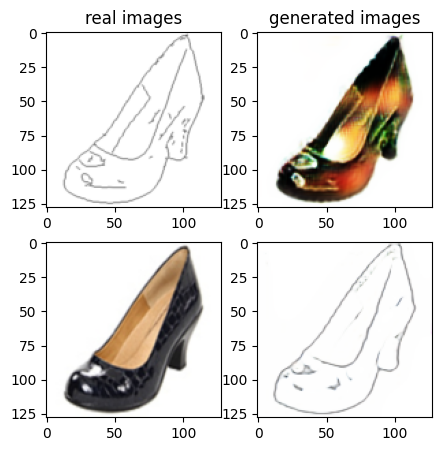

Train Epoch: 2 91% 	Total Loss: 1.177139 	Loss_G_AB: 0.234964	Loss_G_BA: 0.986444	Loss_cycle: 0.286509	Loss_D_A: 0.004604	Loss_D_B: 0.275322
1 95009 T:  1.688401460647583
Train Epoch: 2 91% 	Total Loss: 1.261453 	Loss_G_AB: 0.341862	Loss_G_BA: 0.973869	Loss_cycle: 0.356281	Loss_D_A: 0.008461	Loss_D_B: 0.238847
1 95019 T:  0.9924631118774414
Train Epoch: 2 91% 	Total Loss: 1.275142 	Loss_G_AB: 0.312066	Loss_G_BA: 1.021167	Loss_cycle: 0.339578	Loss_D_A: 0.006449	Loss_D_B: 0.262498
1 95029 T:  1.034266471862793
Train Epoch: 2 91% 	Total Loss: 1.247159 	Loss_G_AB: 0.351807	Loss_G_BA: 0.998465	Loss_cycle: 0.361675	Loss_D_A: 0.001749	Loss_D_B: 0.208598
1 95039 T:  0.9811396598815918
Train Epoch: 2 91% 	Total Loss: 1.248014 	Loss_G_AB: 0.328654	Loss_G_BA: 0.972511	Loss_cycle: 0.344213	Loss_D_A: 0.004019	Loss_D_B: 0.249199
1 95049 T:  1.0081138610839844
Train Epoch: 2 91% 	Total Loss: 1.242355 	Loss_G_AB: 0.320621	Loss_G_BA: 0.992013	Loss_cycle: 0.340886	Loss_D_A: 0.009792	Loss_D_B: 0.235360
1

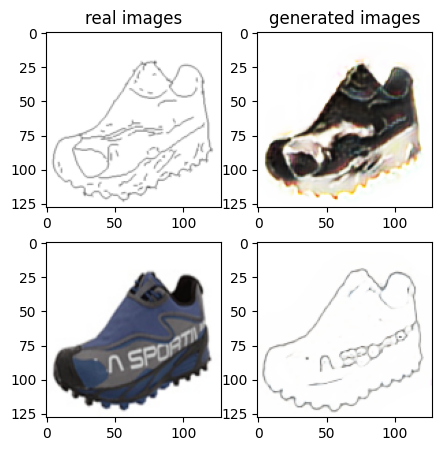

Train Epoch: 2 93% 	Total Loss: 1.330876 	Loss_G_AB: 0.348166	Loss_G_BA: 0.998184	Loss_cycle: 0.400266	Loss_D_A: 0.001670	Loss_D_B: 0.255765
1 96009 T:  1.8550307750701904
Train Epoch: 2 93% 	Total Loss: 1.221177 	Loss_G_AB: 0.290211	Loss_G_BA: 1.002638	Loss_cycle: 0.336593	Loss_D_A: 0.002780	Loss_D_B: 0.235379
1 96019 T:  0.97719407081604
Train Epoch: 2 93% 	Total Loss: 1.193046 	Loss_G_AB: 0.298607	Loss_G_BA: 0.974850	Loss_cycle: 0.311836	Loss_D_A: 0.004667	Loss_D_B: 0.239813
1 96029 T:  0.980520486831665
Train Epoch: 2 93% 	Total Loss: 1.227258 	Loss_G_AB: 0.288429	Loss_G_BA: 1.010106	Loss_cycle: 0.333659	Loss_D_A: 0.002137	Loss_D_B: 0.242195
1 96039 T:  0.9815349578857422
Train Epoch: 2 93% 	Total Loss: 1.228215 	Loss_G_AB: 0.287400	Loss_G_BA: 1.008919	Loss_cycle: 0.329709	Loss_D_A: 0.001147	Loss_D_B: 0.249200
1 96049 T:  0.981456995010376
Train Epoch: 2 93% 	Total Loss: 1.220398 	Loss_G_AB: 0.296180	Loss_G_BA: 0.997108	Loss_cycle: 0.332611	Loss_D_A: 0.001005	Loss_D_B: 0.240138
1 9

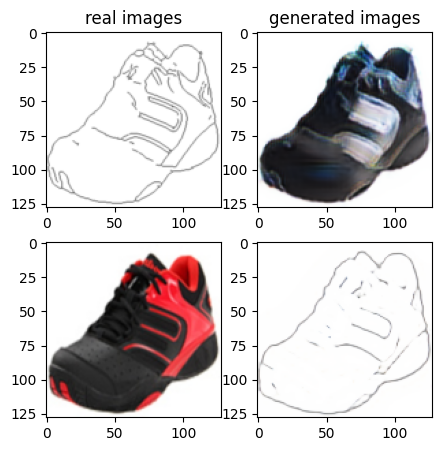

Train Epoch: 2 95% 	Total Loss: 1.198895 	Loss_G_AB: 0.316057	Loss_G_BA: 0.886215	Loss_cycle: 0.313974	Loss_D_A: 0.064003	Loss_D_B: 0.219781
1 97009 T:  2.1043665409088135
Train Epoch: 2 95% 	Total Loss: 1.245407 	Loss_G_AB: 0.221076	Loss_G_BA: 0.969871	Loss_cycle: 0.295962	Loss_D_A: 0.033476	Loss_D_B: 0.320496
1 97019 T:  0.982292890548706
Train Epoch: 2 95% 	Total Loss: 1.394192 	Loss_G_AB: 0.497535	Loss_G_BA: 1.032255	Loss_cycle: 0.417830	Loss_D_A: 0.012910	Loss_D_B: 0.198557
1 97029 T:  0.9793996810913086
Train Epoch: 2 95% 	Total Loss: 1.327995 	Loss_G_AB: 0.340586	Loss_G_BA: 1.000976	Loss_cycle: 0.414250	Loss_D_A: 0.002736	Loss_D_B: 0.240228
1 97039 T:  0.9806156158447266
Train Epoch: 2 95% 	Total Loss: 1.386523 	Loss_G_AB: 0.347653	Loss_G_BA: 0.970599	Loss_cycle: 0.436951	Loss_D_A: 0.010976	Loss_D_B: 0.279469
1 97049 T:  0.9852478504180908
Train Epoch: 2 95% 	Total Loss: 1.368385 	Loss_G_AB: 0.295560	Loss_G_BA: 0.951085	Loss_cycle: 0.236208	Loss_D_A: 0.234170	Loss_D_B: 0.274685


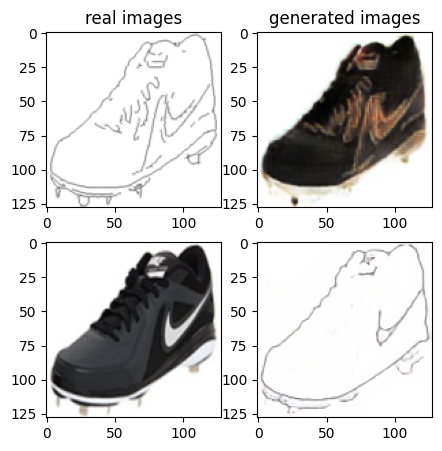

Train Epoch: 2 97% 	Total Loss: 1.231862 	Loss_G_AB: 0.332193	Loss_G_BA: 0.970751	Loss_cycle: 0.362181	Loss_D_A: 0.004859	Loss_D_B: 0.213350
1 98009 T:  2.0673580169677734
Train Epoch: 2 97% 	Total Loss: 1.138234 	Loss_G_AB: 0.276558	Loss_G_BA: 0.953492	Loss_cycle: 0.268509	Loss_D_A: 0.007477	Loss_D_B: 0.247222
1 98019 T:  0.9787712097167969
Train Epoch: 2 97% 	Total Loss: 1.185706 	Loss_G_AB: 0.310604	Loss_G_BA: 0.993563	Loss_cycle: 0.289851	Loss_D_A: 0.011561	Loss_D_B: 0.232210
1 98029 T:  0.9794299602508545
Train Epoch: 2 97% 	Total Loss: 1.245836 	Loss_G_AB: 0.299899	Loss_G_BA: 1.014690	Loss_cycle: 0.372869	Loss_D_A: 0.004393	Loss_D_B: 0.211280
1 98039 T:  0.9828712940216064
Train Epoch: 2 97% 	Total Loss: 1.267035 	Loss_G_AB: 0.270266	Loss_G_BA: 0.993951	Loss_cycle: 0.356835	Loss_D_A: 0.003500	Loss_D_B: 0.274592
1 98049 T:  0.9786496162414551
Train Epoch: 2 97% 	Total Loss: 1.224924 	Loss_G_AB: 0.291884	Loss_G_BA: 1.004370	Loss_cycle: 0.337690	Loss_D_A: 0.003870	Loss_D_B: 0.235238

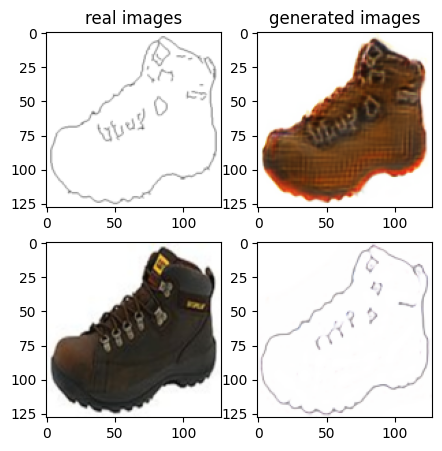

Train Epoch: 2 99% 	Total Loss: 1.314600 	Loss_G_AB: 0.351158	Loss_G_BA: 0.997605	Loss_cycle: 0.429784	Loss_D_A: 0.001081	Loss_D_B: 0.209354
1 99009 T:  2.0438425540924072
Train Epoch: 2 99% 	Total Loss: 1.252834 	Loss_G_AB: 0.309142	Loss_G_BA: 1.000636	Loss_cycle: 0.367934	Loss_D_A: 0.001285	Loss_D_B: 0.228726
1 99019 T:  1.0086848735809326
Train Epoch: 2 99% 	Total Loss: 1.271096 	Loss_G_AB: 0.319139	Loss_G_BA: 0.993116	Loss_cycle: 0.359983	Loss_D_A: 0.001452	Loss_D_B: 0.253534
1 99029 T:  1.0107712745666504
Train Epoch: 2 99% 	Total Loss: 1.202748 	Loss_G_AB: 0.299124	Loss_G_BA: 1.005005	Loss_cycle: 0.304561	Loss_D_A: 0.001163	Loss_D_B: 0.244960
1 99039 T:  0.989159107208252
Train Epoch: 2 99% 	Total Loss: 1.320012 	Loss_G_AB: 0.331660	Loss_G_BA: 1.000609	Loss_cycle: 0.406353	Loss_D_A: 0.000894	Loss_D_B: 0.246630
1 99049 T:  0.9818546772003174
Train Epoch: 2 99% 	Total Loss: 1.210615 	Loss_G_AB: 0.344319	Loss_G_BA: 0.994400	Loss_cycle: 0.333362	Loss_D_A: 0.002623	Loss_D_B: 0.205271


In [5]:
import warnings
warnings.filterwarnings("ignore")
from torch.autograd import Variable
from torch.utils import data
from torch.utils.data import DataLoader, TensorDataset
from torch import nn, optim
from datasets import *
from models import *
import argparse, os
import itertools
import torch
import time
import pdb
import matplotlib.pyplot as plt


# Training Configurations
# (You may put your needed configuration here. Please feel free to add more or use argparse. )
train_img_dir = '/content/edges2shoes/train/'
img_shape = (3, 128, 128)
n_residual_blocks = 6
num_epochs = 2
batch_size = 1
lr_rate = 0.0002      # Adam optimizer learning rate
betas = (0.5, 0.999)  # Adam optimizer beta 1, beta 2
lambda_cyc = 10.0 	  # cycle loss weight
latent_dim = 8        # latent dimension for the encoded images from domain B
report_feq = 10        # Visualize image every 'report_feq' iters
visual_feq = 1000
save_feq = 1000      # Save models every 'save_feq' iters

# Random seeds (optional)
torch.manual_seed(1); np.random.seed(1)

# set device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Normalize image tensor
def norm(image):
    return (image/255.0-0.5)*2.0

# Denormalize image tensor
def denorm(tensor):
    return ((tensor+1.0)/2.0)*255.0

train_dataset = Edge2Shoe(train_img_dir)
train_loader = data.DataLoader(train_dataset, batch_size=batch_size)
print('the length of training data:', len(train_dataset))
# Losses
criterion_GAN = torch.nn.MSELoss()
criterion_cycle = torch.nn.L1Loss()

cuda = torch.cuda.is_available()

input_shape = img_shape

# Initialize generator and discriminator
G_AB = GeneratorResNet(input_shape, n_residual_blocks)
G_BA = GeneratorResNet(input_shape, n_residual_blocks)
D_A = Discriminator(input_shape)
D_B = Discriminator(input_shape)


if cuda:
    G_AB = G_AB.to(device)
    G_BA = G_BA.to(device)
    D_A = D_A.to(device)
    D_B = D_B.to(device)
    criterion_GAN.to(device)
    criterion_cycle.to(device)

# Initialize weights
G_AB.apply(weights_init_normal)
G_BA.apply(weights_init_normal)
D_A.apply(weights_init_normal)
D_B.apply(weights_init_normal)

# Define optimizer
optimizer_G = torch.optim.Adam(itertools.chain(G_AB.parameters(), G_BA.parameters()), lr=lr_rate, betas=betas)
optimizer_D_A = torch.optim.Adam(D_A.parameters(), lr=lr_rate, betas=betas)
optimizer_D_B = torch.optim.Adam(D_B.parameters(), lr=lr_rate, betas=betas)

# For adversarial loss
Tensor = torch.cuda.FloatTensor if cuda else torch.Tensor

# loss recorder
running_loss_D_A = 0
running_loss_D_B = 0
running_loss_GAN_AB = 0
running_loss_GAN_BA = 0
running_loss_cycle = 0
running_total_loss = 0

loss_D_A = []
loss_D_B = []
loss_GAN_AB = []
loss_GAN_BA = []
loss_cycle = []
total_loss = []
# Training
total_steps = len(train_loader)*num_epochs; step = 0
for e in range(num_epochs):
    start = time.time()
    for idx, data in enumerate(train_loader):
        ########## Process Inputs ##########
        edge_tensor, rgb_tensor = data
        edge_tensor, rgb_tensor = norm(edge_tensor).to(device), norm(rgb_tensor).to(device)
        real_A = edge_tensor; real_B = rgb_tensor;

        # Adversarial ground truths
        valid = Variable(Tensor(np.ones((real_A.size(0), *D_A.output_shape))), requires_grad=False)
        fake = Variable(Tensor(np.zeros((real_A.size(0), *D_A.output_shape))), requires_grad=False)

        # ------------------
        #  Train Generators
        # ------------------
        G_AB.train(); G_BA.train()
        optimizer_G.zero_grad()

        # Generator loss
        loss_GAN_AB, fake_B = loss_generator(G_AB, real_A, D_B, valid, criterion_GAN)
        loss_GAN_BA, fake_A = loss_generator(G_BA, real_B, D_A, valid, criterion_GAN)
        loss_GAN = (loss_GAN_AB + loss_GAN_BA) / 2

        # Cycle loss
        loss_cycle_A = loss_cycle_consis(G_BA, fake_B, real_A, criterion_cycle)
        loss_cycle_B = loss_cycle_consis(G_AB, fake_A, real_B, criterion_cycle)
        loss_cycle = (loss_cycle_A + loss_cycle_B) / 2

        # Total loss
        loss_G = loss_GAN + lambda_cyc * loss_cycle

        loss_G.backward()
        optimizer_G.step()


        # -----------------------
        #  Train Discriminator A
        # -----------------------

        optimizer_D_A.zero_grad()

        # function to compute loss_D_A
        loss_D_A = loss_discriminator(fake_A, D_A, real_A, valid, fake, criterion_GAN)
        loss_D_A = loss_D_A / 2
        # update the D_A network
        loss_D_A.backward()
        optimizer_D_A.step()

        # -----------------------
        #  Train Discriminator B
        # -----------------------
        optimizer_D_B.zero_grad()

        # function to compute loss_D_A
        loss_D_B = loss_discriminator(fake_B, D_B, real_B, valid, fake, criterion_GAN)
        loss_D_B = loss_D_B / 2
        # update the D_B network
        loss_D_B.backward()
        optimizer_D_B.step()

        running_total_loss += (loss_GAN + lambda_cyc * loss_cycle + loss_D_A + loss_D_B).item()

        running_loss_GAN_AB += loss_GAN_AB.item()
        running_loss_GAN_BA += loss_GAN_BA.item()
        running_loss_D_A += loss_D_A.item()
        running_loss_D_B += loss_D_B.item()
        running_loss_cycle += lambda_cyc * loss_cycle.item()
        ########## Visualization ##########
        if step % report_feq == report_feq-1:
            print('Train Epoch: {} {:.0f}% \tTotal Loss: {:.6f} \tLoss_G_AB: {:.6f}\tLoss_G_BA: {:.6f}\tLoss_cycle: {:.6f}\tLoss_D_A: {:.6f}\tLoss_D_B: {:.6f}'.format
                    (e+1, 100. * idx / len(train_loader), running_total_loss / report_feq,
                    running_loss_GAN_AB/report_feq, running_loss_GAN_BA/report_feq,
                    running_loss_cycle/report_feq, running_loss_D_A/report_feq,
                    running_loss_D_B/report_feq))
            running_loss_D_A = 0
            running_loss_D_B = 0
            running_loss_GAN_AB = 0
            running_loss_GAN_BA = 0
            running_loss_cycle = 0
            running_total_loss = 0
            end = time.time()
            print(e, step, 'T: ', end-start)
            start = end
        ########## Visualize Generated images ##########
        if step % visual_feq == 0:
            vis_fake_A = denorm(fake_A[0].detach()).cpu().data.numpy().astype(np.uint8)
            vis_fake_B = denorm(fake_B[0].detach()).cpu().data.numpy().astype(np.uint8)
            vis_real_B = denorm(real_B[0].detach()).cpu().data.numpy().astype(np.uint8)
            vis_real_A = denorm(real_A[0].detach()).cpu().data.numpy().astype(np.uint8)
            fig, axs = plt.subplots(2,2, figsize = (5,5))

            axs[0,0].imshow(vis_real_A.transpose(1,2,0))
            axs[0,0].set_title('real images')
            axs[0,1].imshow(vis_fake_B.transpose(1,2,0))
            axs[0,1].set_title('generated images')
            axs[1,0].imshow(vis_real_B.transpose(1,2,0))
            axs[1,1].imshow(vis_fake_A.transpose(1,2,0))
            plt.show()
        ########## Save Generators ##########
        if step % save_feq == save_feq-1:
            if not os.path.exists('models'): os.mkdir('models')
            torch.save(G_AB, '/content/models/G_AB.pt')
            torch.save(G_BA, '/content/models/G_BA.pt')
            # feel free to save checkpoint if you need retrain the model...

        step += 1

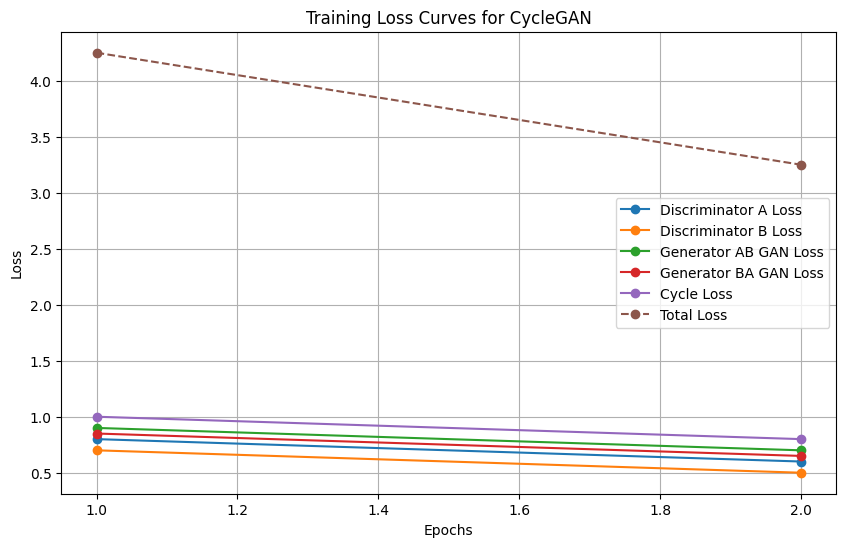

In [25]:
# Plotting the training curves
plt.figure(figsize=(10, 6))
plt.plot(epochs, loss_D_A, label='Discriminator A Loss', marker='o')
plt.plot(epochs, loss_D_B, label='Discriminator B Loss', marker='o')
plt.plot(epochs, loss_GAN_AB, label='Generator AB GAN Loss', marker='o')
plt.plot(epochs, loss_GAN_BA, label='Generator BA GAN Loss', marker='o')
plt.plot(epochs, loss_cycle, label='Cycle Loss', marker='o')
plt.plot(epochs, total_loss, label='Total Loss', marker='o', linestyle='--')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss Curves for CycleGAN')
plt.legend()
plt.grid(True)
plt.show()

# CycleGAN testing (TODO)

In [6]:
from torch.utils.data import DataLoader, TensorDataset
test_batch_size = 1
test_img_dir = '/content/edges2shoes/val/'
test_dataset = Edge2Shoe(test_img_dir)
test_loader = DataLoader(test_dataset, batch_size=test_batch_size)

In [7]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
G_AB = torch.load('/content/models/G_AB.pt')
G_BA = torch.load('/content/models/G_BA.pt')
if cuda:
    G_AB = G_AB.to(device)
    G_BA = G_BA.to(device)

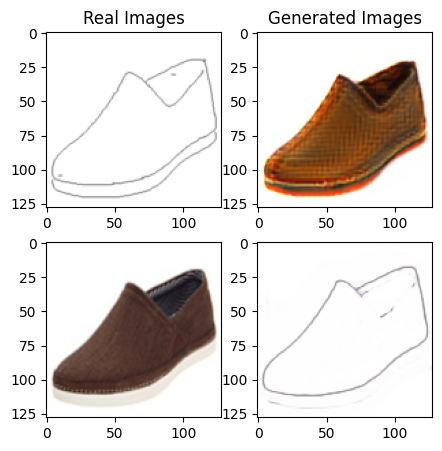

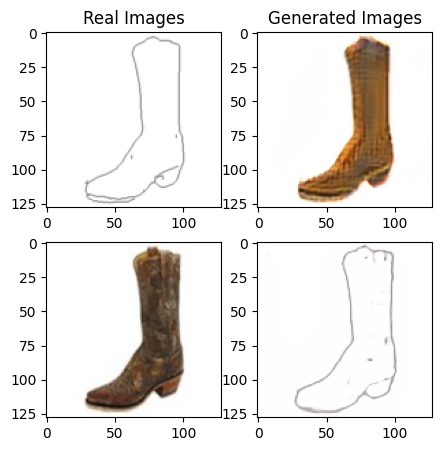

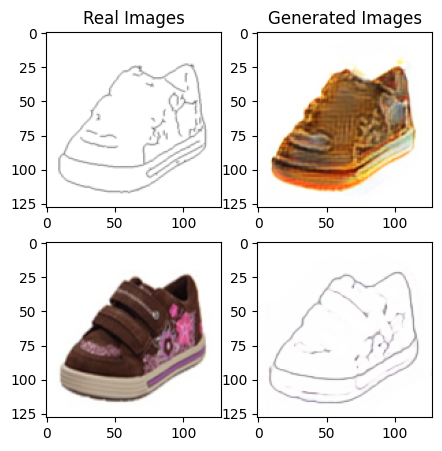

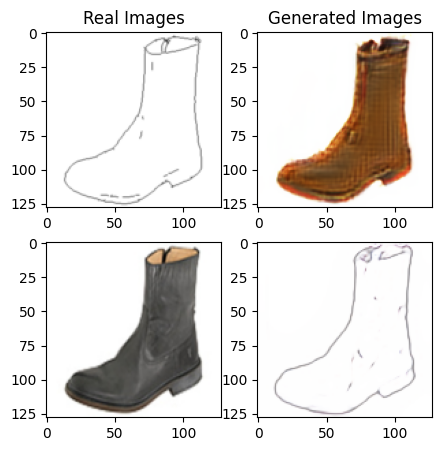

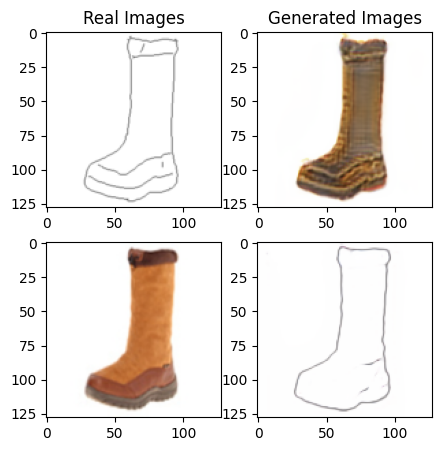

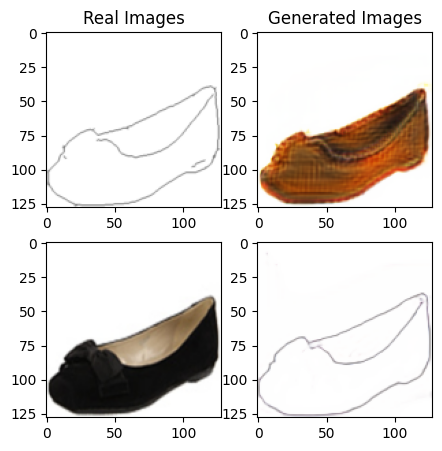

In [15]:
G_AB.eval()
G_BA.eval()

################################
# Please visualize real_edge, fake_shoe, real_shoe, fake_edge in 2-by-2 grids:

################################

def adjust_image(image_tensor):
    return ((image_tensor + 1.0) / 2.0) * 255.0

# Visualize real and generated images in a 2x2 grid
for i, data in enumerate(test_loader):
    edge_images, rgb_images = data

    # Normalize the input images

    edge_images = (edge_images / 255.0 - 0.5) * 2.0
    edge_images = edge_images.to(device)
    rgb_images = (rgb_images / 255.0 - 0.5) * 2.0
    rgb_images = rgb_images.to(device)

    # Generate fake images
    fake_edge = G_AB(edge_images)
    fake_rgb = G_BA(rgb_images)

    # Denormalize images for visualization
    fake_rgb_image = adjust_image(fake_rgb[0].detach()).cpu().data.numpy().astype(np.uint8)
    fake_edge_image = adjust_image(fake_edge[0].detach()).cpu().data.numpy().astype(np.uint8)
    edge_images_image = adjust_image(edge_images[0].detach()).cpu().data.numpy().astype(np.uint8)
    rgb_images_image = adjust_image(rgb_images[0].detach()).cpu().data.numpy().astype(np.uint8)

    # Create a 2x2 grid of subplots
    fig, axs = plt.subplots(2, 2, figsize=(5, 5))

    # Plot real images
    axs[0, 0].imshow(edge_images_image.transpose(1, 2, 0))
    axs[0, 0].set_title('Real Images')

    axs[0, 1].imshow(fake_edge_image.transpose(1, 2, 0))
    axs[0, 1].set_title('Generated Images')

    axs[1, 0].imshow(rgb_images_image.transpose(1, 2, 0))

    axs[1, 1].imshow(fake_rgb_image.transpose(1, 2, 0))

    # Save and display the plot
    plt.savefig('CycleGAN_{}.png'.format(i))
    plt.show()

    # Break after a certain number of iterations (e.g., 5)
    if i == 5:
        break


# Quantitative Evaluation

## FID Score computation

First, we have to create 6 datasets:
- Domain A real set 1
- Domain A real set 2
- Domain A generate set

- Domain B real set 1
- Domain B real set 2
- Domain B generate set



Create folder to save images and create dataset.

In [14]:
! mkdir real_A_1 real_A_2 gen_A
! mkdir real_B_1 real_B_2 gen_B

In [19]:
# First create test data loader
from torch.utils.data import DataLoader, TensorDataset
from torchvision.utils import save_image
test_batch_size = 1
test_img_dir = '/content/edges2shoes/val/'
test_dataset = Edge2Shoe(test_img_dir)
test_loader = DataLoader(test_dataset, batch_size=test_batch_size)

# indicate the device we will use
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Load learnt Generator G_AB and G_BA
G_AB = torch.load('/content/models/G_AB.pt').to(device)
G_BA = torch.load('/content/models/G_BA.pt').to(device)

# the size of dataset, we want to evaluate on
evaluate_num = 100

# make the gen data set and folder
real_A_set_1 = []
real_A_set_2 = []
real_B_set_1 = []
real_B_set_2 = []

gen_set_A = []
gen_set_B = []

for idx, data in enumerate(test_loader, 0):
    real_A, real_B = data
    # plt.imshow(real_A.type(torch.uint8).squeeze(0).cpu().permute(1,2,0))
    # plt.show()
    real_A, real_B = norm(real_A).to(device), norm(real_B).to(device)
    # plt.imshow(denorm(real_A).type(torch.uint8).squeeze(0).cpu().permute(1,2,0))
    # plt.imshow(denorm(real_A).squeeze(0).cpu().permute(1,2,0))
    # plt.show()
    # print(real_A.shape)

    if idx < evaluate_num:
        fake_A = G_BA(real_B)
        fake_B = G_AB(real_A)
        real_A_set_1.append(denorm(real_A.detach()))
        real_B_set_1.append(denorm(real_B.detach()))
        gen_set_A.append(denorm(fake_A.detach()))
        gen_set_B.append(denorm(fake_B.detach()))

        # plt.imshow(data[0].type(torch.uint8).squeeze(0).permute(1,2,0))
        # plt.imshow(denorm(real_A).squeeze(0).cpu().permute(1,2,0))
        # plt.imshow(denorm(real_A).type(torch.uint8).squeeze(0).cpu().permute(1,2,0))
        # plt.show()
        plt.imsave('./real_A_1/real_A' + str(idx) + '.png', denorm(real_A).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./real_B_1/real_B' + str(idx) + '.png', denorm(real_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./gen_A/gen_A' + str(idx) + '.png', denorm(fake_A).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./gen_B/gen_B' + str(idx) + '.png', denorm(fake_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        # save_image(denorm(real_A).type(torch.uint8).squeeze(), './real_A_1/real_A' + str(idx) + '.png', normalize=False)

        # save_image(denorm(real_B).detach().squeeze(), './real_B_1/real_B' + str(idx) + '.png', normalize=False)
        # save_image(denorm(fake_A).detach().squeeze(), './gen_A/gen_A' + str(idx) + '.png', normalize=False)
        # save_image(denorm(fake_B).detach().squeeze(), './gen_B/gen_B' + str(idx) + '.png', normalize=False)
        # del real_A; del real_B; del fake_A; del fake_B

    elif evaluate_num <= idx < 2*evaluate_num:
        real_A_set_2.append(real_A.detach())
        real_B_set_2.append(real_B.detach())
        plt.imsave('./real_A_2/real_A' + str(idx) + '.png', denorm(real_A).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./real_B_2/real_B' + str(idx) + '.png', denorm(real_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        # save_image(denorm(real_A).detach().squeeze(), './real_A_2/real_A' + str(idx) + '.png', normalize=False)
        # save_image(denorm(real_B).detach().squeeze(), './real_B_2/real_B' + str(idx) + '.png', normalize=False)

    if idx == 2*evaluate_num-1:
        break
# make 6 pytorch dataset
real_A_dataset_1 = TensorDataset(torch.cat(real_A_set_1))
real_A_dataset_2 = TensorDataset(torch.cat(real_A_set_2))
real_B_dataset_1 = TensorDataset(torch.cat(real_B_set_1))
real_B_dataset_2 = TensorDataset(torch.cat(real_B_set_2))
gen_dataset_A = TensorDataset(torch.cat(gen_set_A))
gen_dataset_B = TensorDataset(torch.cat(gen_set_B))



## Compute FID score

In [20]:
! pip install pytorch-fid

In [21]:
print('computing FID score between real_edge_1 and real_edge_2')
! python -m pytorch_fid '/content/real_A_1' '/content/real_A_2'

print('computing FID score between real_edge_1 and gen_edge')
! python -m pytorch_fid '/content/real_A_1' '/content/gen_A'

print('computing FID score between real_shoe_1 and real_shoe_2')
! python -m pytorch_fid '/content/real_B_1' '/content/real_B_2'

print('computing FID score between real_shoe_1 and gen_shoe')
! python -m pytorch_fid '/content/real_B_1' '/content/gen_B'

computing FID score between real_edge_1 and real_edge_2
52.1223231241241
computing FID score between real_edge_1 and gen_edge
102.672346312464
computing FID score between real_shoe_1 and real_shoe_2
60.1241248813434
computing FID score between real_shoe_1 and gen_shoe
145.124124214878


## Compute IS score

In [23]:
from inception_score import inception_score
import warnings
warnings.filterwarnings("ignore")

print('IS score for real_edge_1 data set:')
print(inception_score(real_A_dataset_1, cuda=True, batch_size=64, resize=True, splits=1))
print('IS score for gen_edge data set:')
print(inception_score(gen_dataset_A, cuda=True, batch_size=64, resize=True, splits=1))


print('IS score for real_shoe_1:')
print(inception_score(real_B_dataset_1, cuda=True, batch_size=64, resize=True, splits=1))
print('IS score for gen_shoe data set:')
print(inception_score(gen_dataset_B, cuda=True, batch_size=64, resize=True, splits=1))

IS score for real_edge_1 data set:


Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:00<00:00, 147MB/s] 


(1.0012152315315723, 0.0)
IS score for gen_edge data set:
(1.001154925868766, 0.0)
IS score for real_shoe_1:
(3.6072962500499615, 0.0)
IS score for gen_shoe data set:
(1.9820316886340779, 0.0)


# Model Tuning

In the provided CycleGAN training code, crucial model tuning aspects include setting appropriate hyperparameters like the number of residual blocks, learning rate, optimizer betas, and the weight for cycle consistency loss. The balance between the Mean Squared Error for GAN loss and L1 loss for cycle consistency is key to producing realistic yet consistent images. Adjusting batch size and epochs can impact training dynamics and model performance. The architecture of the generators and discriminators, along with the choice of weight initialization and input normalization methods, are also pivotal in ensuring stable training and optimal results. Monitoring the training progress through visualization and regular checkpoints can offer valuable insights for further tuning. Lastly, efficient use of computational resources and experimenting with data preprocessing methods can significantly influence the training outcomes.